In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
/home/ludotosk/anaconda3/envs/tesi/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-nTE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33898,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340490,1499342453585,113095,36,12216,1499342340490,1499342453585,113095,24,6418,1499342340490,1499342453585,113095,12,5798,66,339.333333,236.650194,989,66,267.416667,205.748880,469,382,483.166667,236.274430,989,0,3231.285714,6169.592586,16483,0,4917.173913,7082.328024,16483,3,10281.363636,7053.298154,16483,0,0,0,0,36,24,0,0,0,0,0,0,24,12,0,0,0,0,0,0,12,12,0,0,BENIGN
1,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33904,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340491,1499342453964,113473,54,15605,1499342340491,1499342453964,113473,34,7926,1499342340491,1499342453918,113427,20,7679,66,288.981481,200.112750,1205,66,233.117647,173.216936,469,192,383.950000,210.983780,1205,0,2141.000000,5223.952902,16483,0,3438.575758,6304.323294,16483,0,5969.842105,7399.526406,16483,0,0,0,0,54,40,0,0,0,0,0,0,34,20,0,0,0,0,0,0,20,20,0,0,BENIGN
2,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59555,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,53,17,4,0,1499342357298,1499342357299,1,2,296,1499342357298,1499342357298,0,1,93,1499342357299,1499342357299,0,1,203,93,148.000000,77.781746,203,93,93.000000,0.000000,93,203,203.000000,0.000000,203,1,1.000000,0.000000,1,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN
3,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59135,65.55.44.109,00:c1:b1:14:eb:31,00:c1:b1,443,6,4,0,1499342357299,1499342417611,60312,18,7559,1499342357299,1499342417611,60312,10,2888,1499342357349,1499342417610,60261,8,4671,60,419.944444,522.680700,1514,60,288.800000,393.690177,1147,60,583.875000,639.465723,1514,0,3547.764706,14539.437969,59969,0,6701.333333,19975.413926,59969,0,8608.714286,22683.047882,60049,2,0,0,0,17,7,0,2,1,0,0,0,9,4,0,1,1,0,0,0,8,3,0,1,BENIGN
4,0,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,123,129.6.15.29,00:c1:b1:14:eb:31,00:c1:b1,123,17,4,0,1499342395411,1499342395442,31,2,180,1499342395411,1499342395411,0,1,90,1499342395442,1499342395442,0,1,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,31,31.000000,0.000000,31,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111131 entries, 0 to 2111130
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

In [4]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      76.37
PortScan                    10.61
DoS Hulk                     7.49
DDoS                         4.41
DoS GoldenEye                0.37
DoS slowloris                0.25
FTP-Patator                  0.19
SSH-Patator                  0.14
DoS Slowhttptest             0.13
Bot                          0.03
Web Attack - Brute Force     0.01
Web Attack - XSS             0.00
Infiltration                 0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [5]:
ds.label.value_counts()

label
BENIGN                        1612267
PortScan                       223886
DoS Hulk                       158027
DDoS                            93178
DoS GoldenEye                    7916
DoS slowloris                    5192
FTP-Patator                      3992
SSH-Patator                      2980
DoS Slowhttptest                 2727
Bot                               738
Web Attack - Brute Force          151
Web Attack - XSS                   27
Infiltration                       27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [6]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [7]:
sample_weights = ds.label.value_counts().to_dict()

In [8]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [9]:
params = {
    'iterations': 40,
    'depth': 11, # 11
    'learning_rate': 0.4,
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [11]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [12]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='macro')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='macro')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:
0:	learn: 0.4271675	total: 1.4s	remaining: 54.7s
1:	learn: 0.2875286	total: 3.04s	remaining: 57.9s
2:	learn: 0.2292016	total: 4.43s	remaining: 54.6s
3:	learn: 0.1759812	total: 6.01s	remaining: 54.1s
4:	learn: 0.1480069	total: 7.61s	remaining: 53.2s
5:	learn: 0.1286637	total: 9s	remaining: 51s
6:	learn: 0.1121420	total: 10.6s	remaining: 50s
7:	learn: 0.0991247	total: 11.9s	remaining: 47.8s
8:	learn: 0.0886448	total: 13.5s	remaining: 46.4s
9:	learn: 0.0806351	total: 15s	remaining: 45.1s
10:	learn: 0.0743886	total: 16.4s	remaining: 43.1s
11:	learn: 0.0688536	total: 17.9s	remaining: 41.8s
12:	learn: 0.0639314	total: 19.3s	remaining: 40.1s
13:	learn: 0.0608948	total: 20.8s	remaining: 38.7s
14:	learn: 0.0592351	total: 20.9s	remaining: 34.8s
15:	learn: 0.0561177	total: 22.4s	remaining: 33.6s
16:	learn: 0.0537128	total: 23.8s	remaining: 32.2s
17:	learn: 0.0491840	total: 25.3s	remaining: 30.9s
18:	learn: 0.0472934	total: 26.8s	remaining: 29.7s
19:	learn: 0.0453767	total: 28.3s	remaining

In [13]:
%time cat.fit(X_train, y_train)

0:	learn: 0.3695706	total: 1.31s	remaining: 51s
1:	learn: 0.2754083	total: 2.88s	remaining: 54.7s
2:	learn: 0.2226262	total: 4.42s	remaining: 54.5s
3:	learn: 0.1743587	total: 6s	remaining: 54s
4:	learn: 0.1469528	total: 7.49s	remaining: 52.4s
5:	learn: 0.1261115	total: 9.13s	remaining: 51.7s
6:	learn: 0.1094167	total: 10.6s	remaining: 49.9s
7:	learn: 0.0962245	total: 12.1s	remaining: 48.4s
8:	learn: 0.0869748	total: 13.3s	remaining: 45.9s
9:	learn: 0.0798432	total: 14.9s	remaining: 44.8s
10:	learn: 0.0734660	total: 16.3s	remaining: 42.9s
11:	learn: 0.0686492	total: 17.9s	remaining: 41.7s
12:	learn: 0.0646116	total: 19.4s	remaining: 40.4s
13:	learn: 0.0597038	total: 20.7s	remaining: 38.4s
14:	learn: 0.0566613	total: 22.1s	remaining: 36.8s
15:	learn: 0.0516523	total: 23.5s	remaining: 35.3s
16:	learn: 0.0488243	total: 25.2s	remaining: 34.1s
17:	learn: 0.0456513	total: 26.7s	remaining: 32.7s
18:	learn: 0.0438128	total: 28.2s	remaining: 31.1s
19:	learn: 0.0420545	total: 29.5s	remaining: 29.

In [14]:
with open('models/cat.pickle', 'wb') as handle:
    pickle.dump(cat, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [15]:
%time y_predicted_train = cat.predict(X_train)
%timeit cat.predict(X_test)
y_predicted_test = cat.predict(X_test)

CPU times: user 18.5 ms, sys: 4.8 ms, total: 23.3 ms
Wall time: 11 ms


2.51 ms ± 467 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [16]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'macro')

,Measure,Train,Test
0,ACCURACY,0.995071,0.985545
1,PRECISION,0.989209,0.988410
2,RECALL,0.985829,0.892777
3,F1 SCORE,0.987461,0.923096


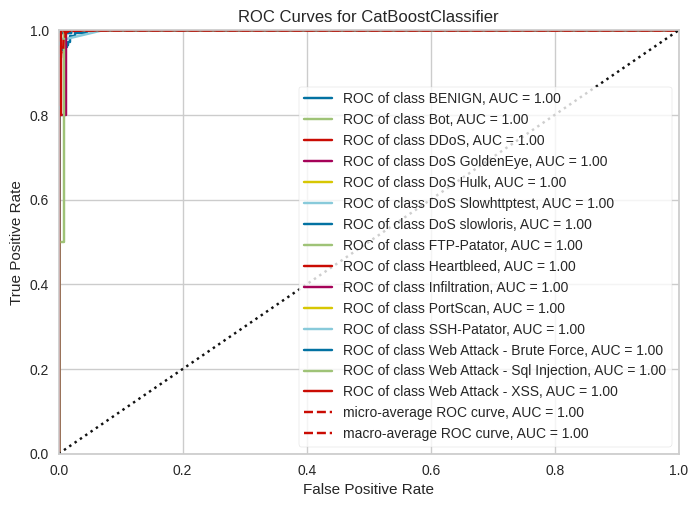

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [17]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

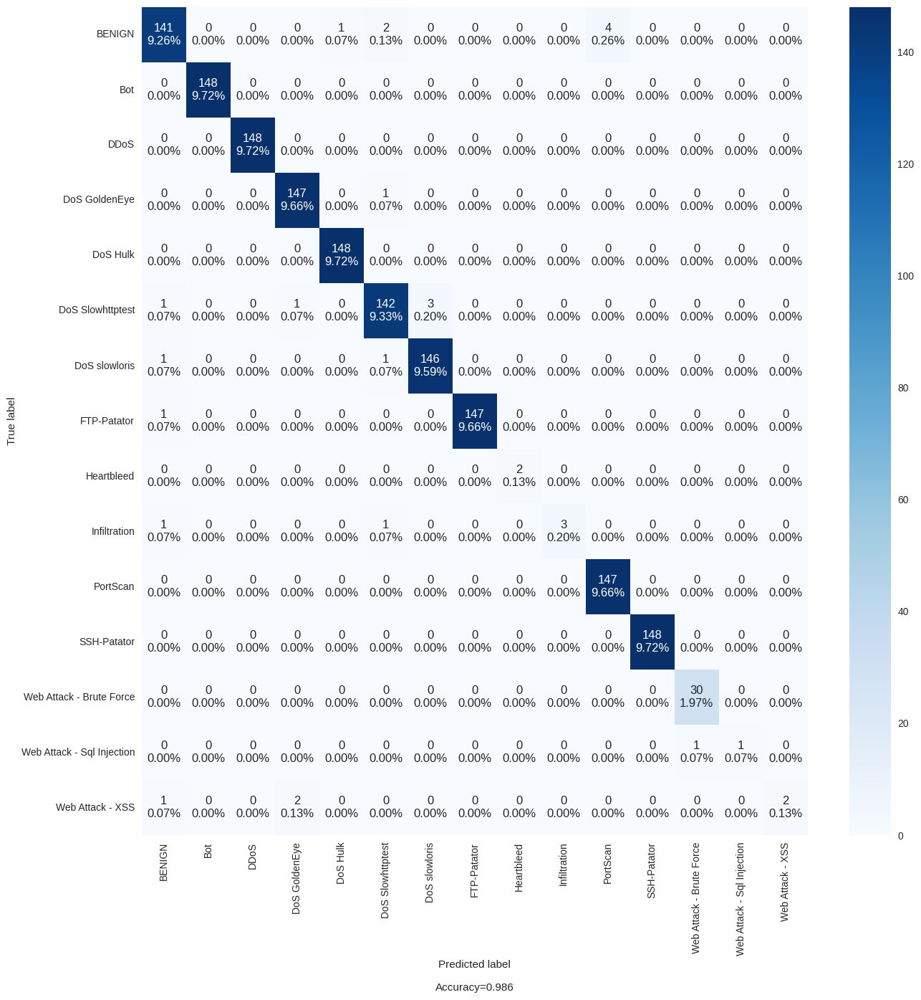

In [18]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

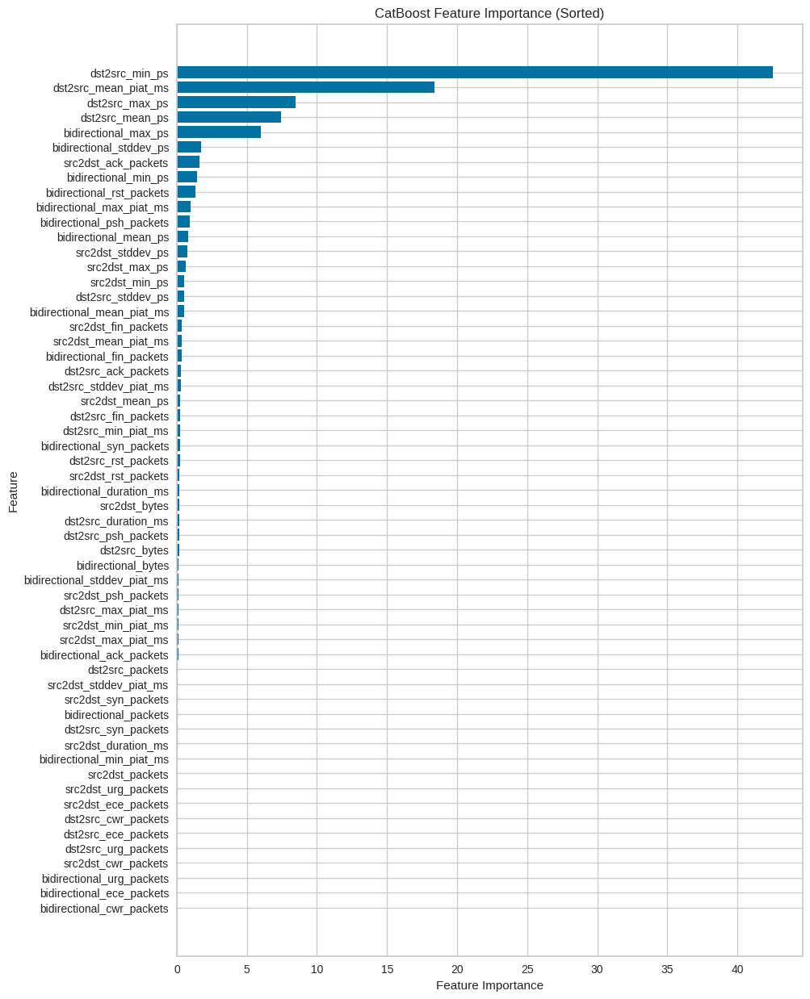

In [19]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [20]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 1min 25s, sys: 768 ms, total: 1min 26s
Wall time: 10.2 s


In [21]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

In [22]:
def make_plot(i):
    exp = Explanation(sv.values[:,:,i], 
                  sv.base_values[:,i], 
                  data=X_train, 
                  feature_names=X_res.columns)

    plots.bar(exp, max_display=20, show=False)
    # plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
    plt.show()
    plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)
    plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)
    plots.bar(exp.abs.cohorts(2).mean(0))
    plots.heatmap(exp, instance_order=exp.sum(1))

## Benign shap

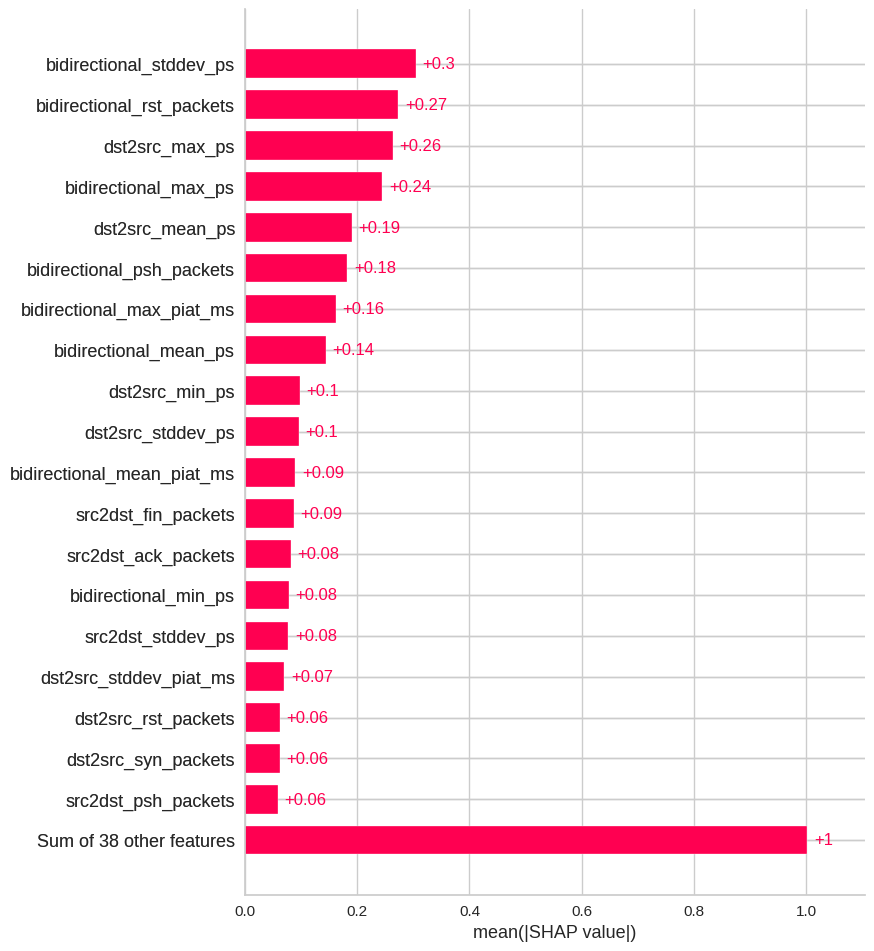

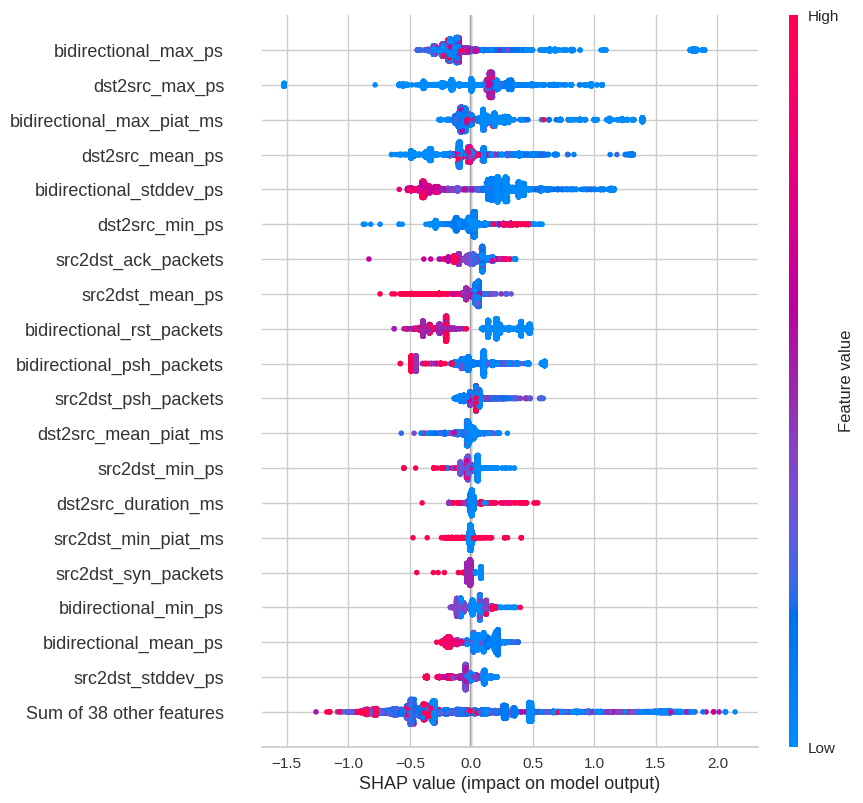

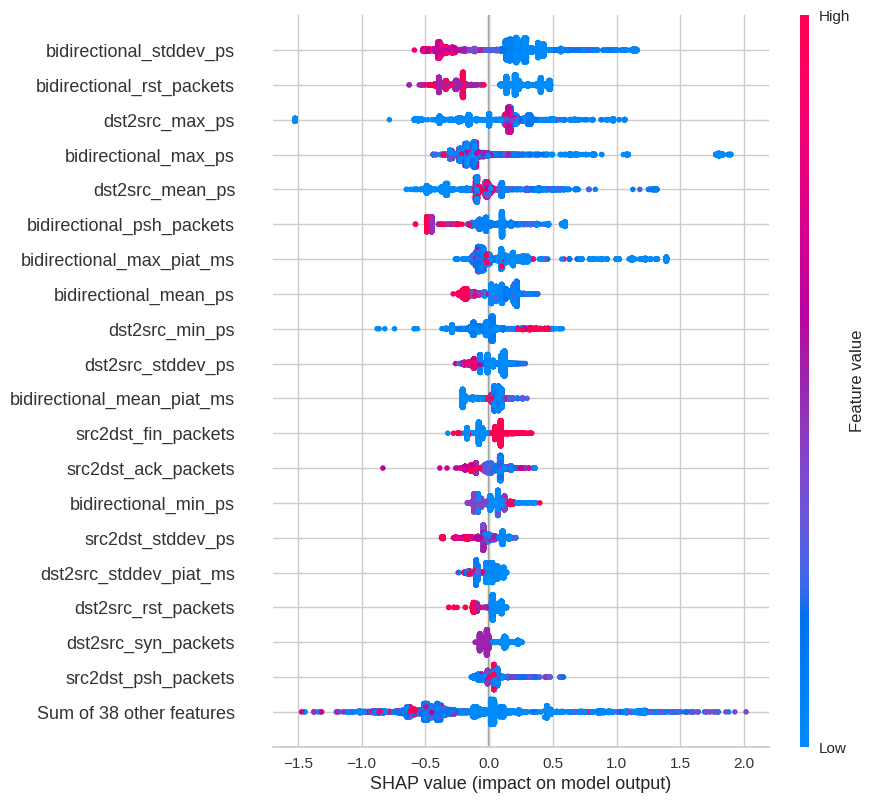

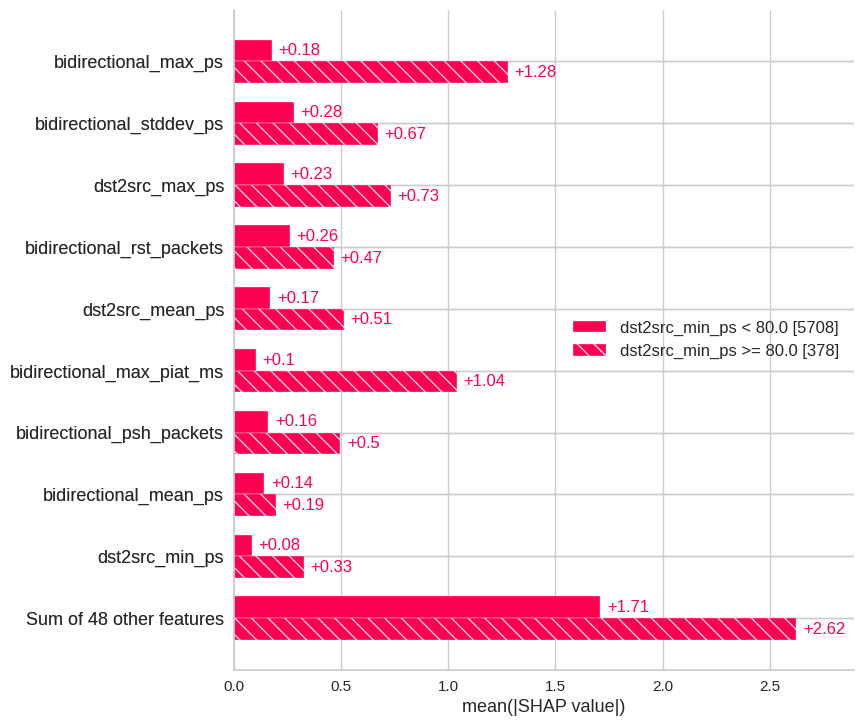

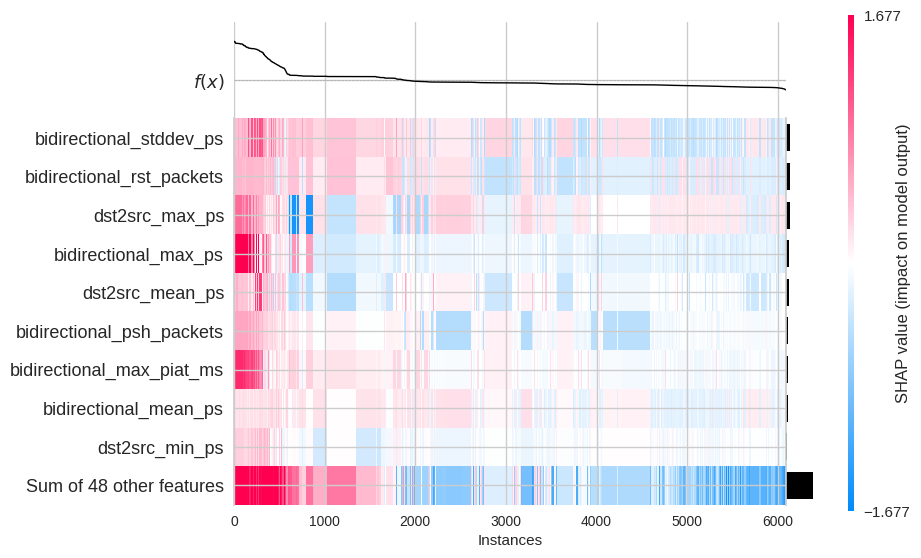

In [23]:
make_plot(0)

## Bot shap

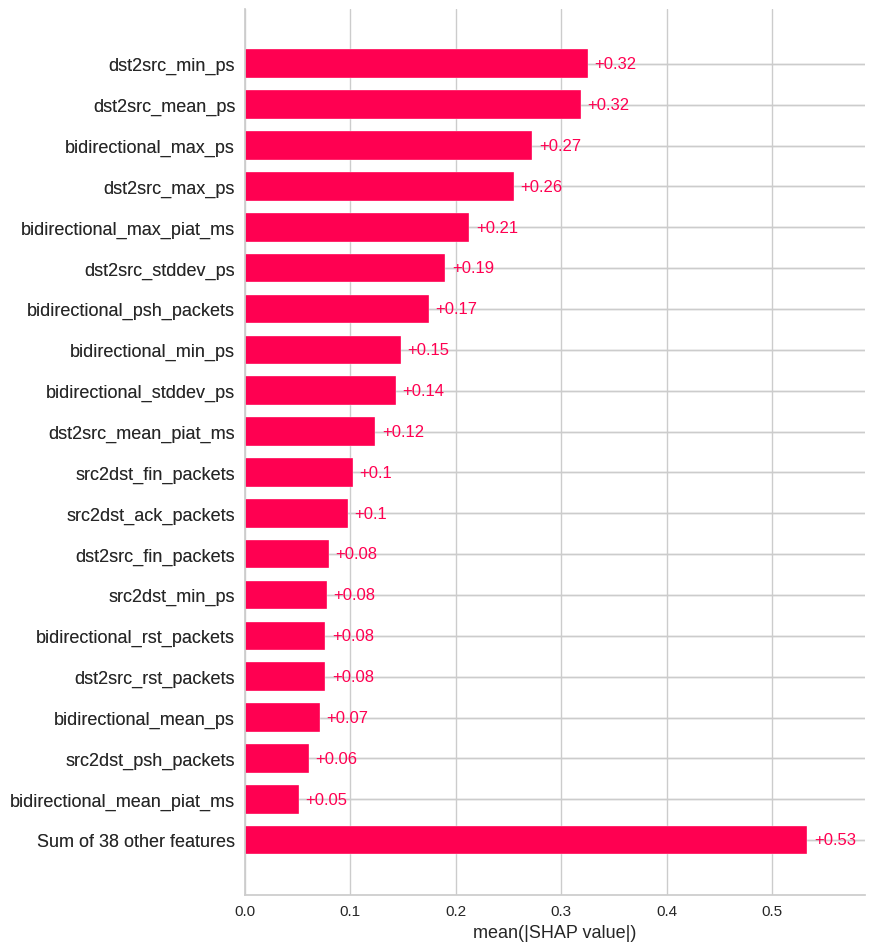

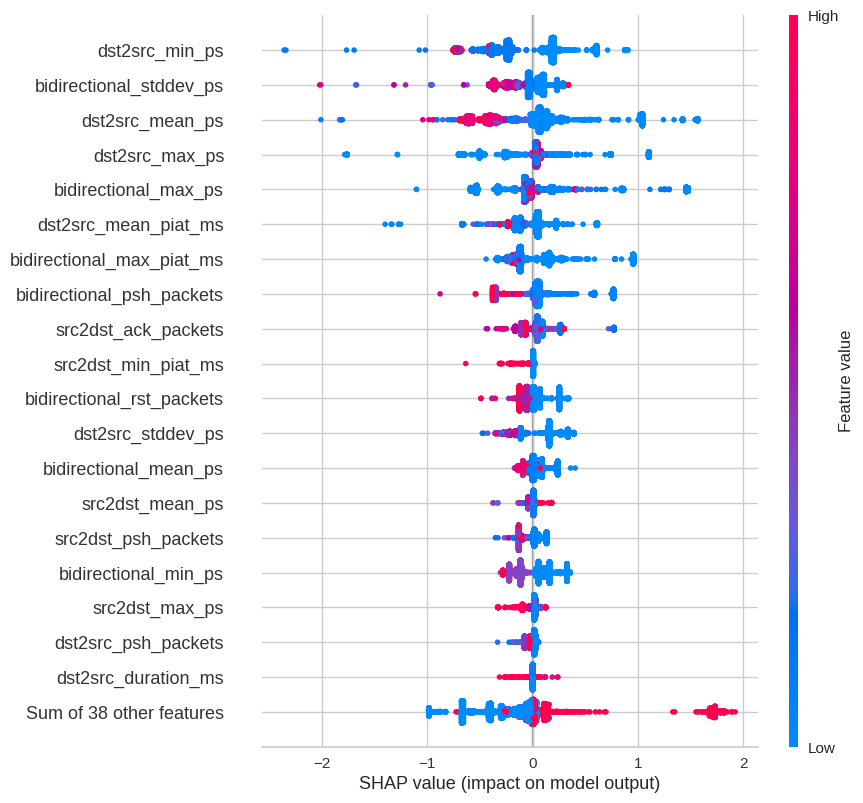

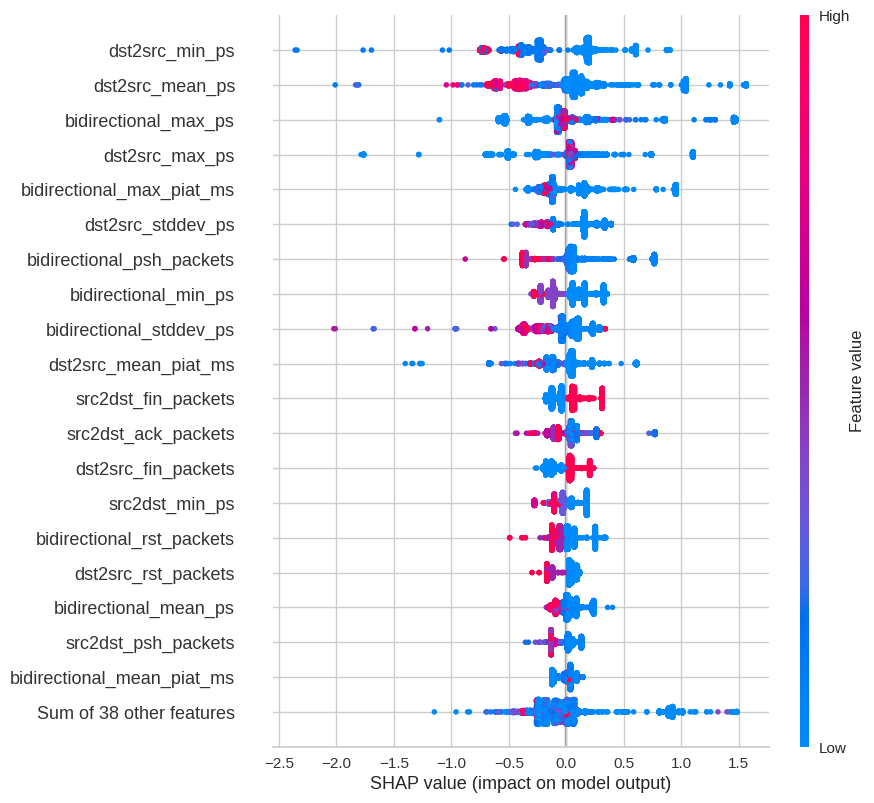

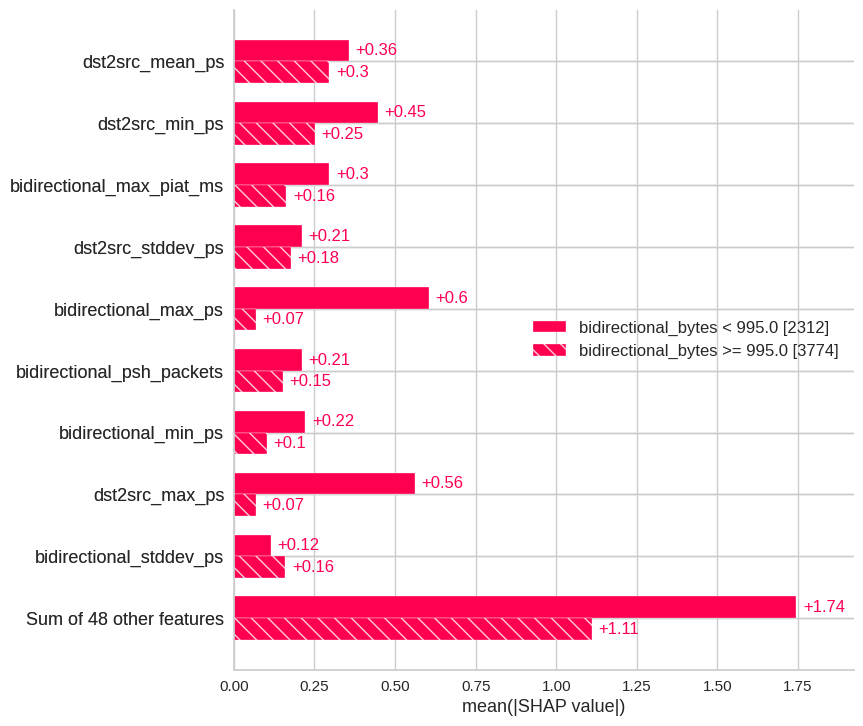

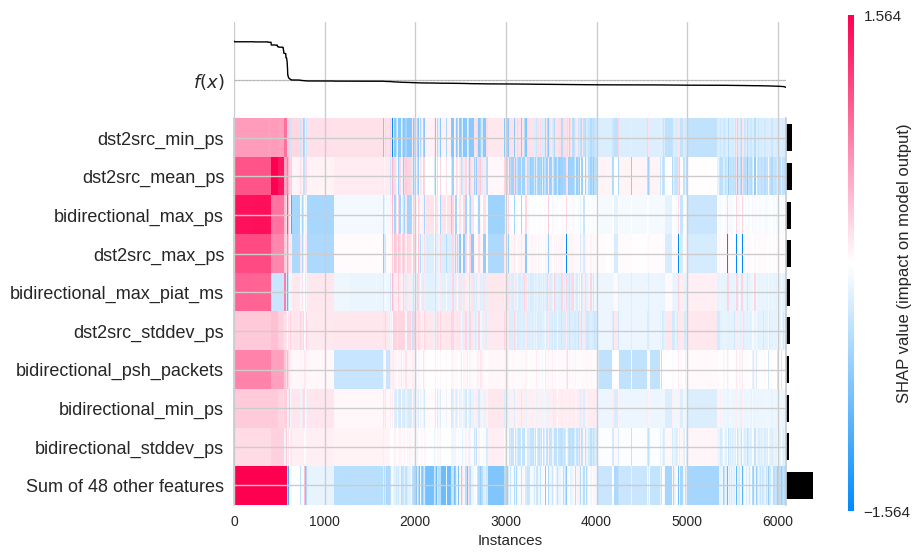

In [24]:
make_plot(1)

## DDoS shap

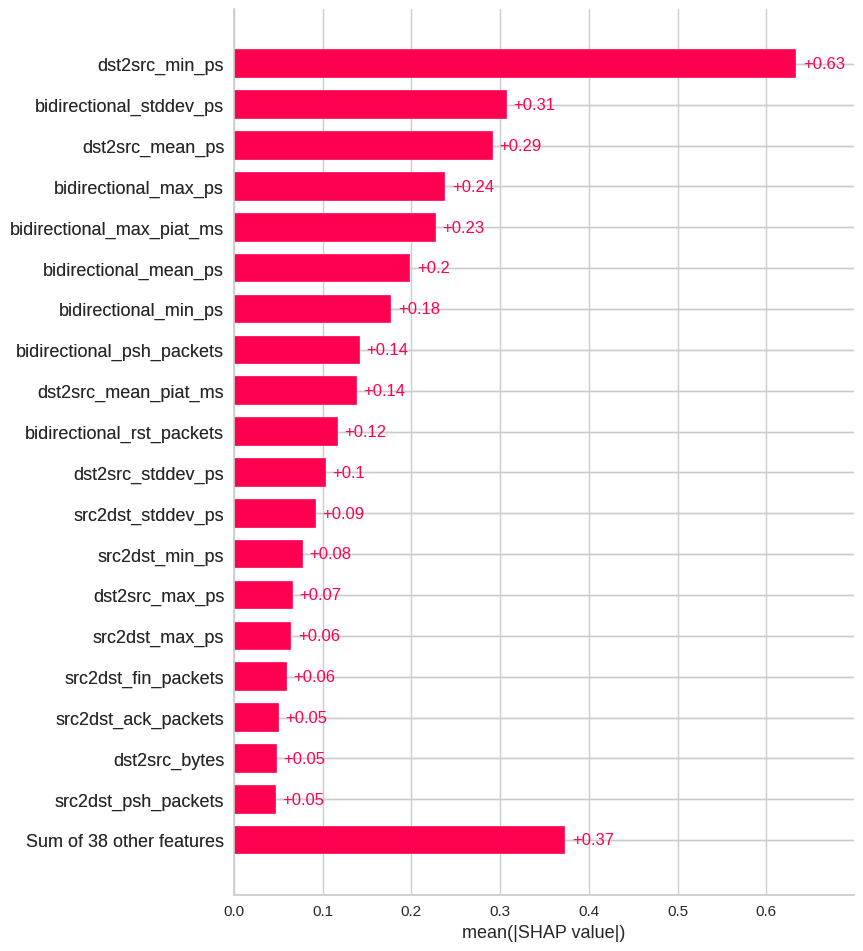

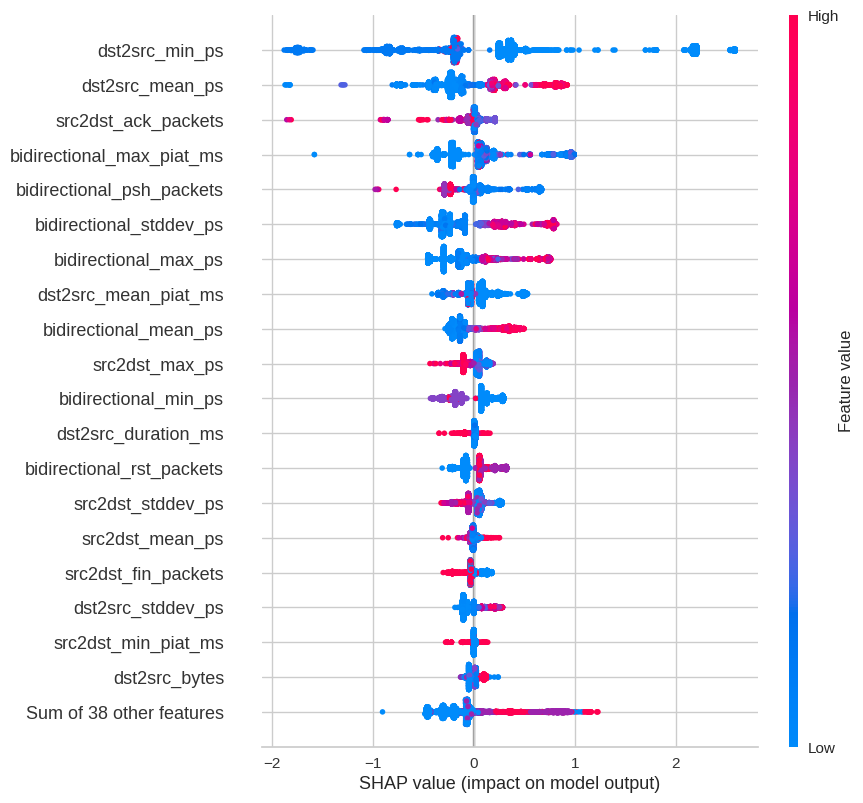

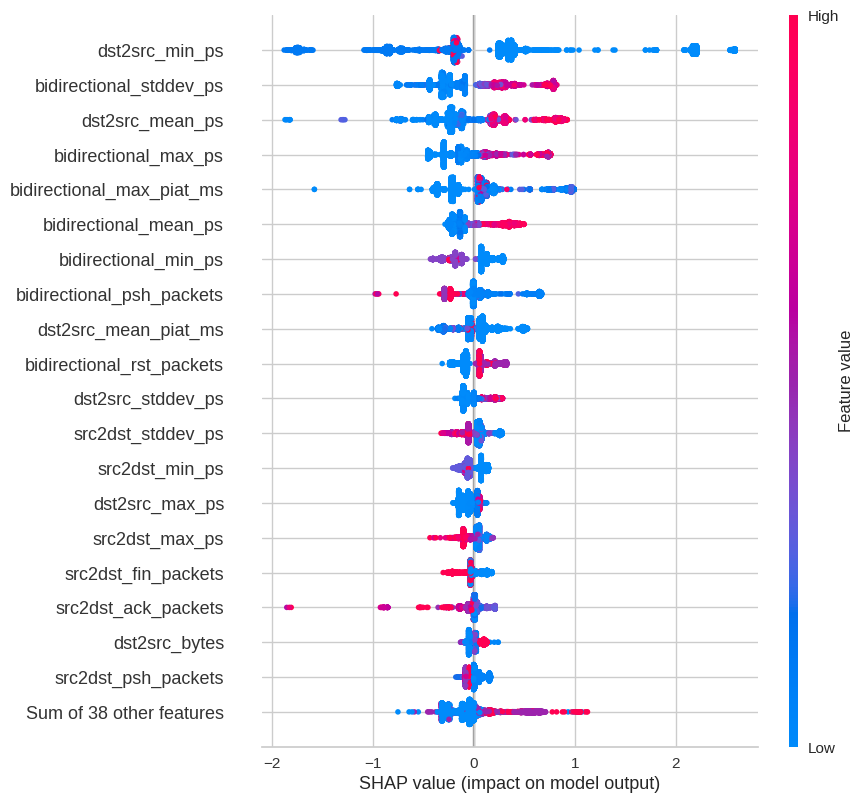

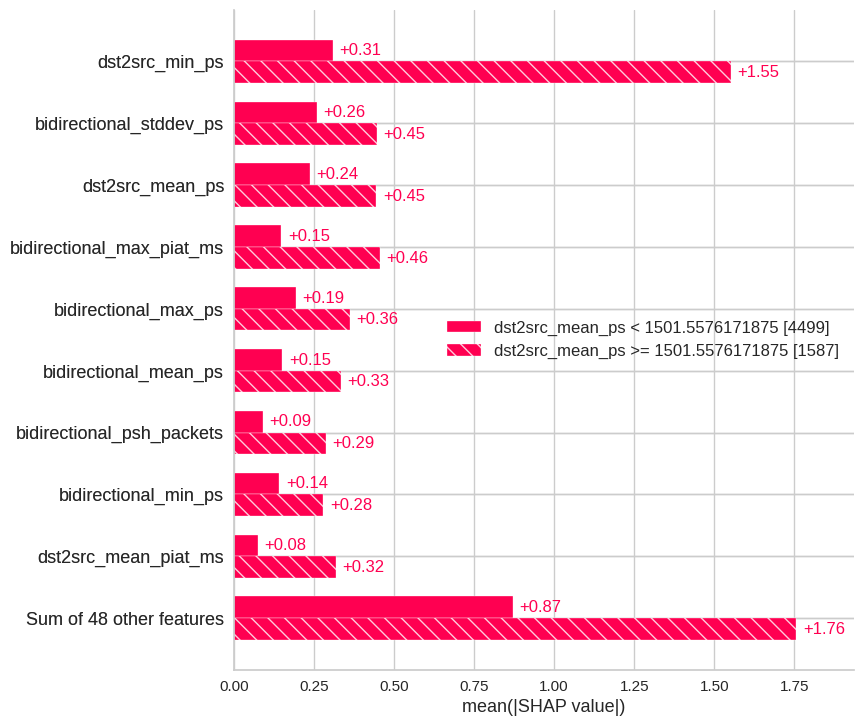

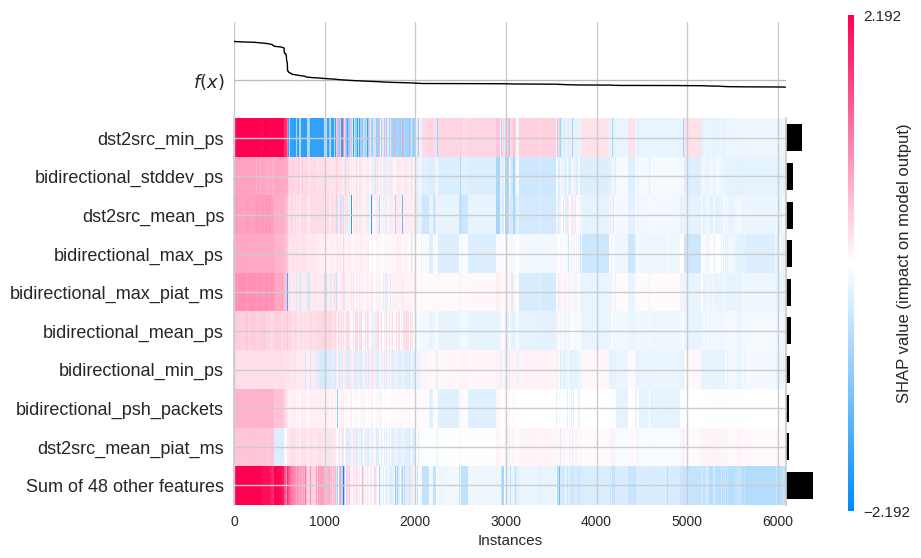

In [25]:
make_plot(2)

## DoS GoldenEye shap

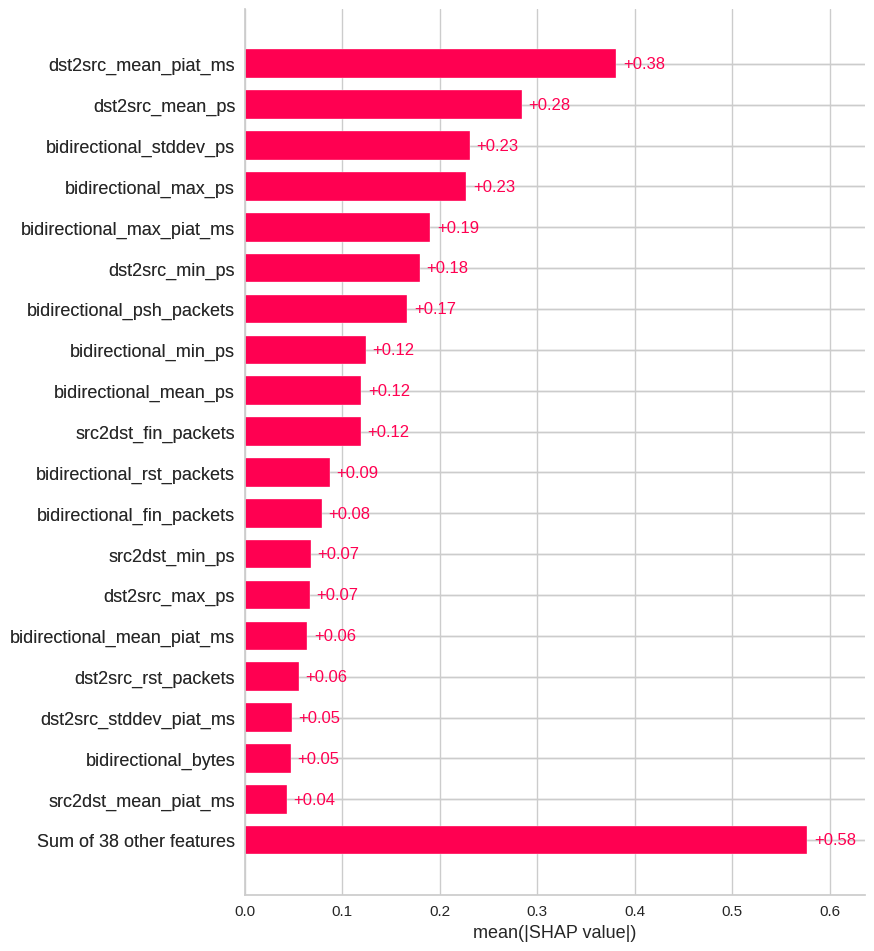

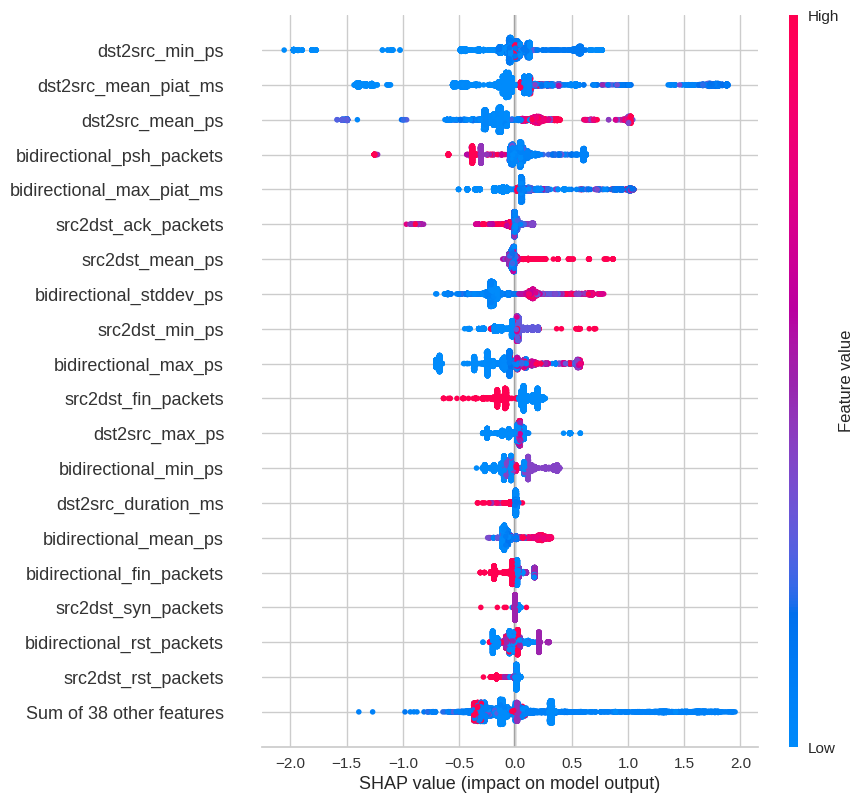

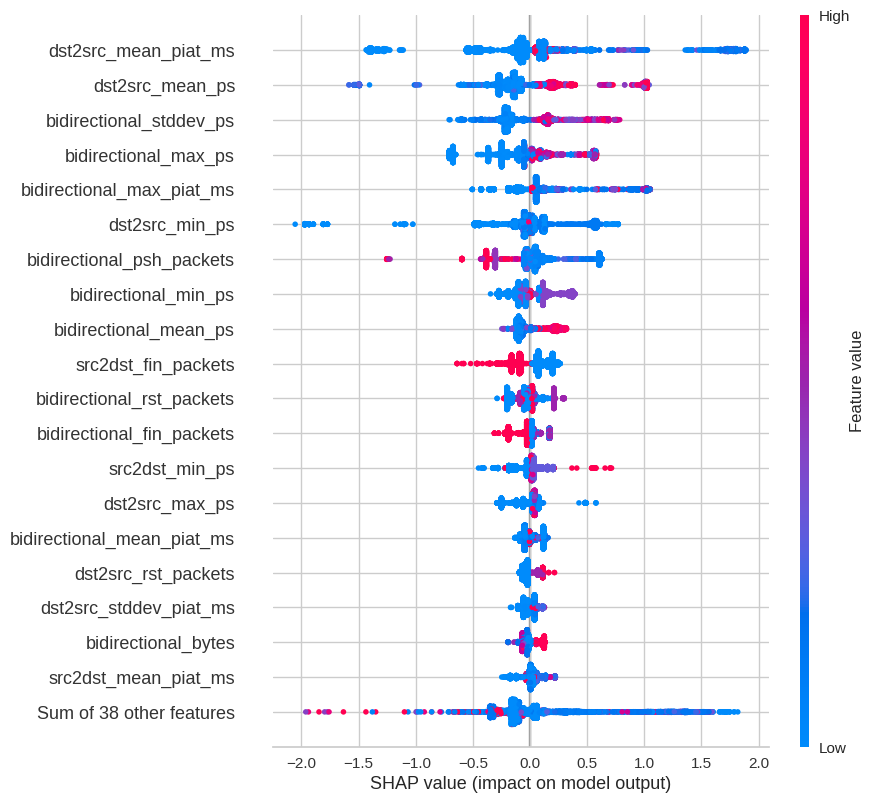

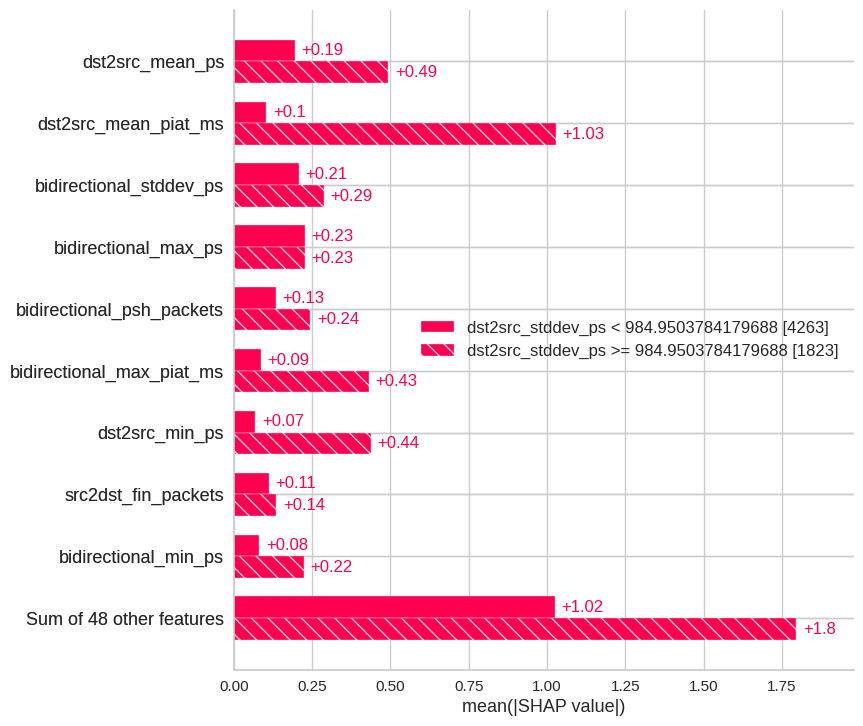

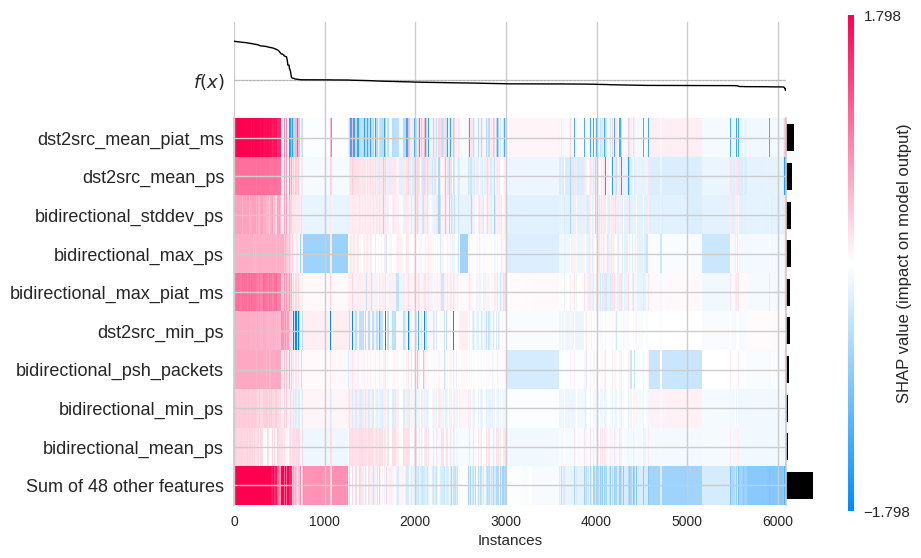

In [26]:
make_plot(3)

## DoS Hulk shap

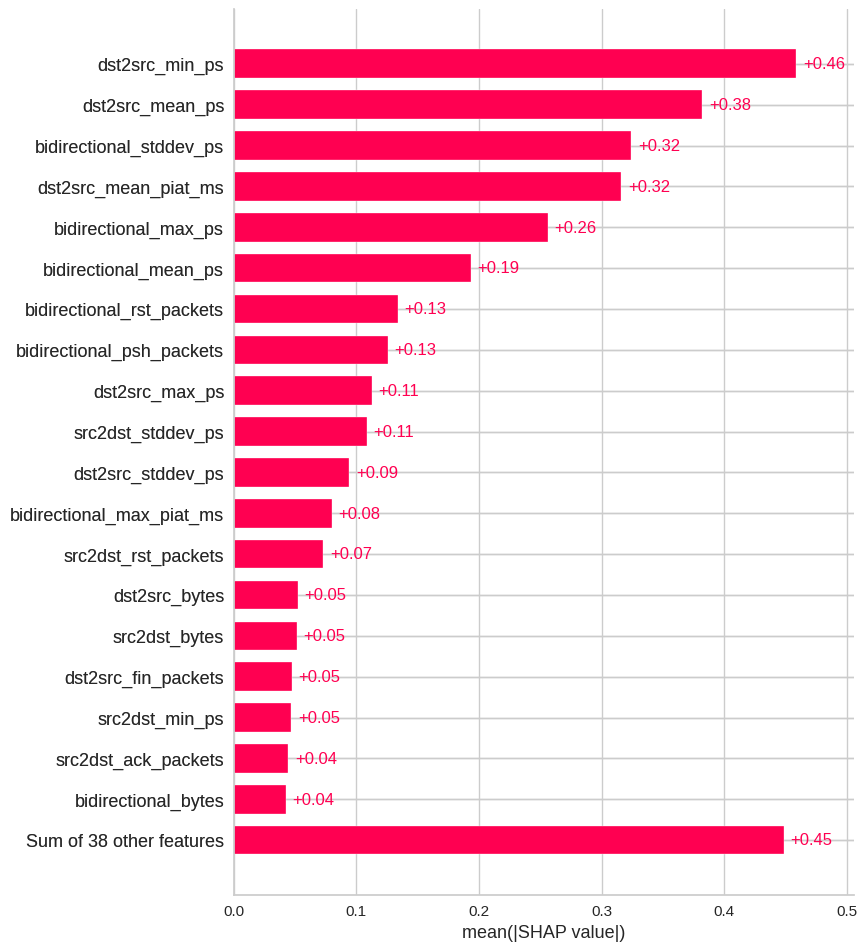

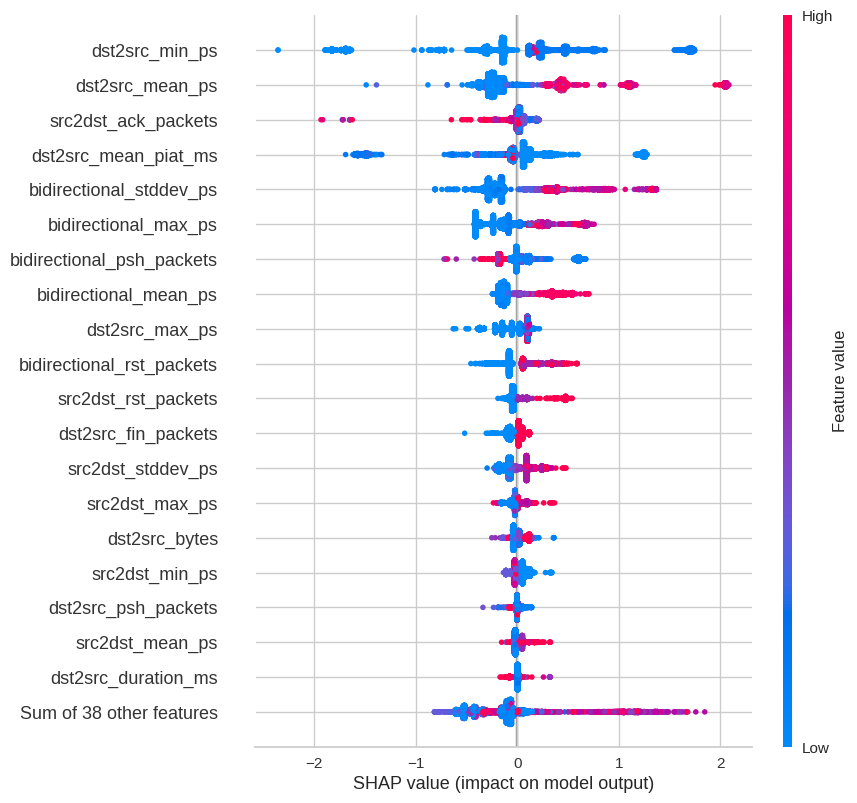

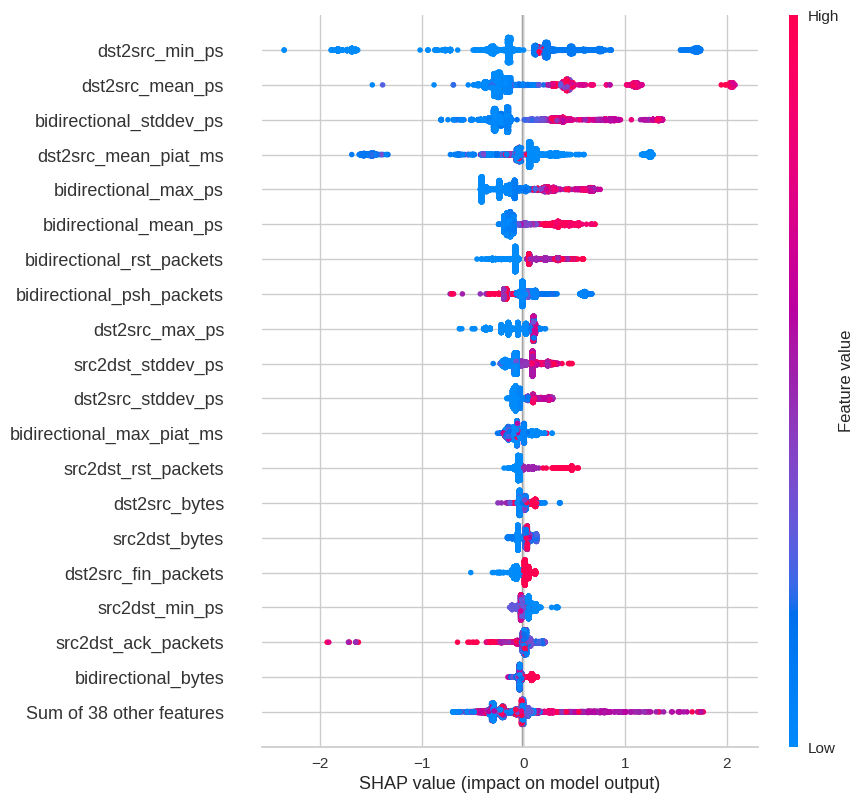

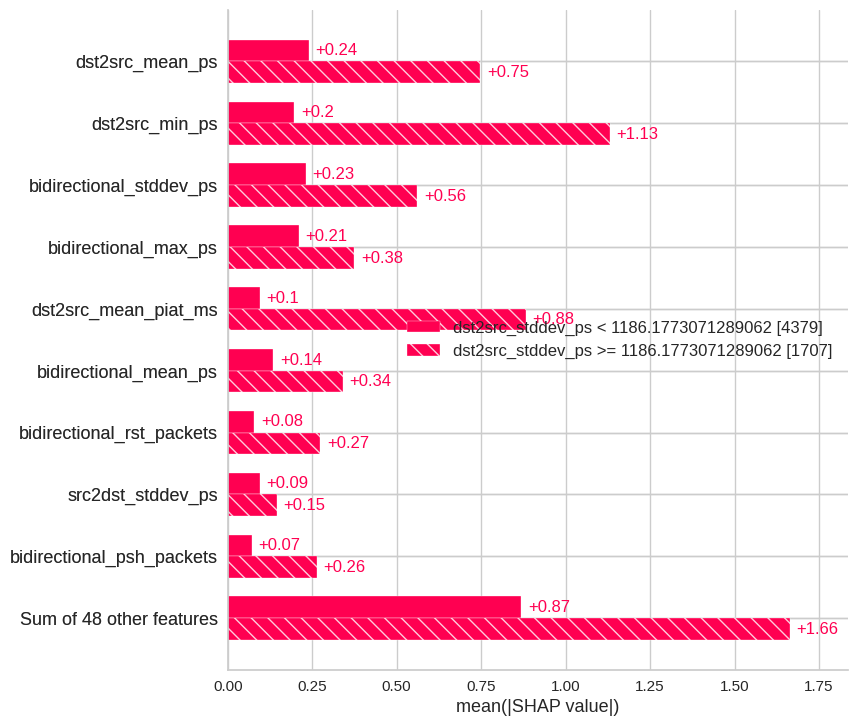

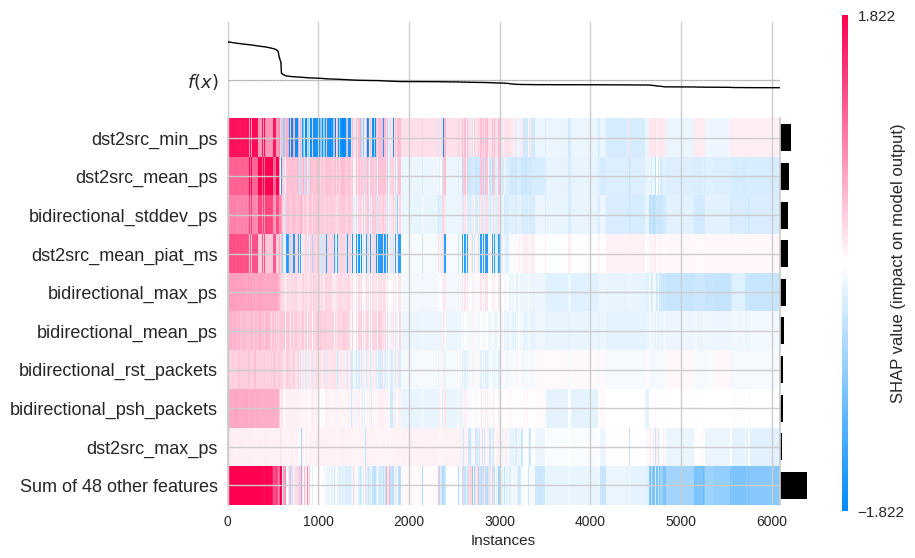

In [27]:
make_plot(4)

## DoS Slowhttptest shap

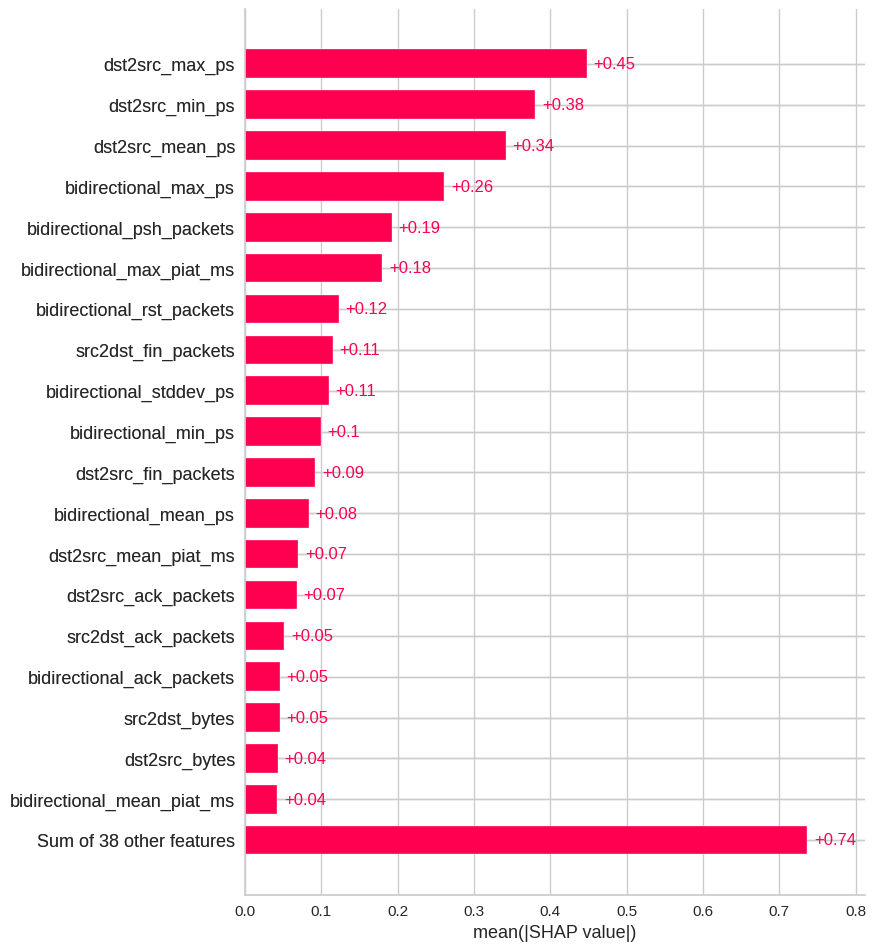

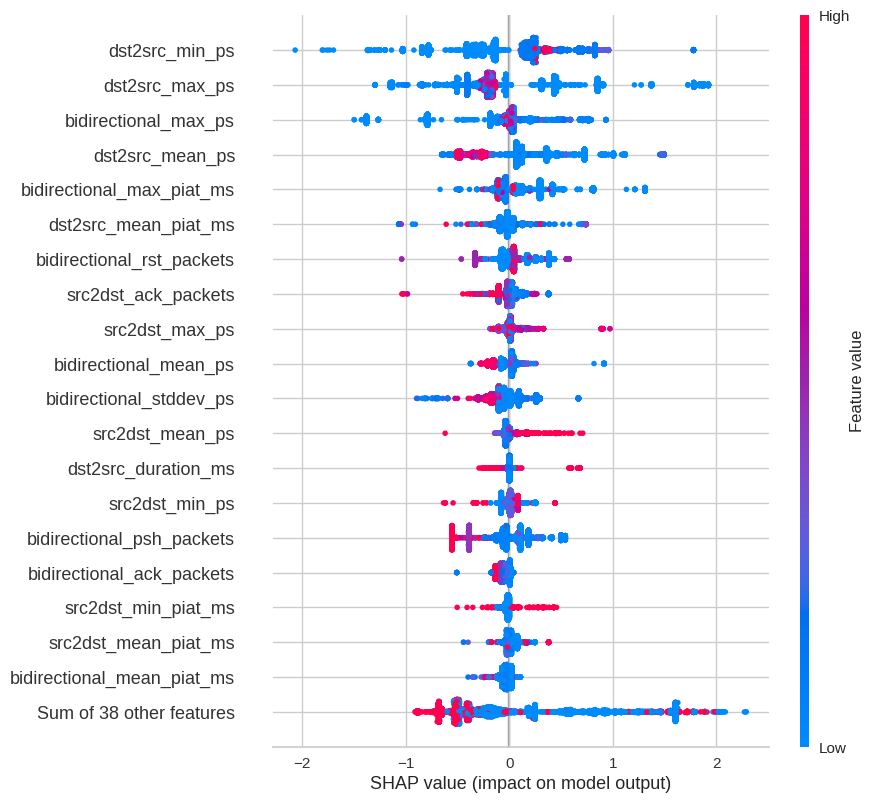

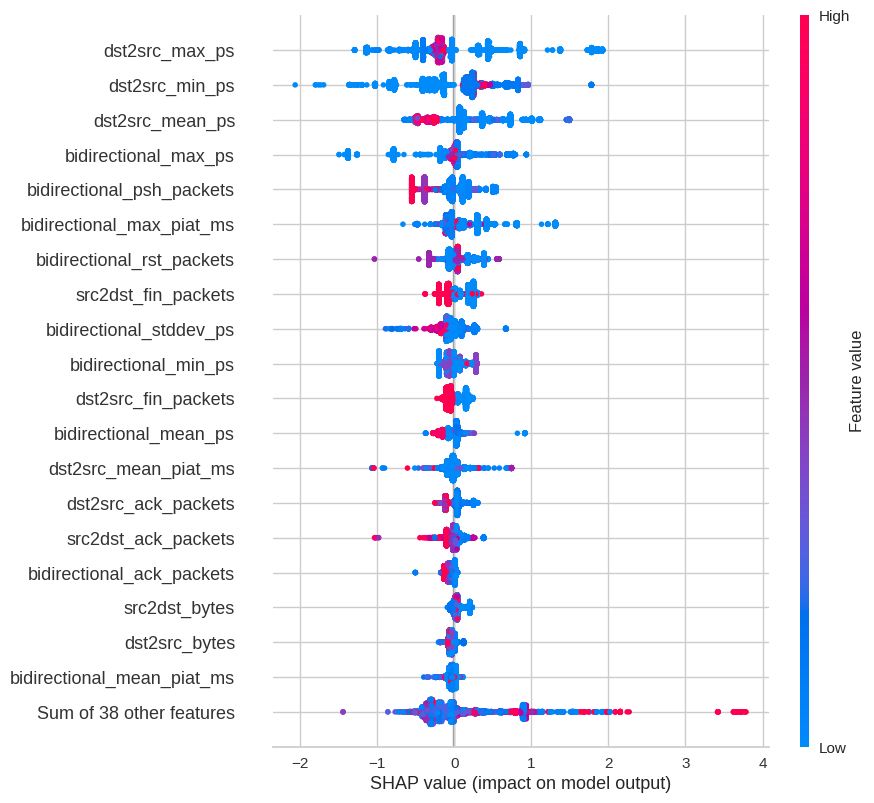

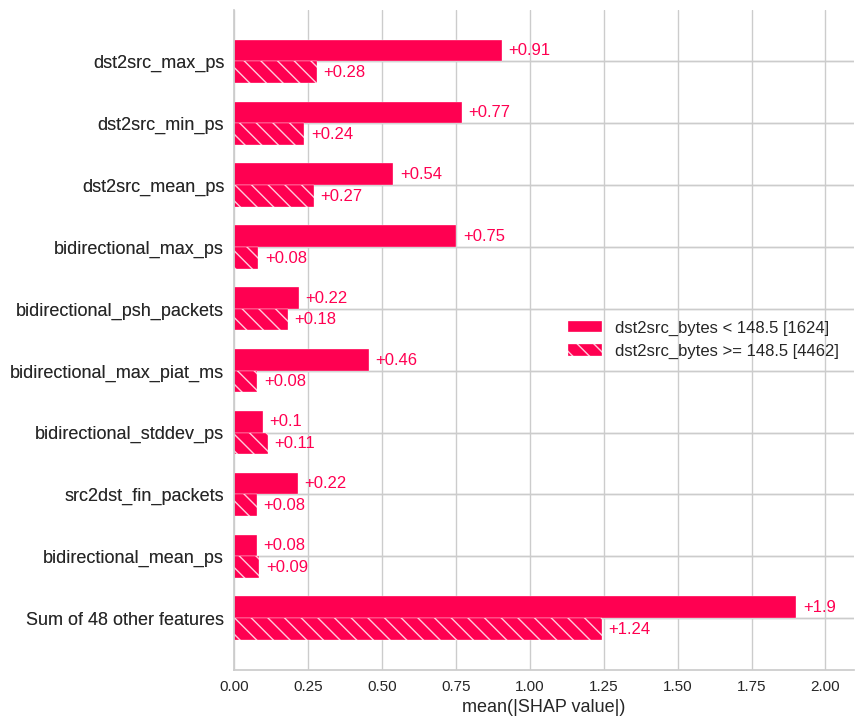

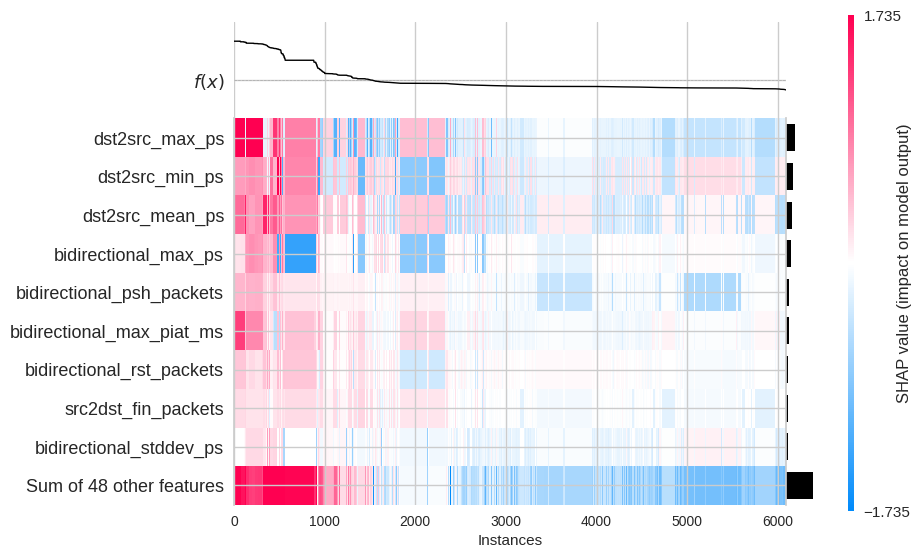

In [28]:
make_plot(5)

## DoS slowloris shap

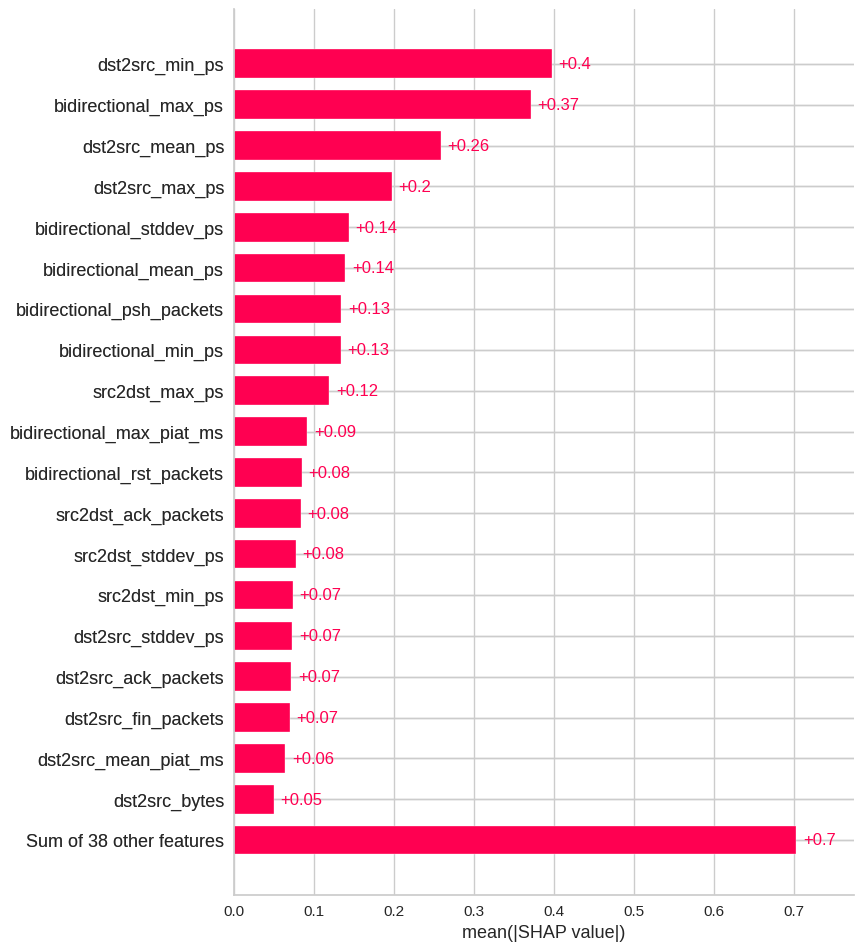

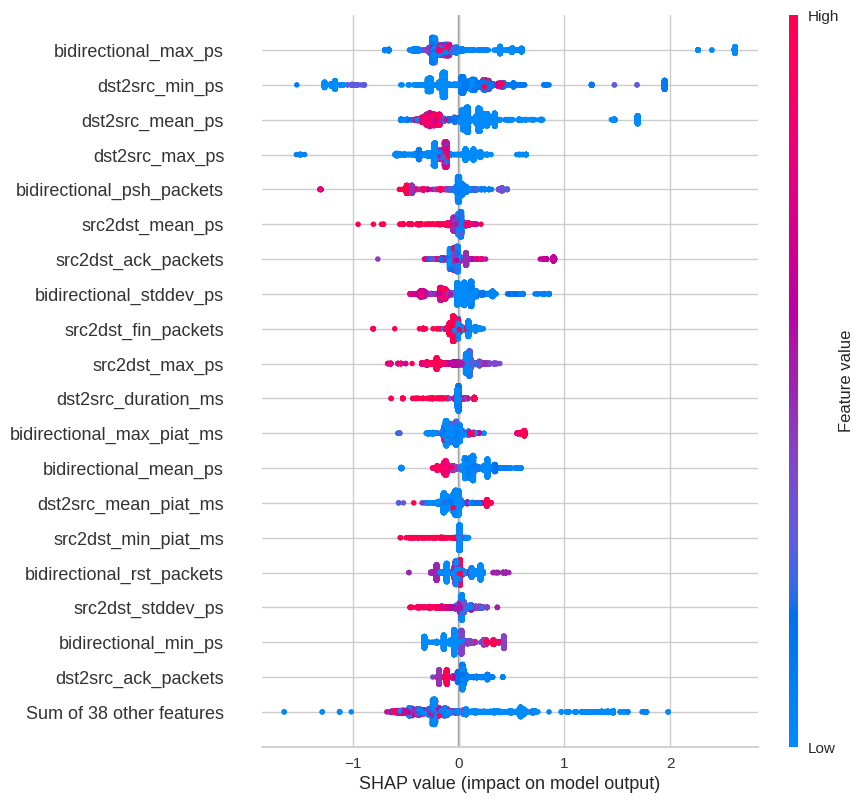

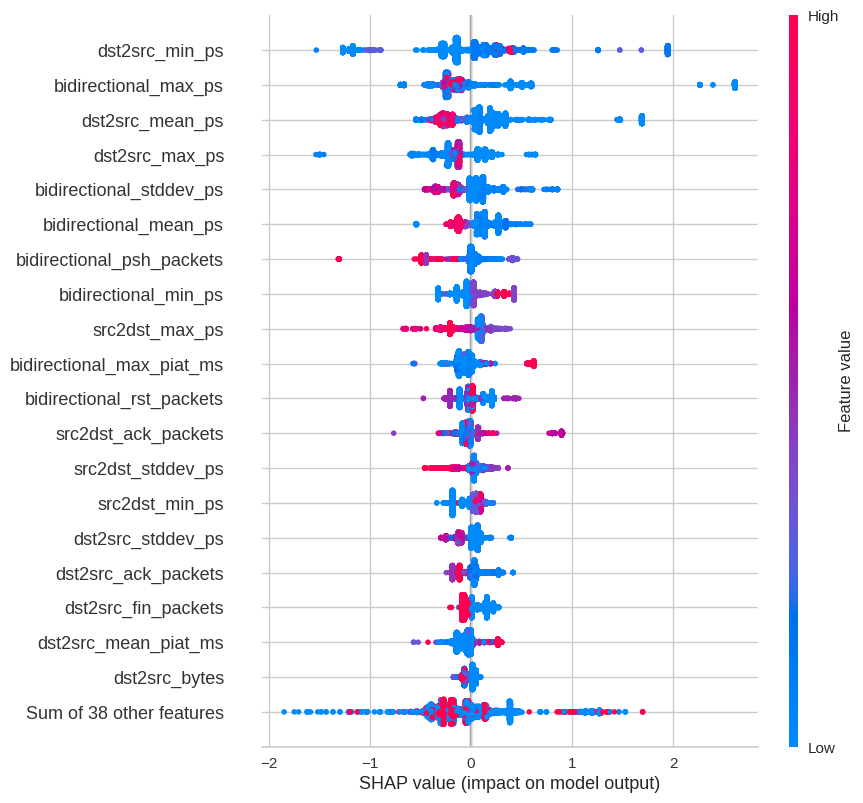

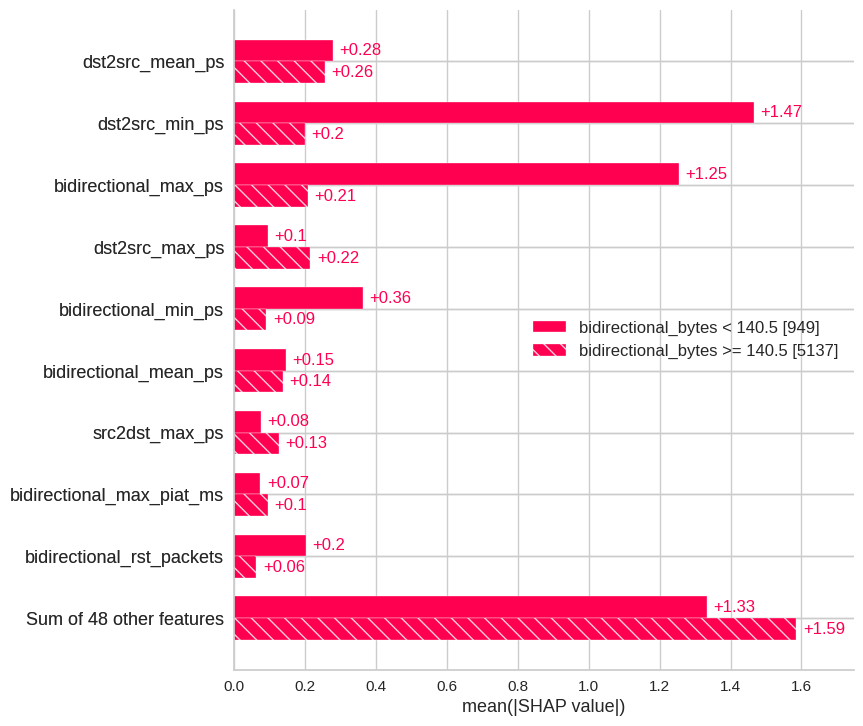

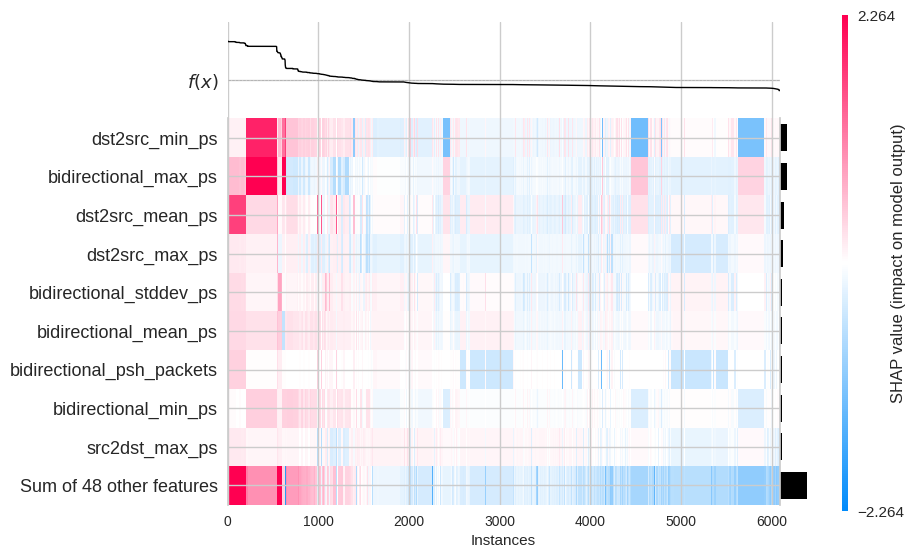

In [29]:
make_plot(6)

## FTP-Patator shap

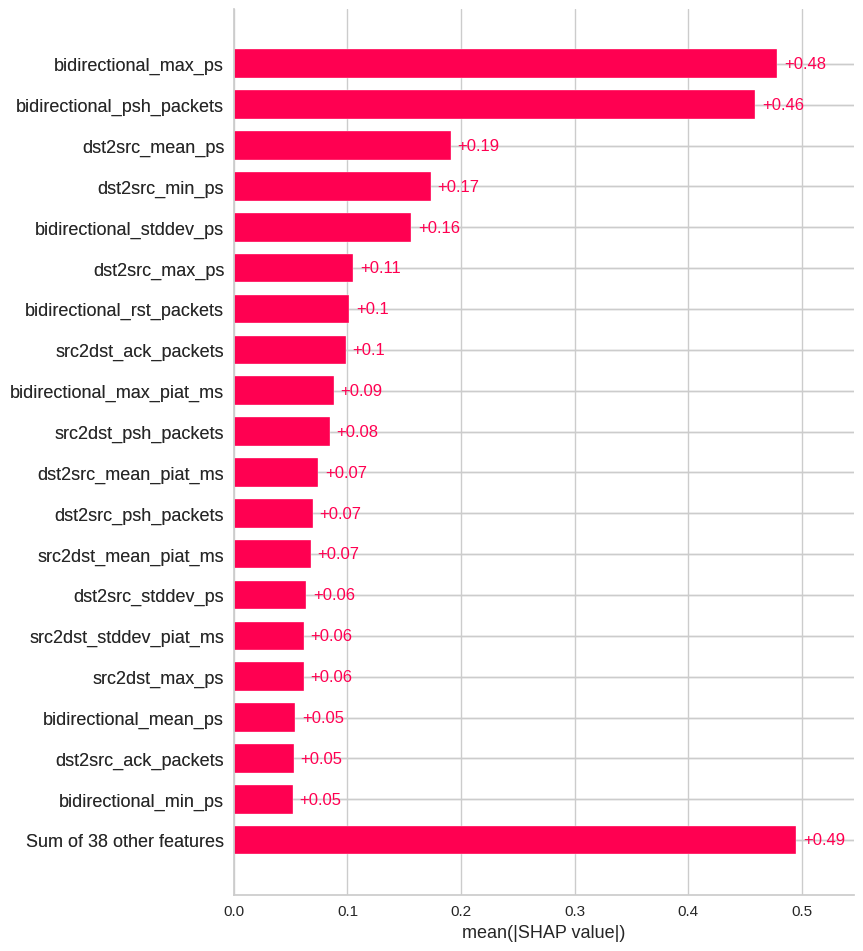

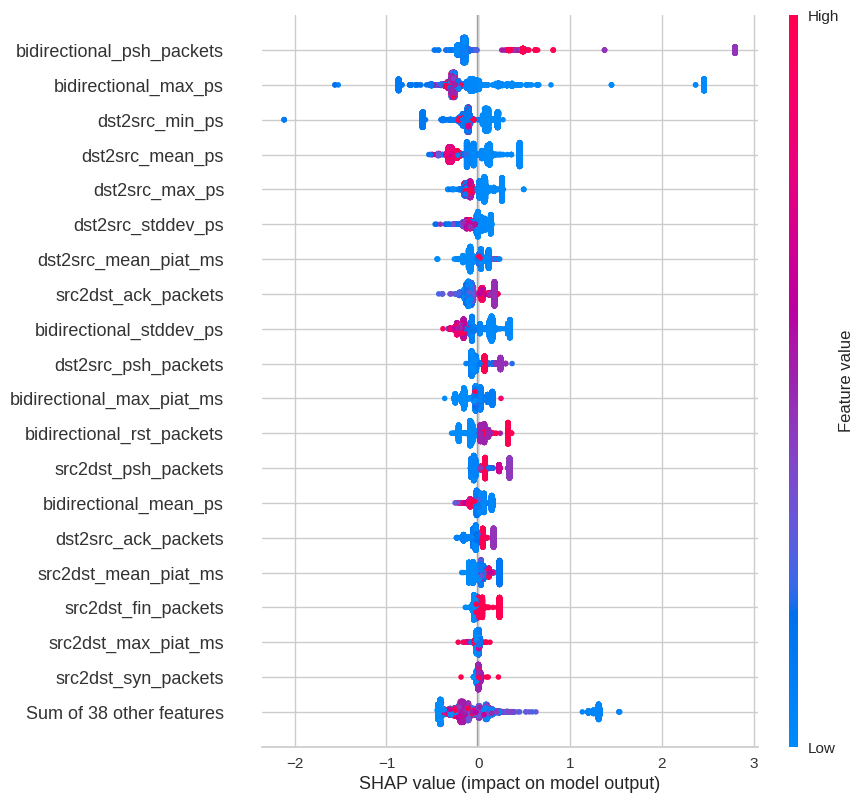

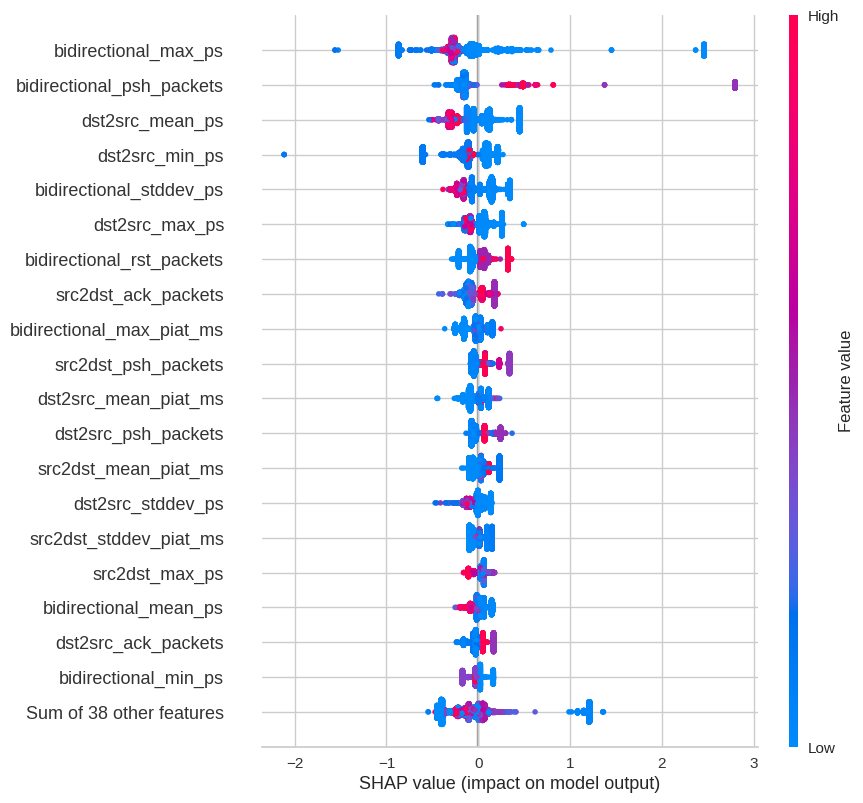

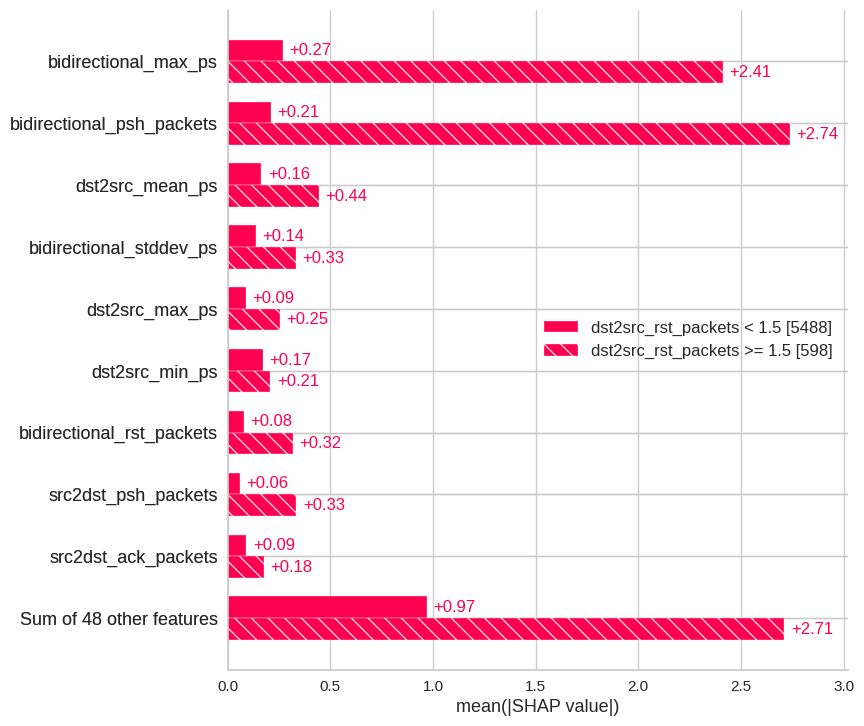

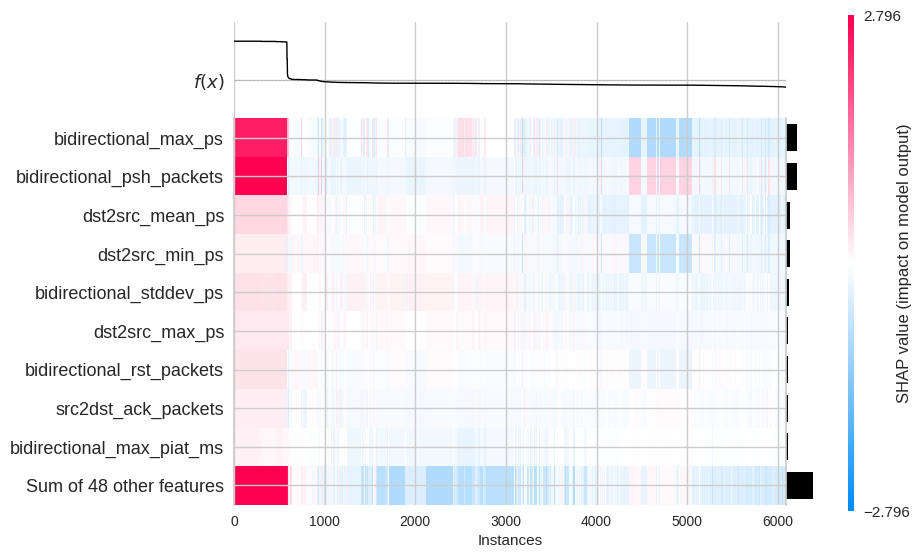

In [30]:
make_plot(7)

## Heartbleed shap

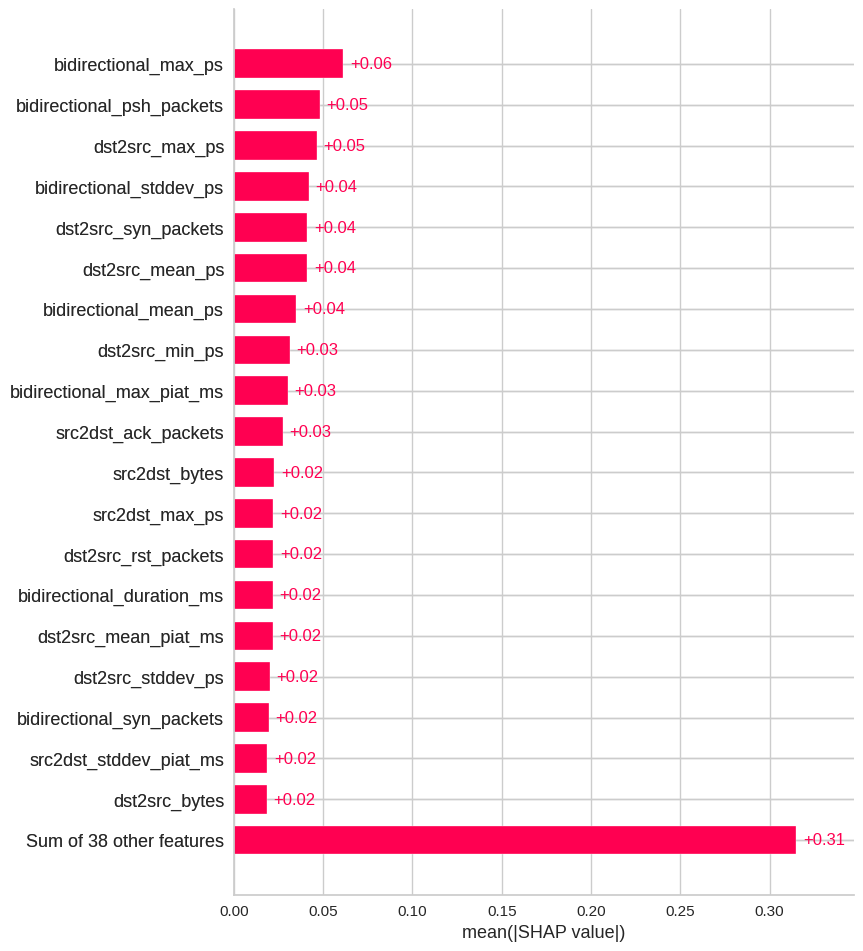

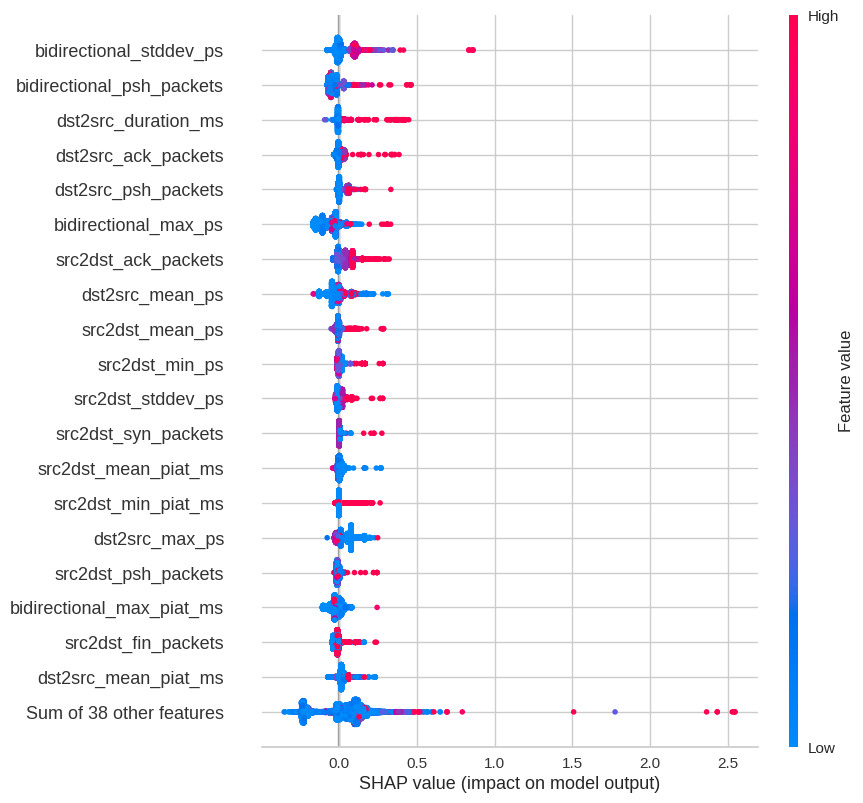

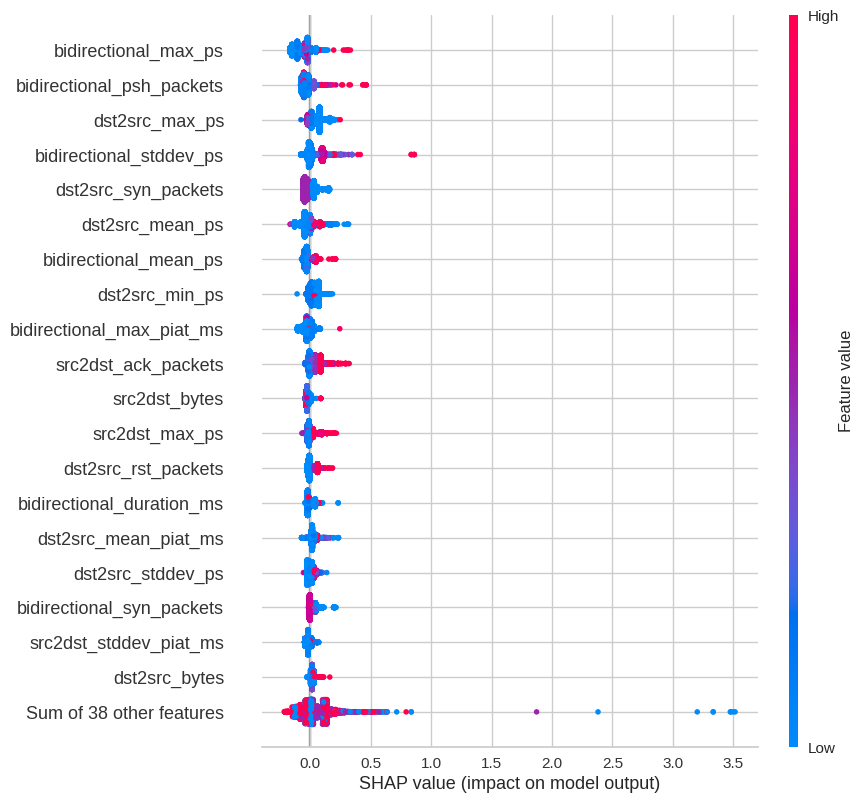

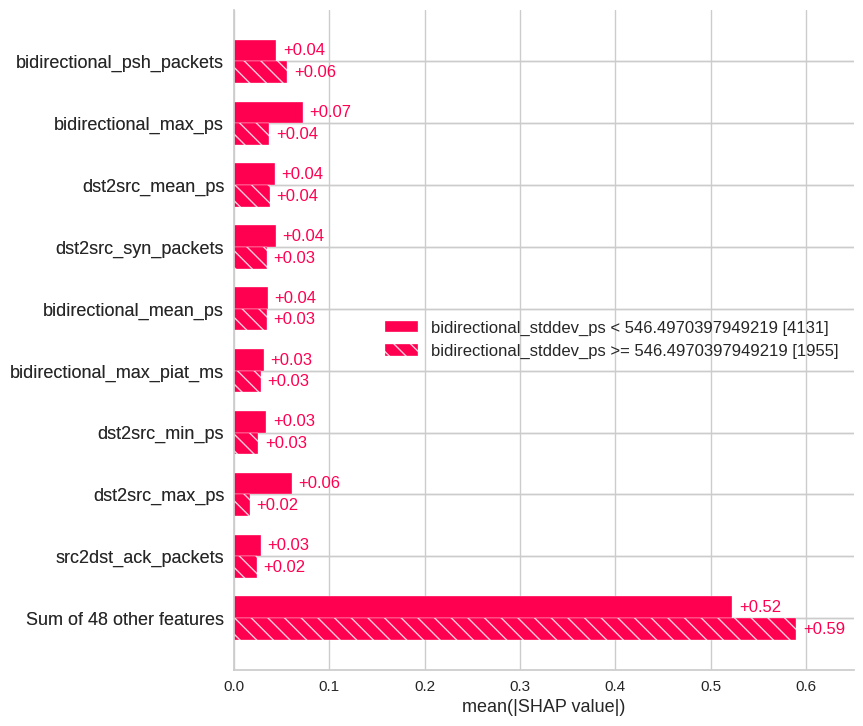

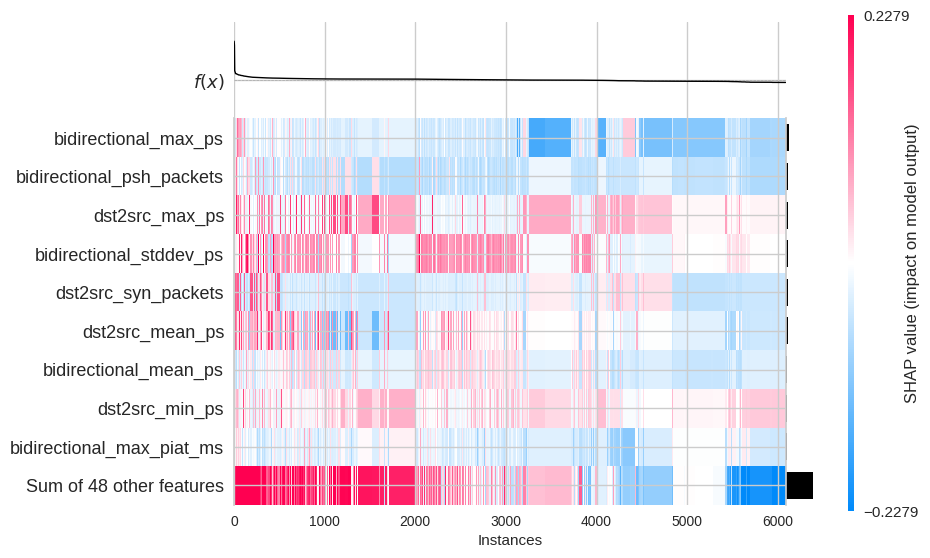

In [31]:
make_plot(8)

## Infiltration shap

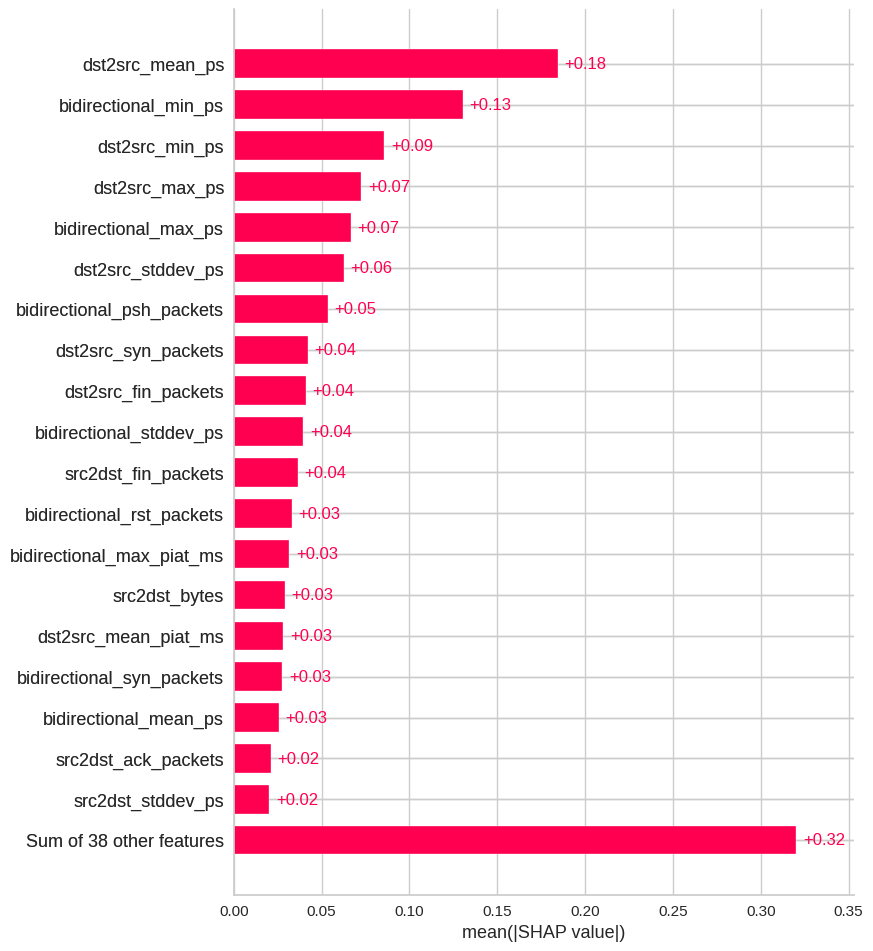

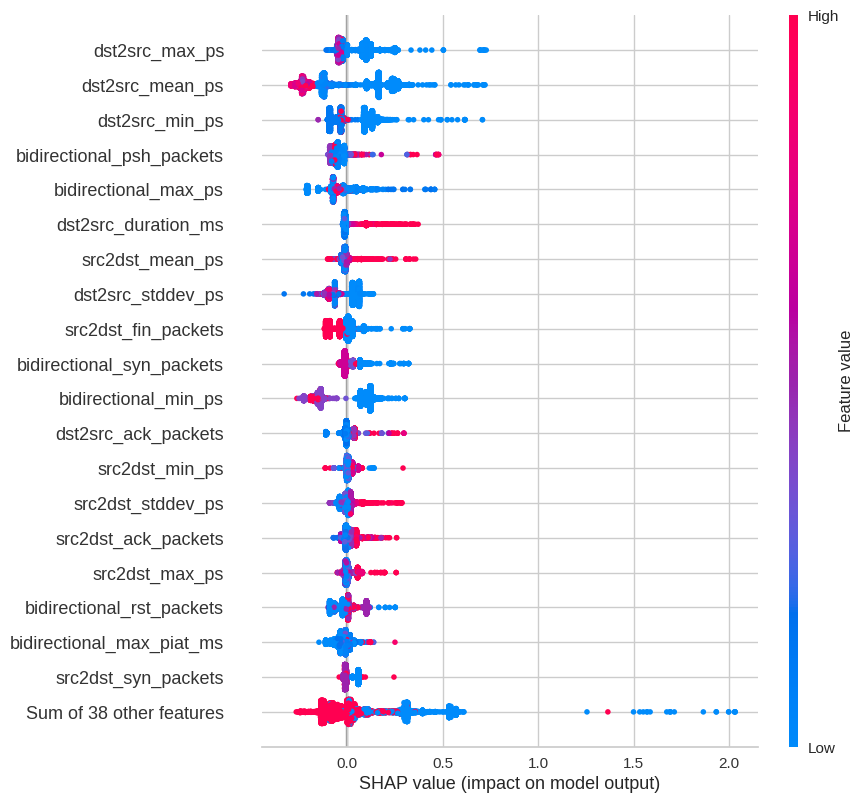

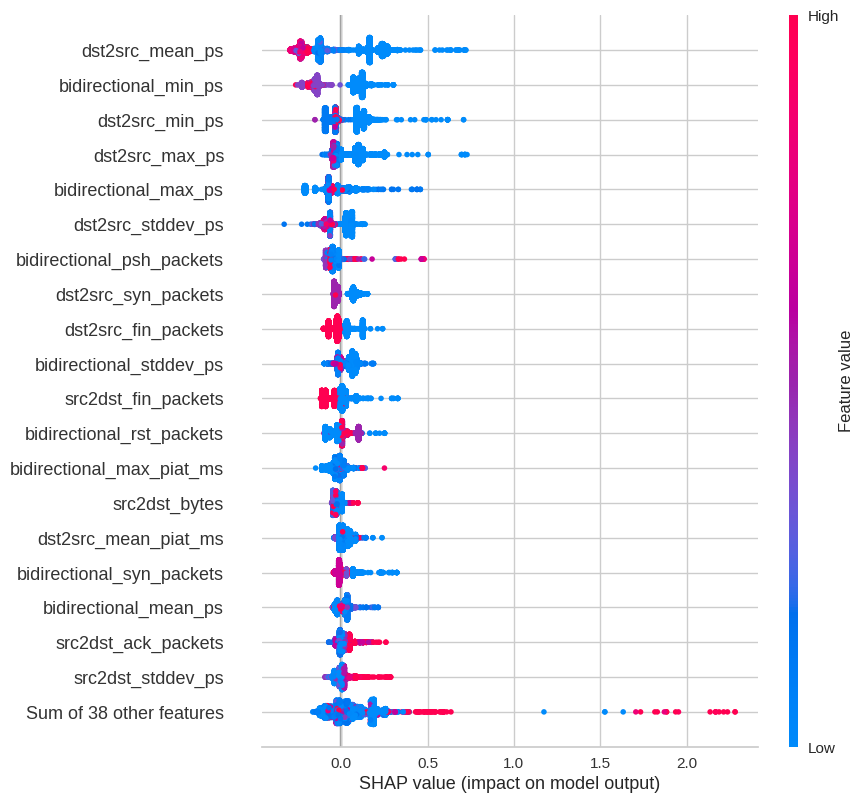

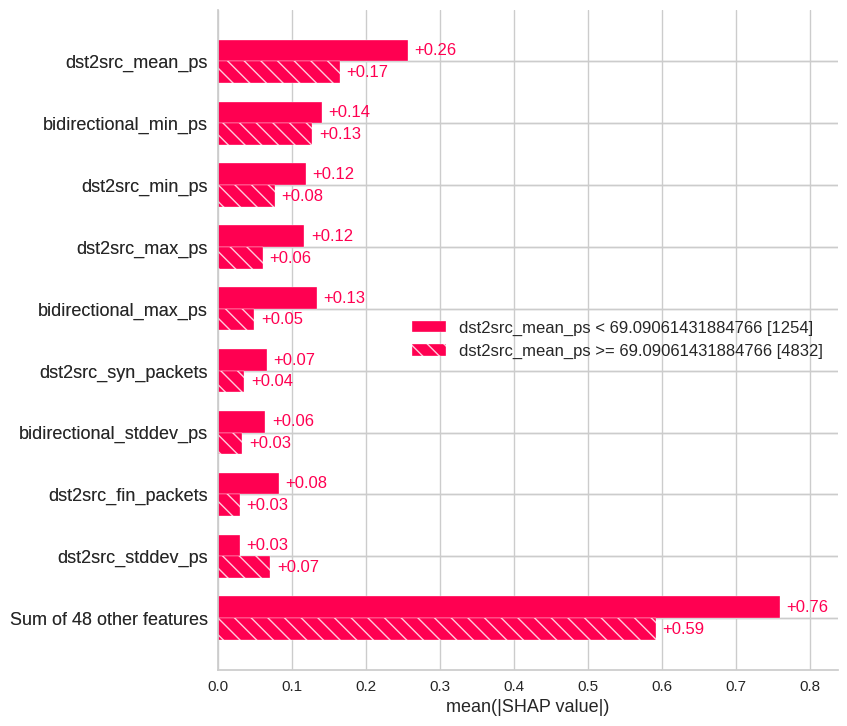

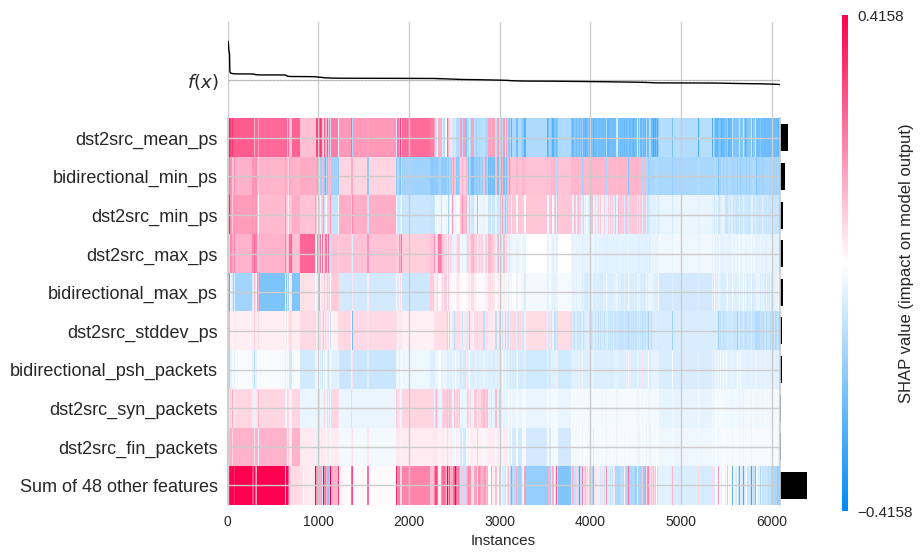

In [32]:
make_plot(9)

## PortScan shap

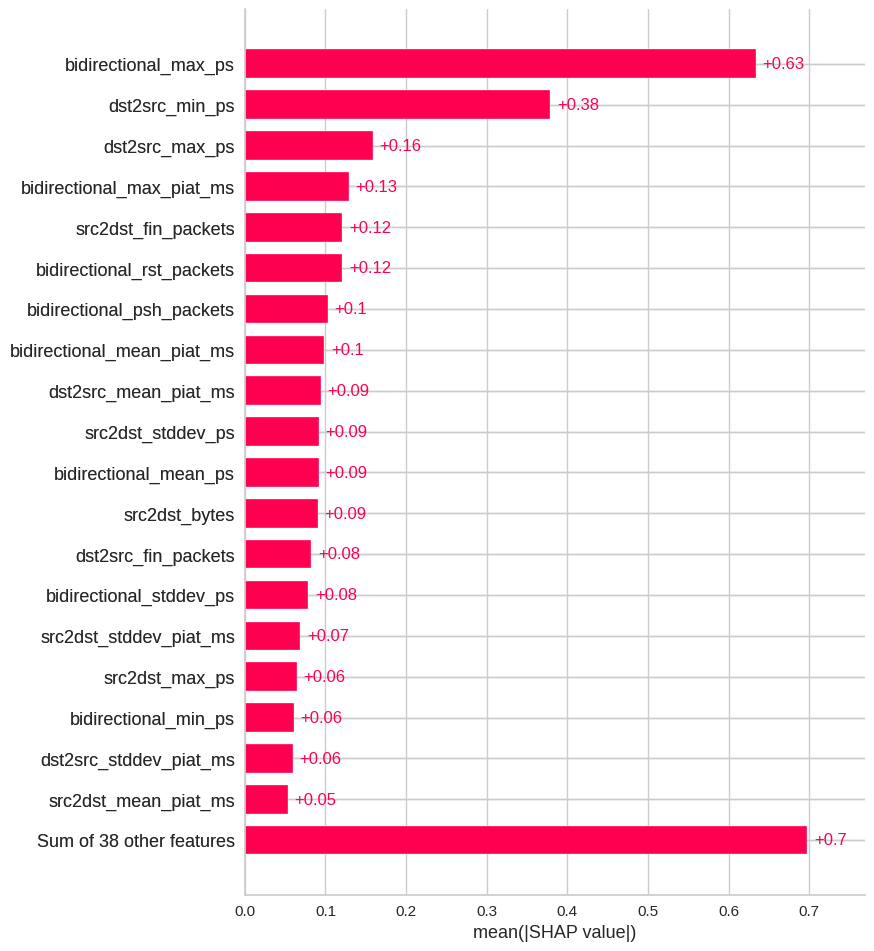

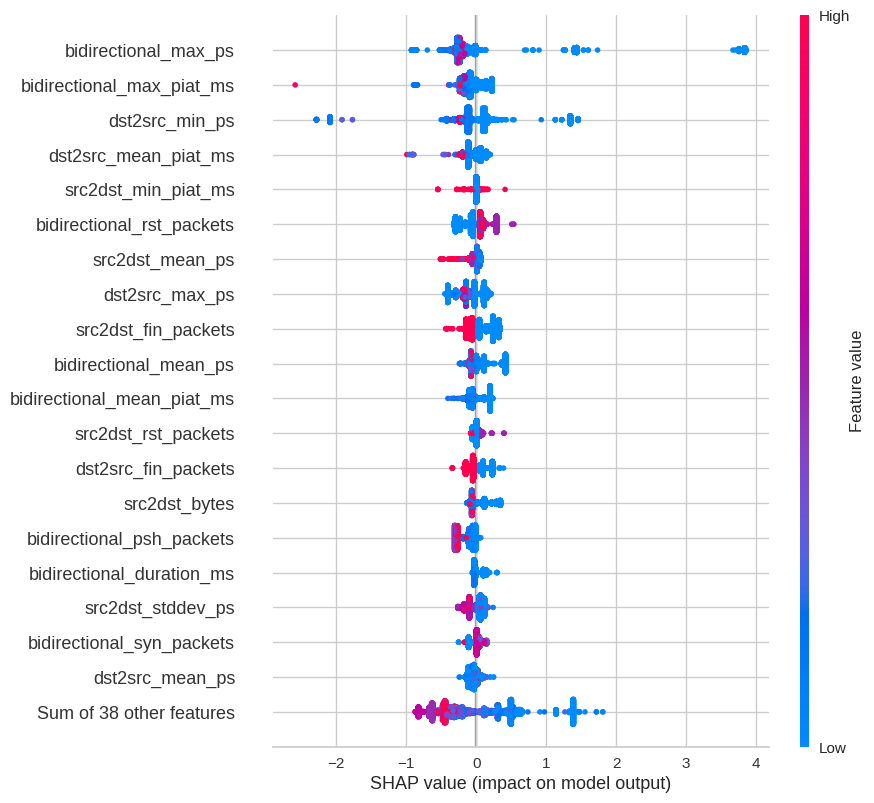

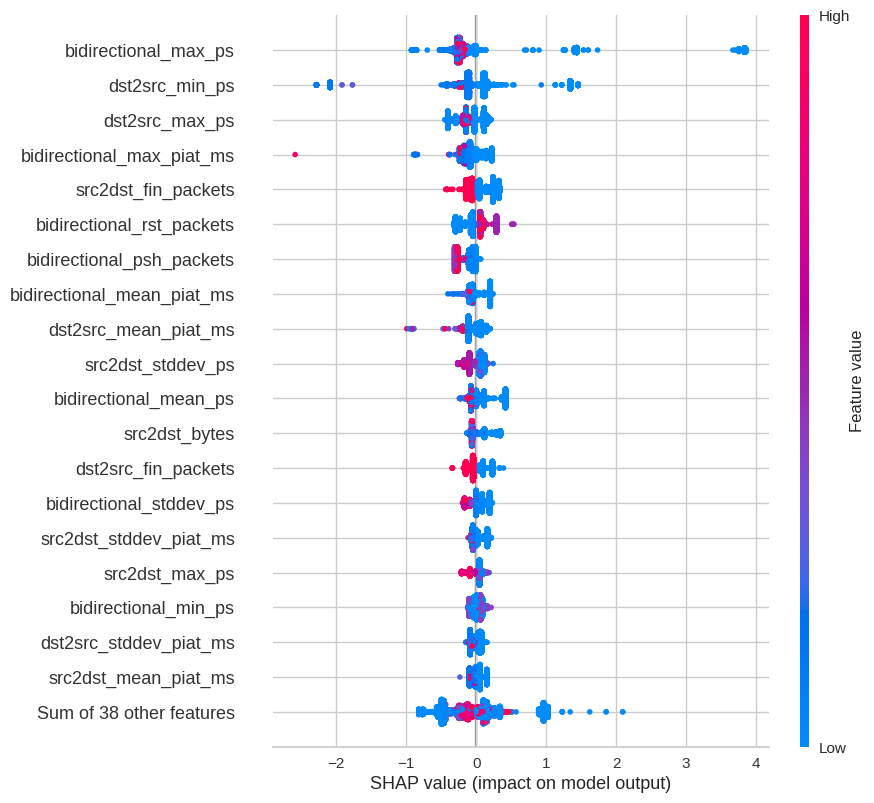

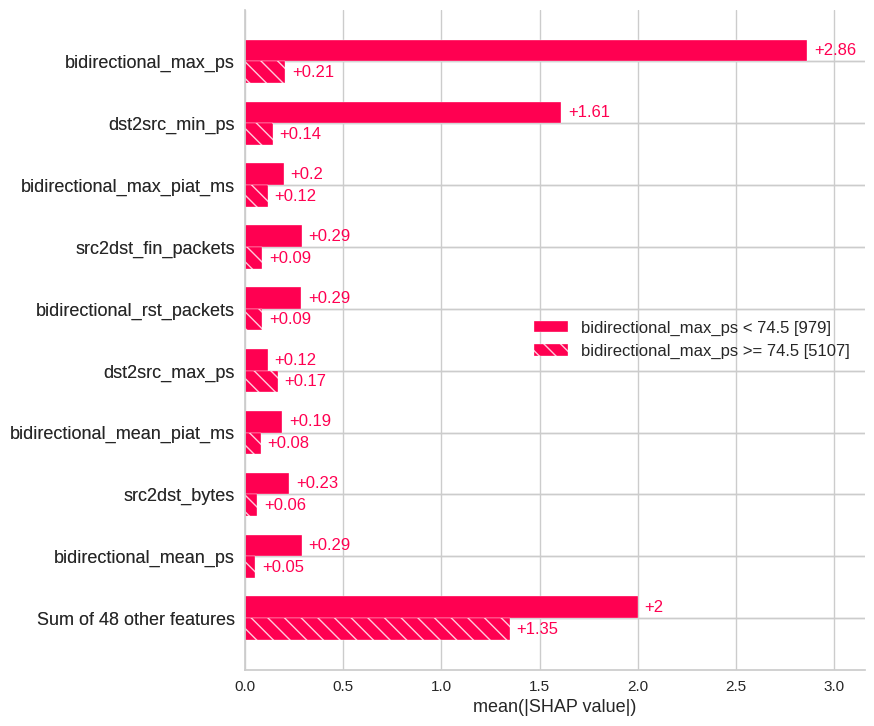

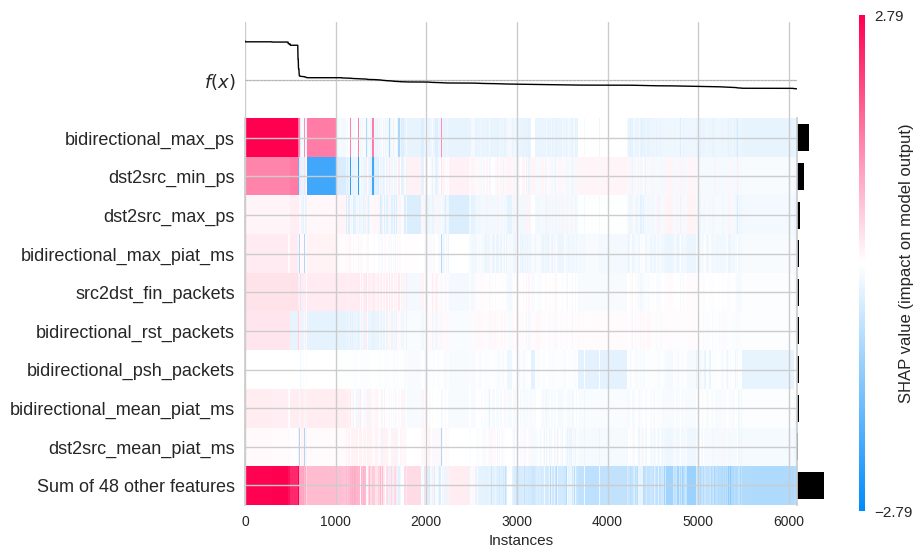

In [33]:
make_plot(10)

## SSH-Patator shap

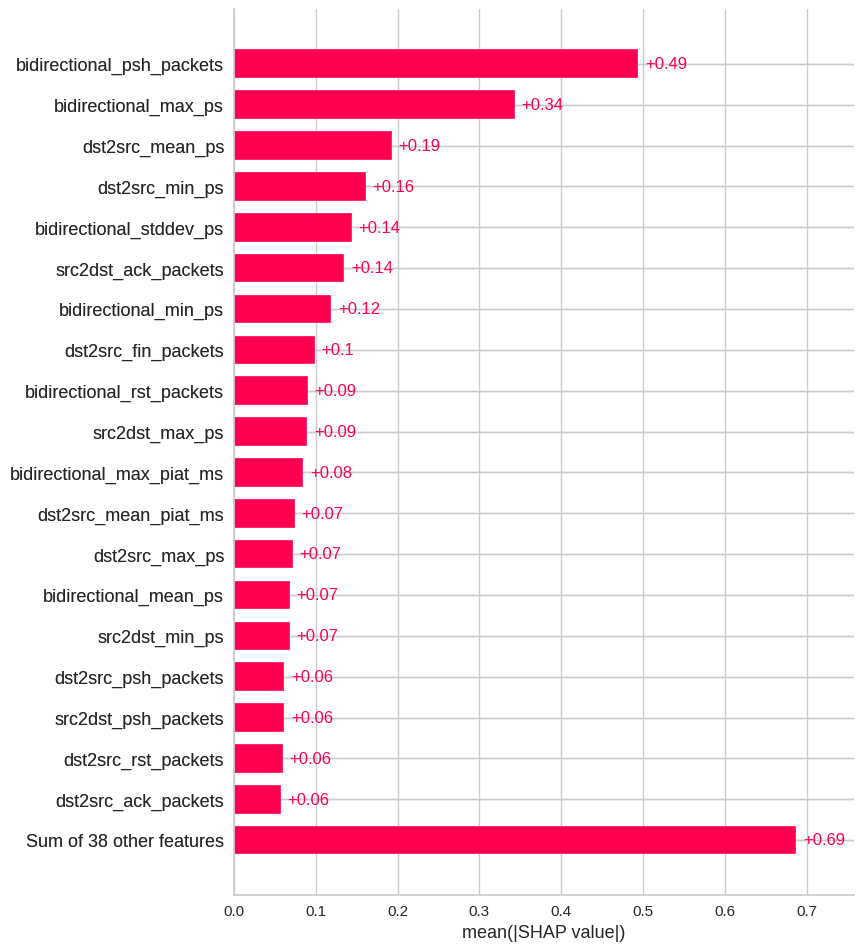

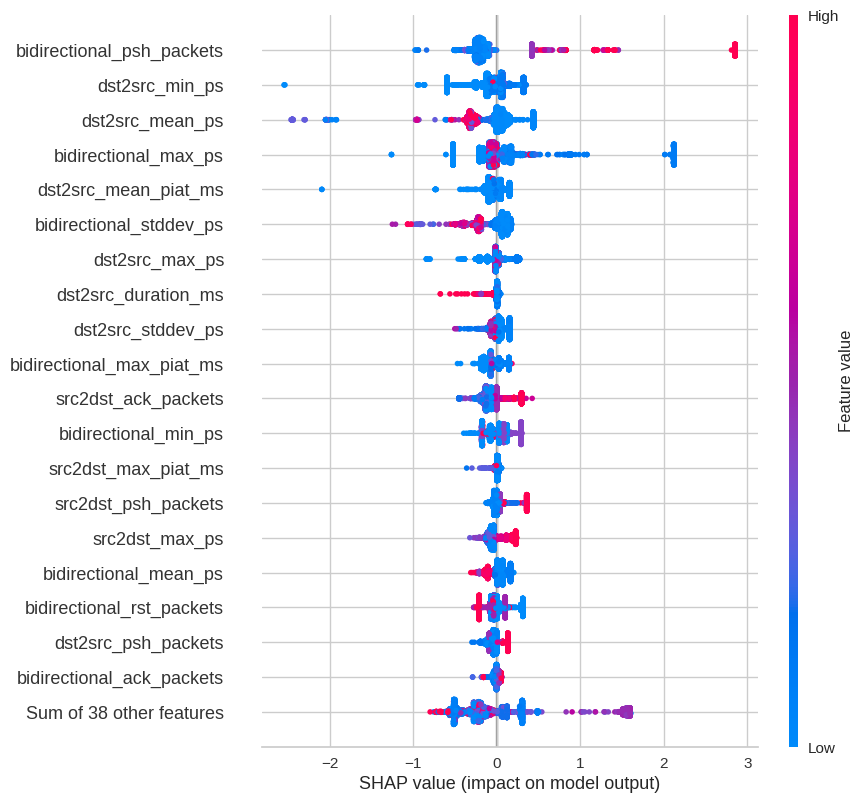

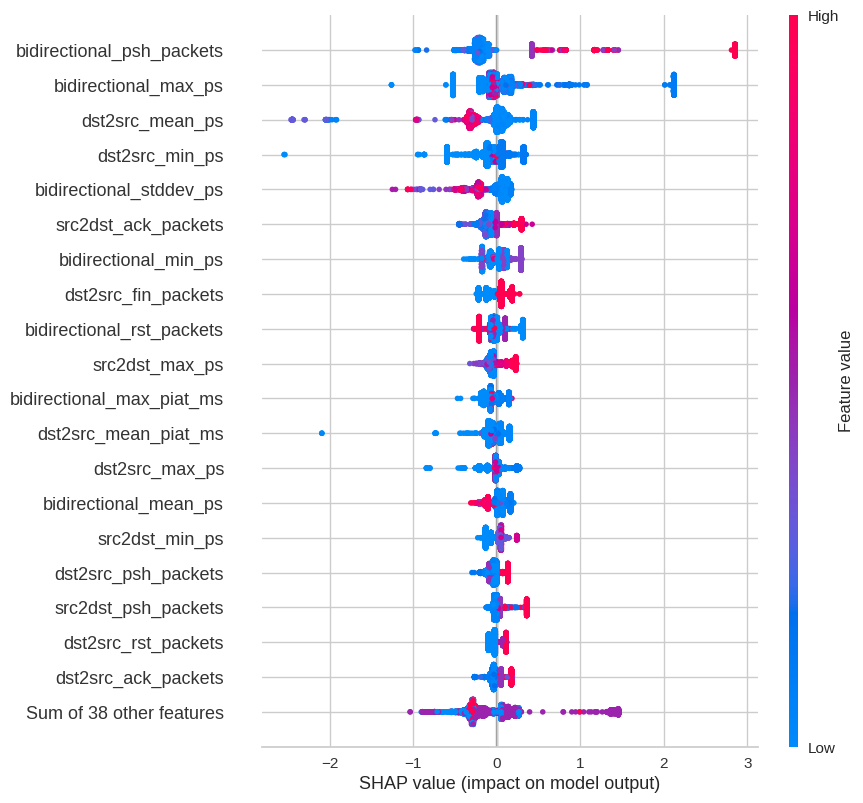

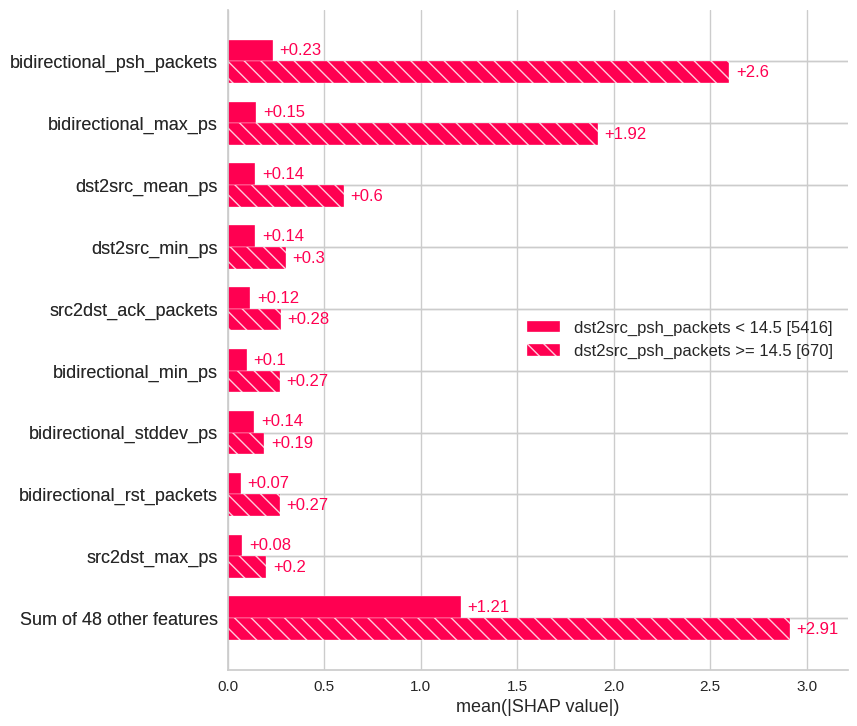

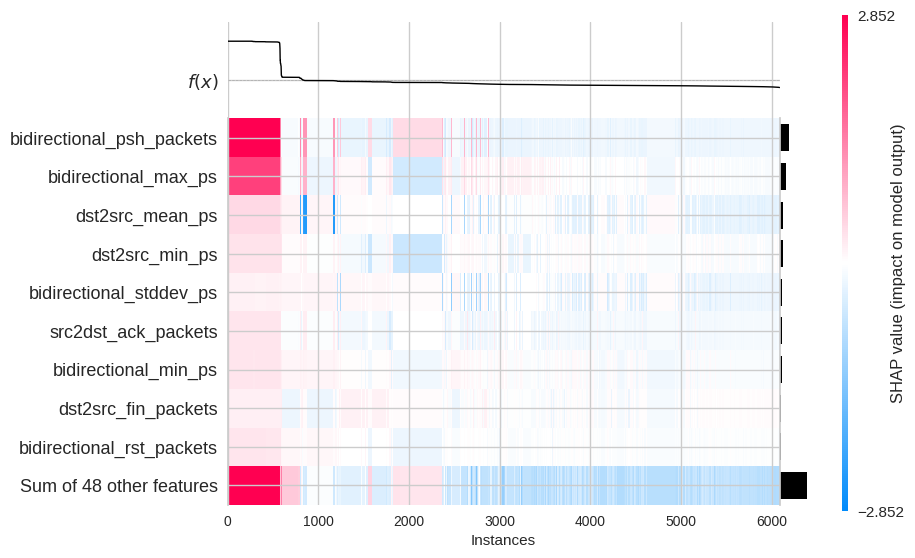

In [34]:
make_plot(11)

## Web Attack - Brute Force shap

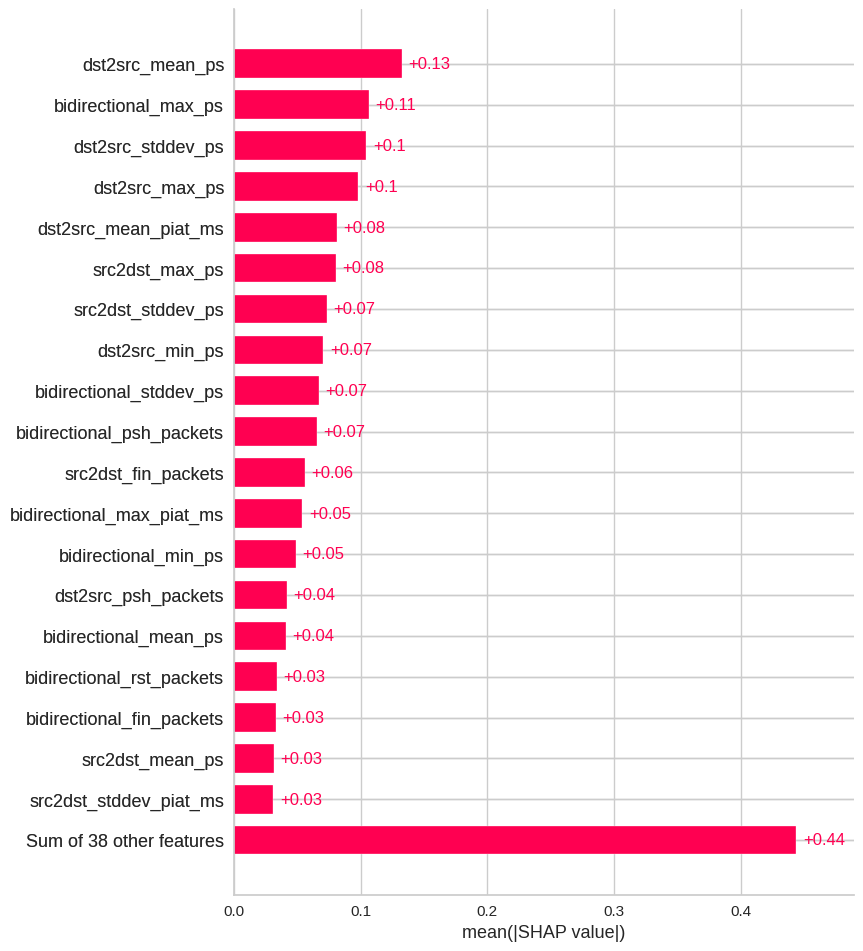

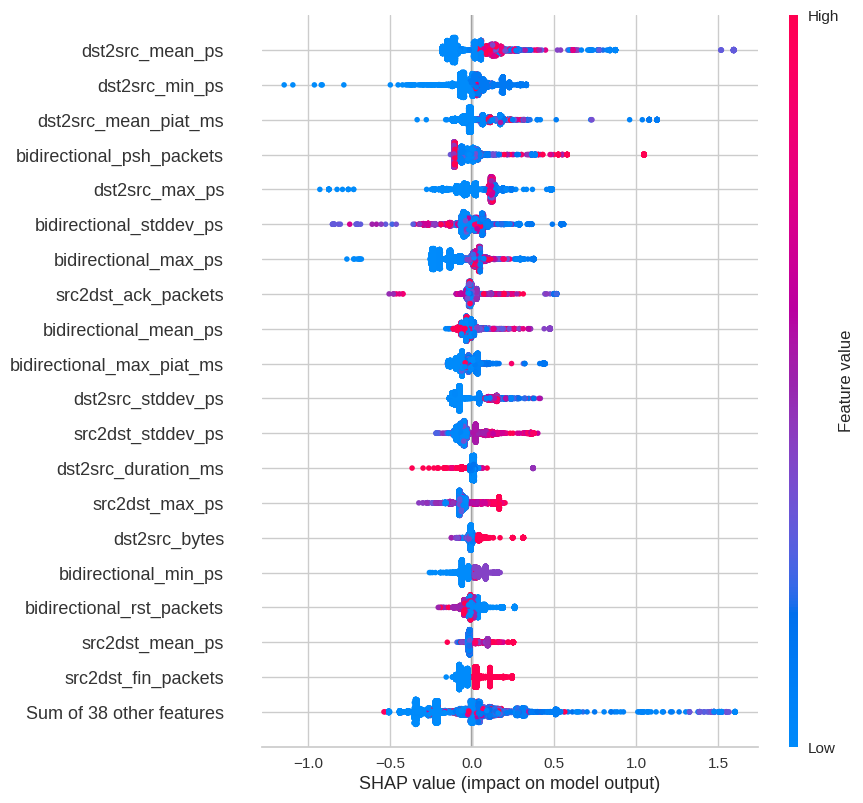

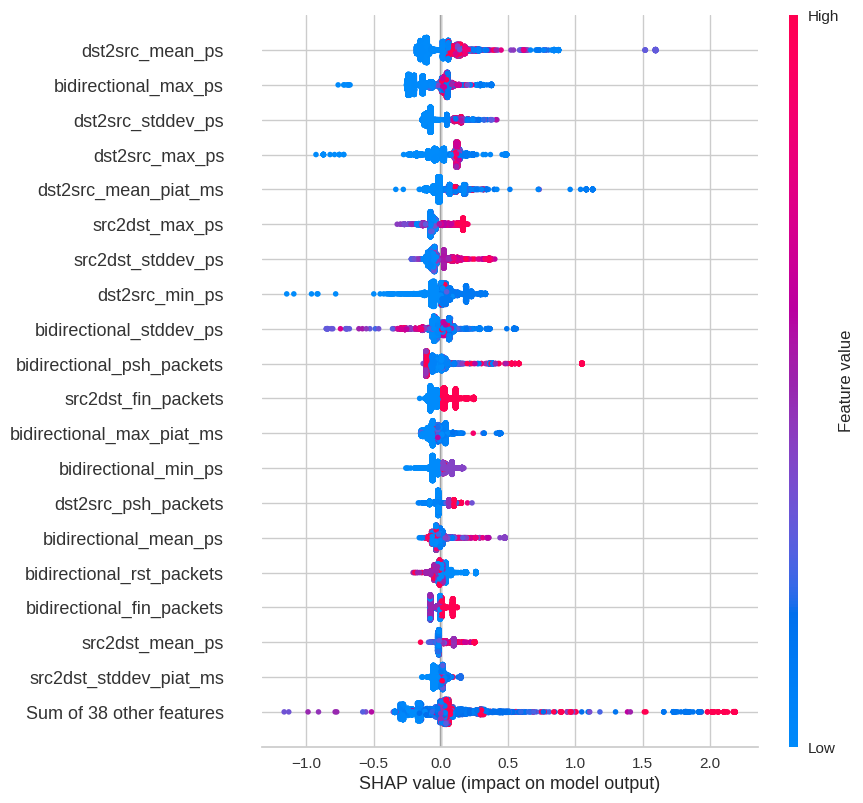

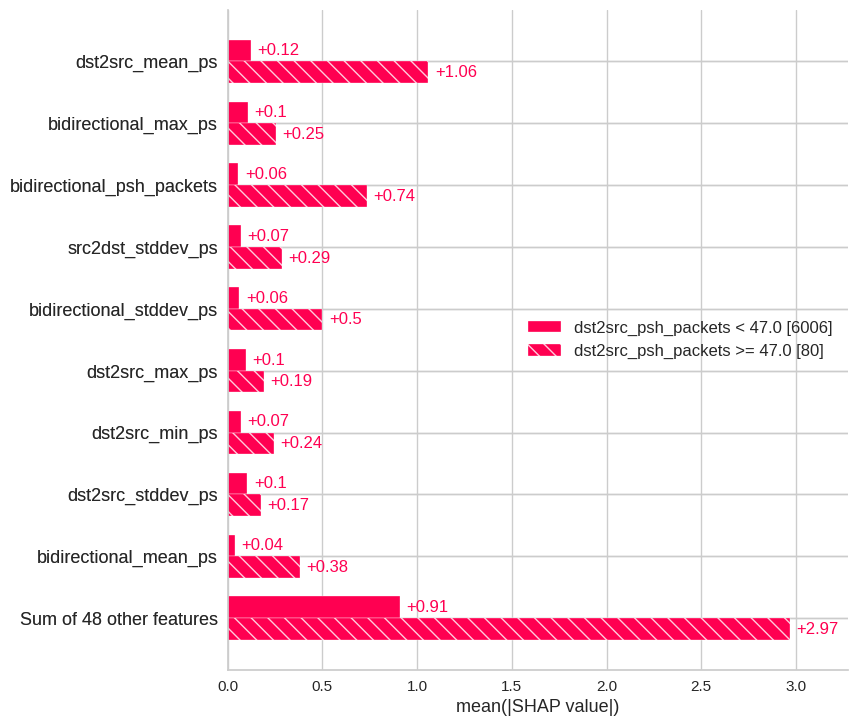

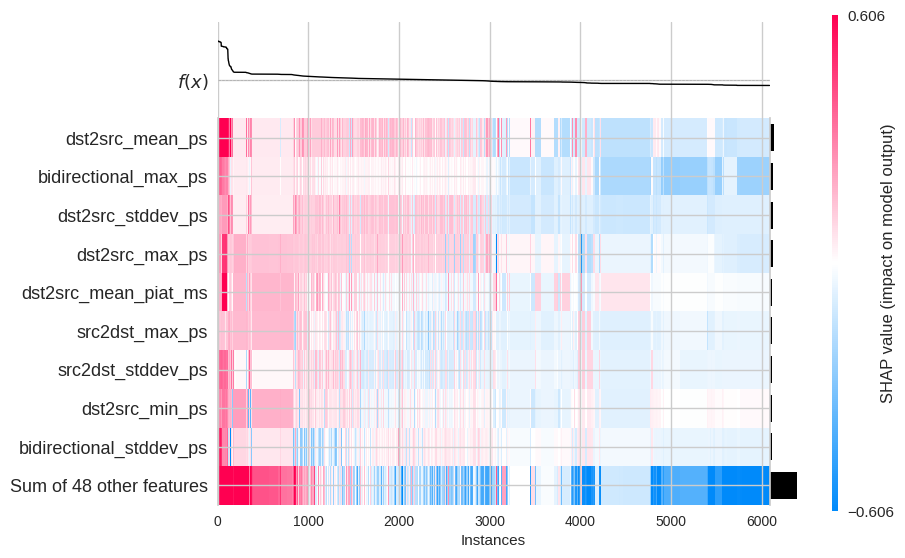

In [35]:
make_plot(12)

## Web Attack - Sql Injection shap

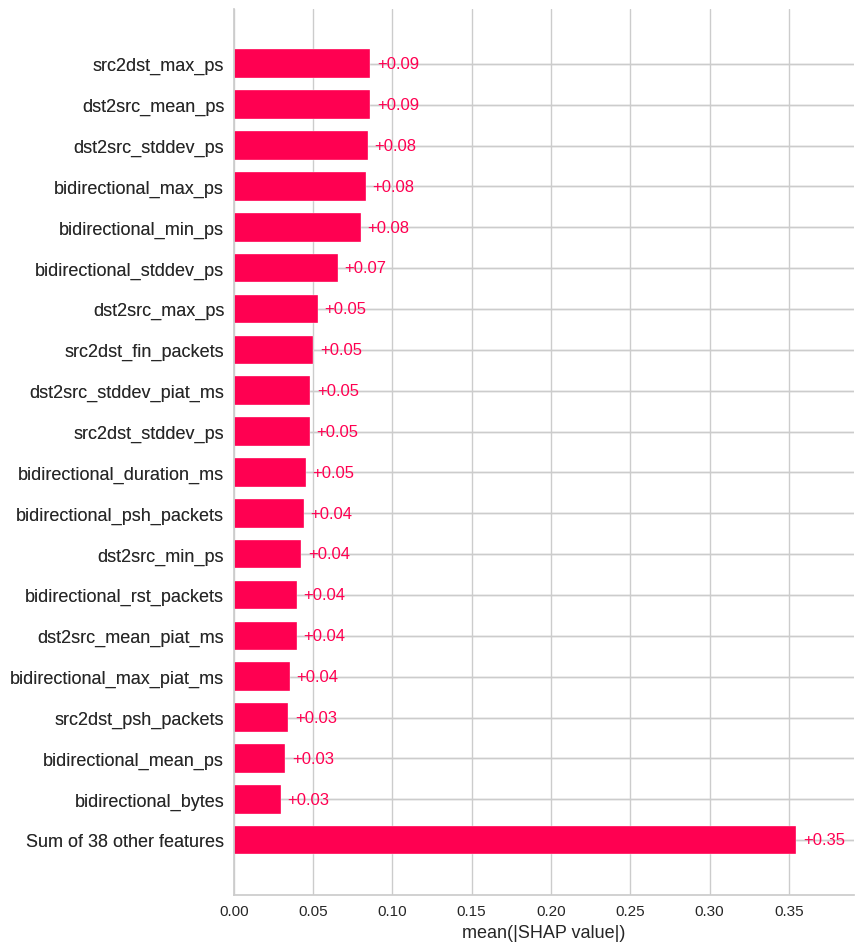

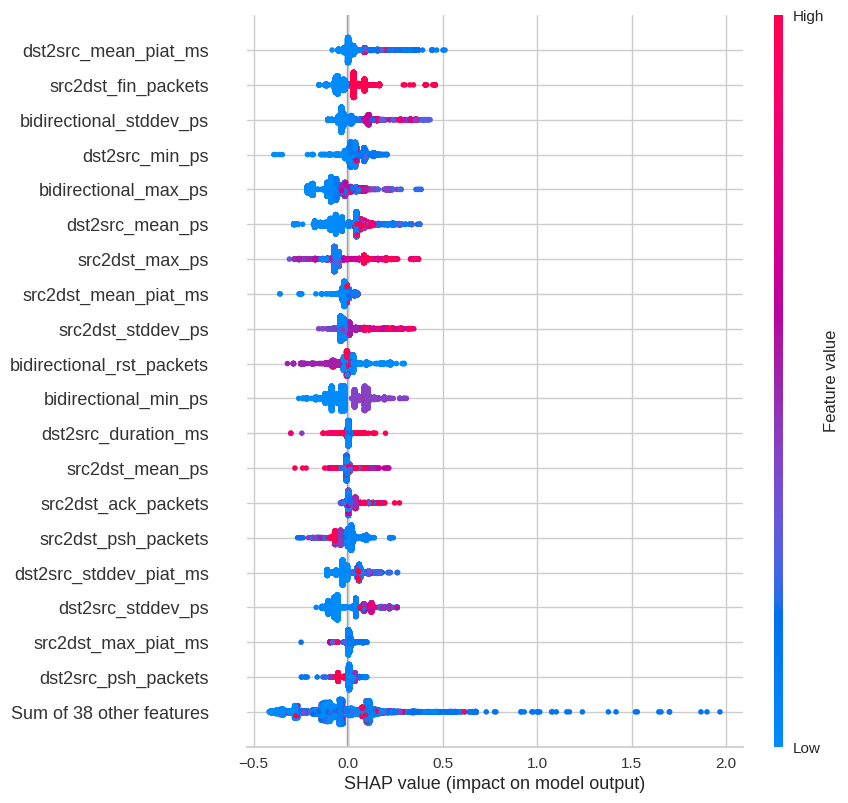

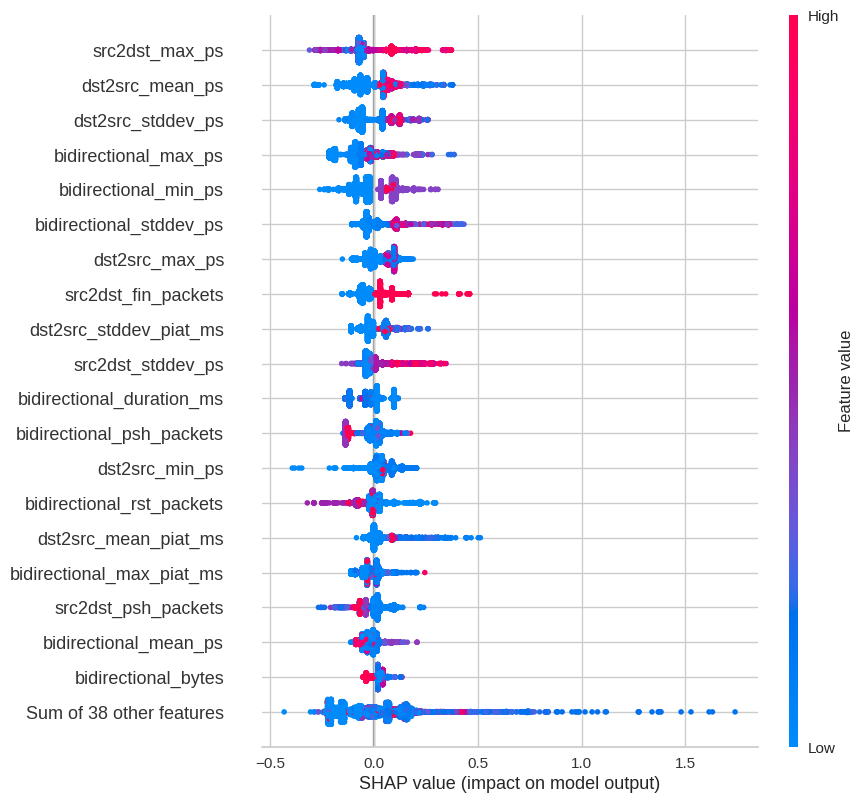

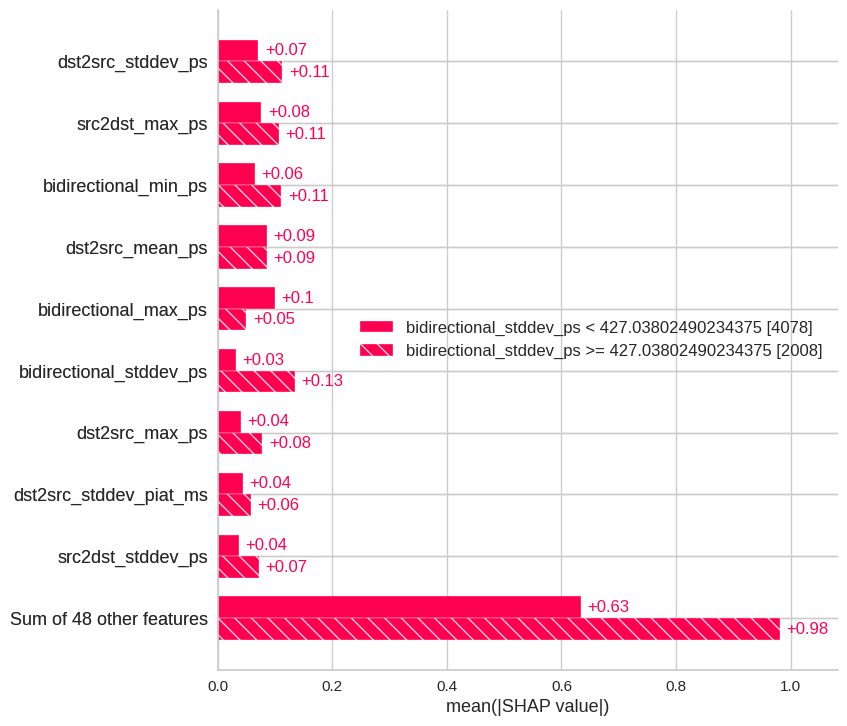

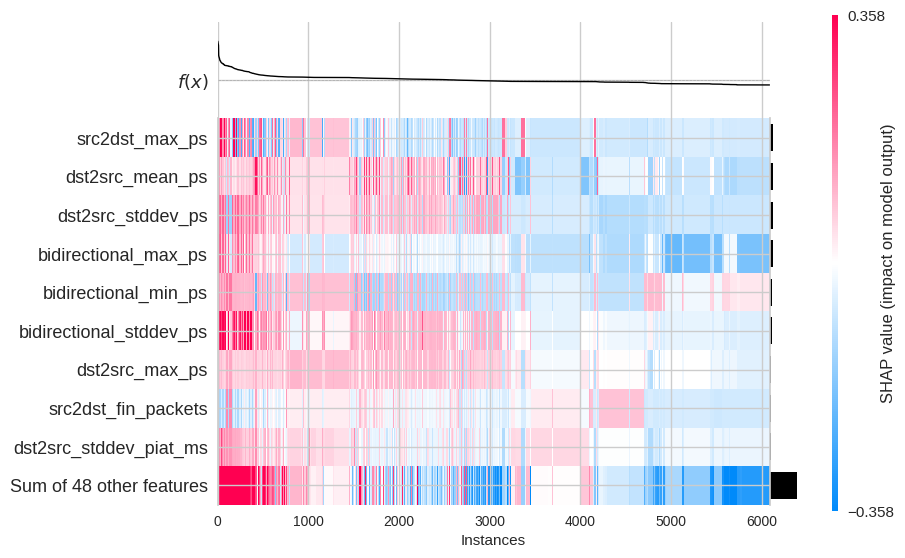

In [36]:
make_plot(13)

## Web Attack - XSS shap

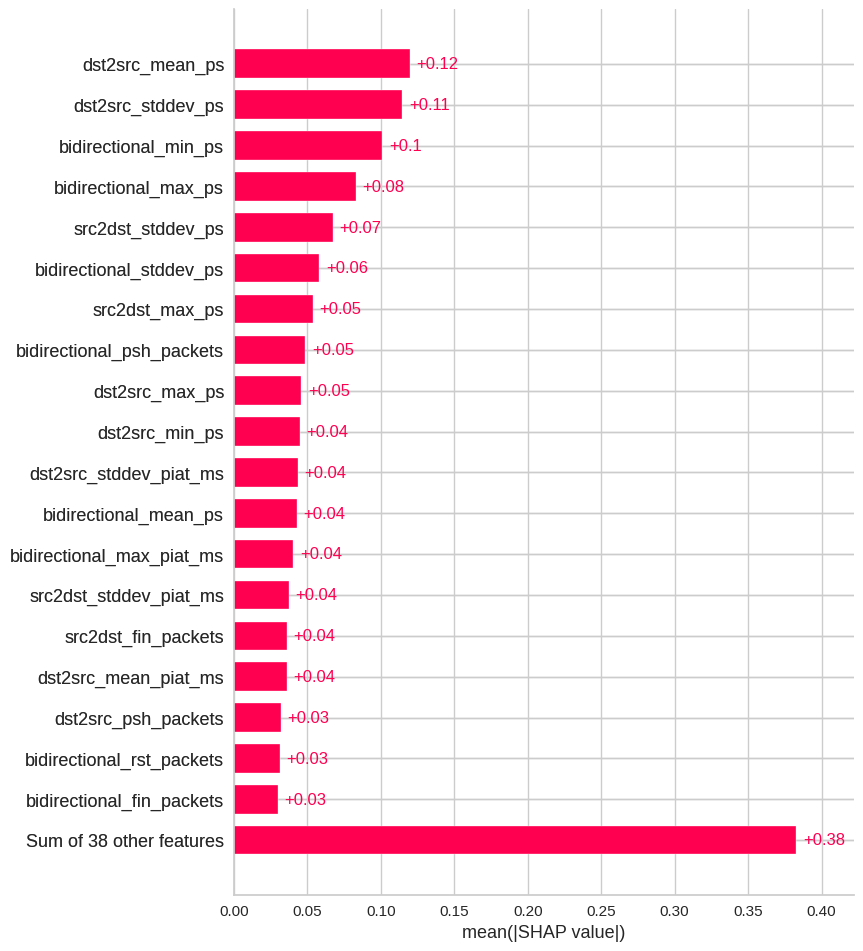

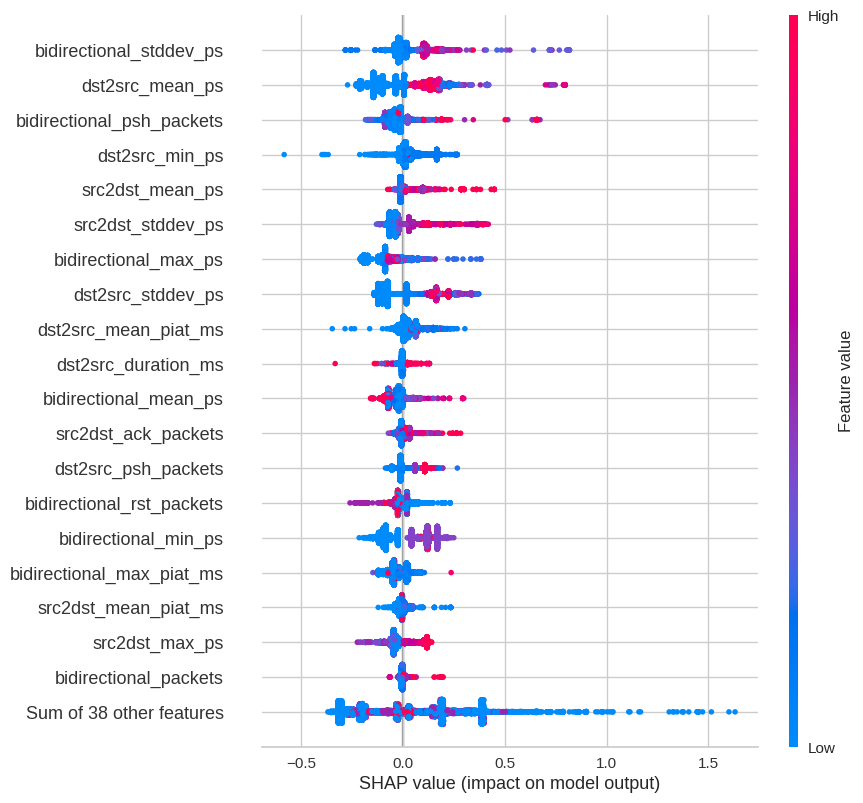

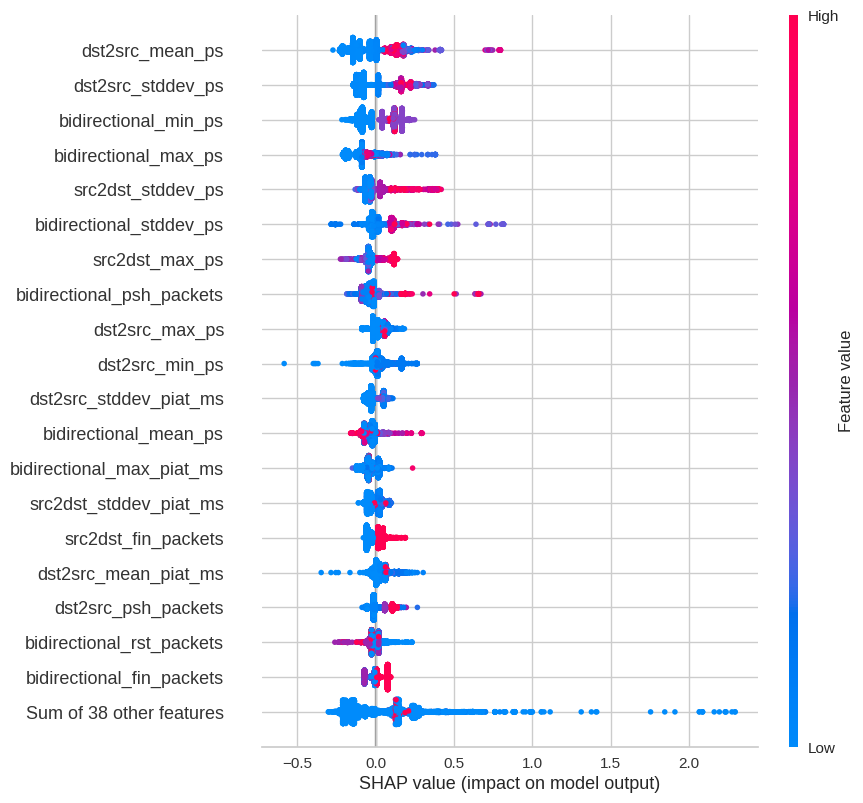

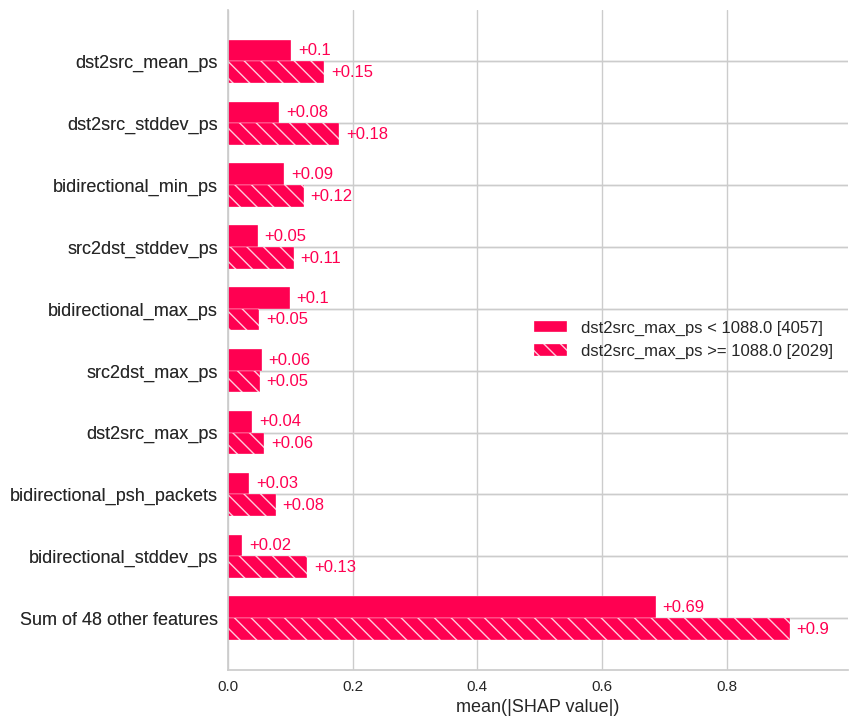

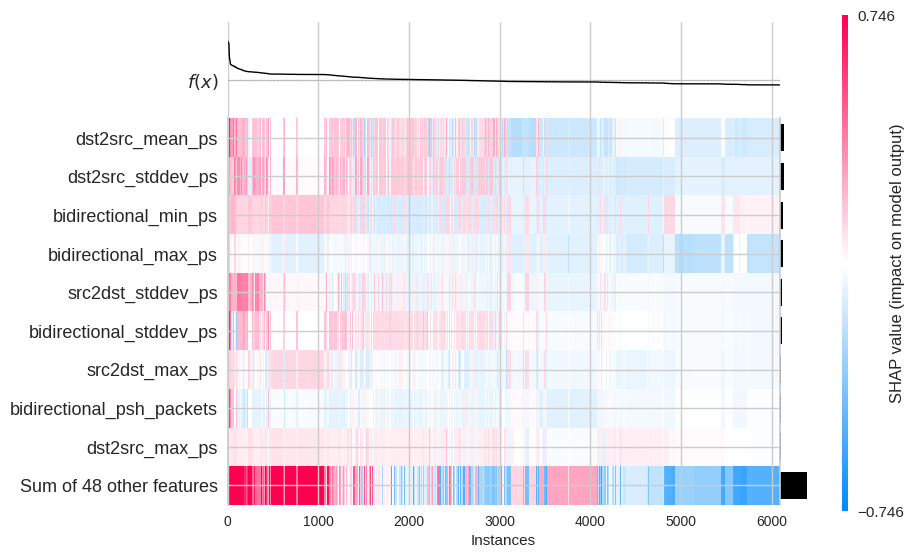

In [37]:
make_plot(14)

## Overall importance

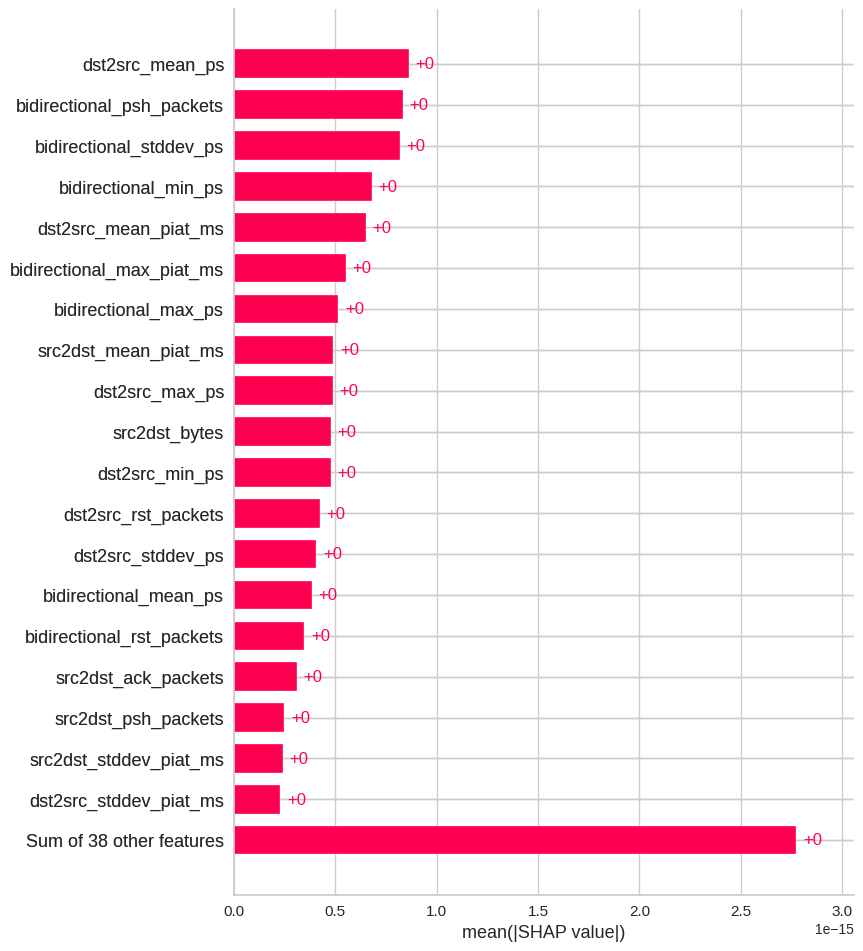

In [38]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

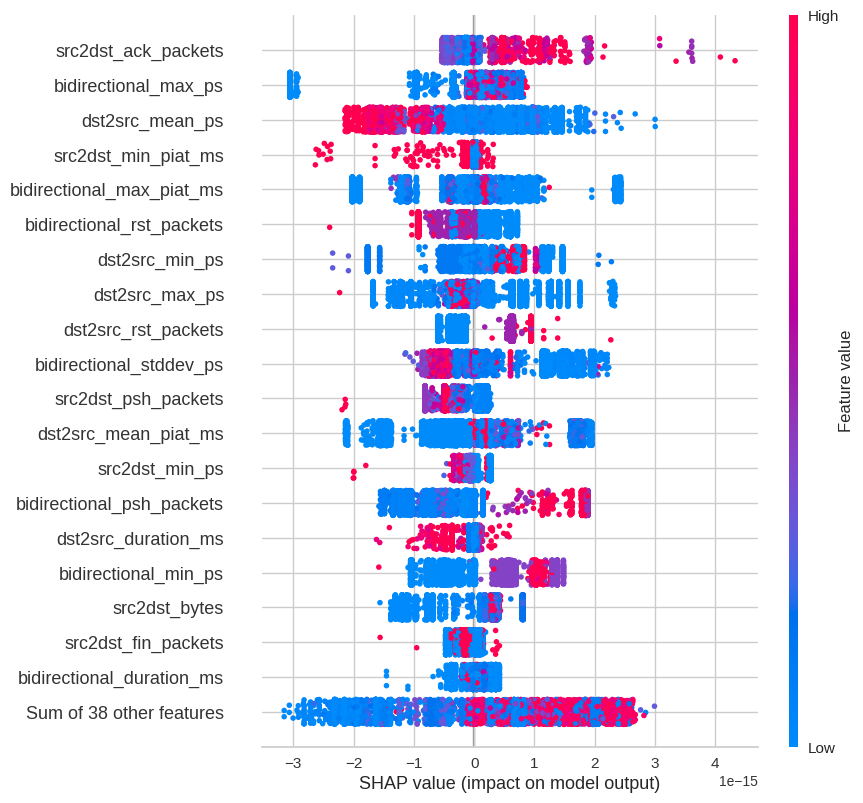

In [39]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

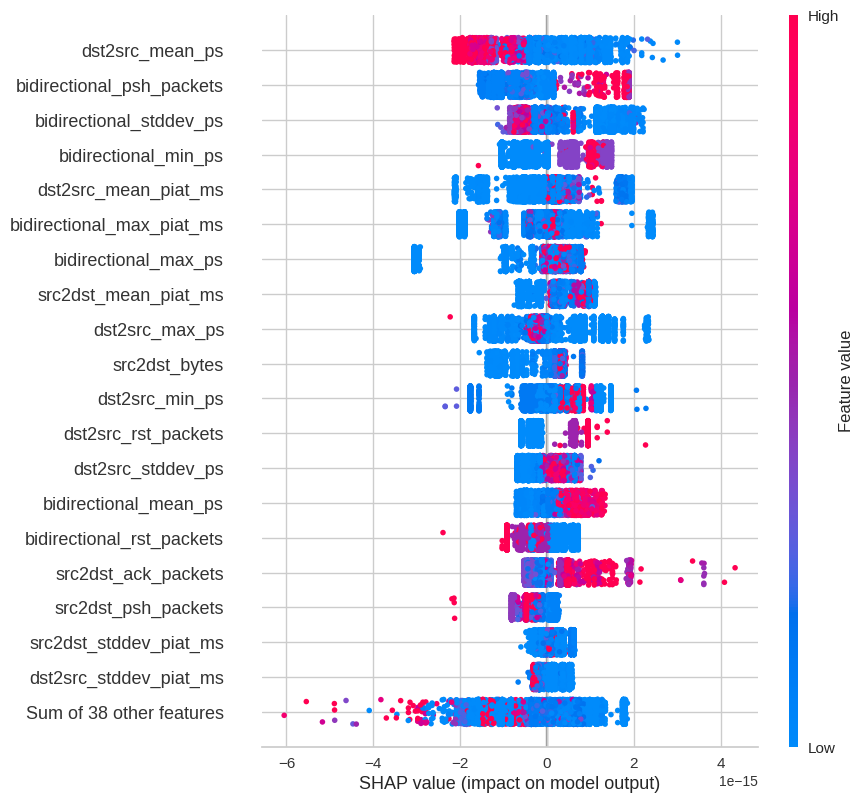

In [40]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [41]:
classes = sorted(pd.unique(ds['label']).tolist())

In [42]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4586932	total: 1.17s	remaining: 45.7s
1:	learn: 0.3166969	total: 2.68s	remaining: 51s
2:	learn: 0.2527542	total: 4.01s	remaining: 49.4s
3:	learn: 0.2101358	total: 5.32s	remaining: 47.8s
4:	learn: 0.1699979	total: 6.77s	remaining: 47.4s
5:	learn: 0.1464878	total: 8s	remaining: 45.3s
6:	learn: 0.1292413	total: 9.46s	remaining: 44.6s
7:	learn: 0.1157658	total: 10.7s	remaining: 42.9s
8:	learn: 0.1060990	total: 12.1s	remaining: 41.8s
9:	learn: 0.0935002	total: 13.4s	remaining: 40.2s
10:	learn: 0.0856902	total: 13.9s	remaining: 36.8s
11:	learn: 0.0785382	total: 15.5s	remaining: 36.1s
12:	learn: 0.0729323	total: 17s	remaining: 35.3s
13:	learn: 0.0684107	total: 18.2s	remaining: 33.7s
14:	learn: 0.0648201	total: 19.5s	remaining: 32.5s
15:	learn: 0.0593598	total: 20.1s	remaining: 30.1s
16:	learn: 0.0564581	total: 21.4s	remaining: 28.9s
17:	learn: 0.0541486	total: 21.9s	remaining: 26.7s
18:	learn: 0.0526187	total: 23.1s	remaining: 25.6s
19:	learn: 0.0509488	total: 24.6s	remaining: 24.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994360,0.887648
1,PRECISION,0.994413,0.832581
2,RECALL,0.994360,0.887648
3,F1 SCORE,0.994342,0.852743


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


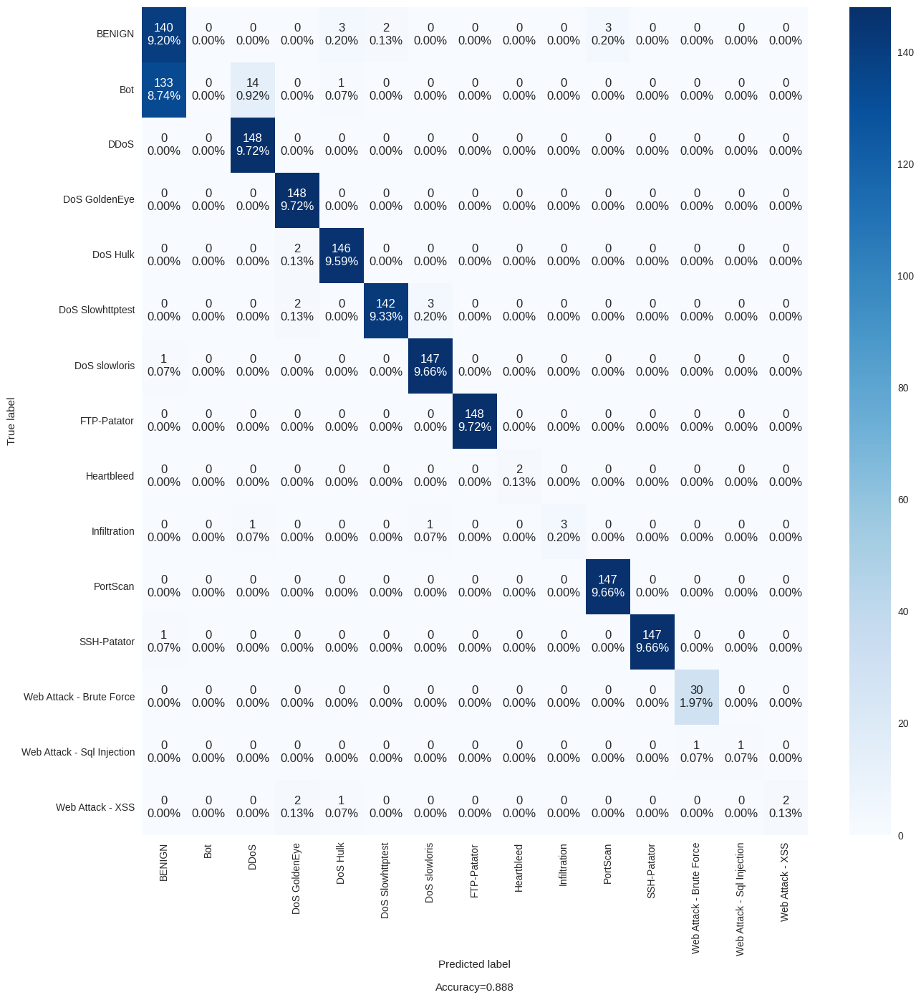

In [43]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [44]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5062237	total: 1.14s	remaining: 44.4s
1:	learn: 0.3290355	total: 2.51s	remaining: 47.7s
2:	learn: 0.2501518	total: 3.79s	remaining: 46.8s
3:	learn: 0.2024007	total: 5.26s	remaining: 47.4s
4:	learn: 0.1684648	total: 6.52s	remaining: 45.7s
5:	learn: 0.1437327	total: 8.04s	remaining: 45.6s
6:	learn: 0.1266532	total: 9.24s	remaining: 43.6s
7:	learn: 0.1114240	total: 10.7s	remaining: 42.7s
8:	learn: 0.0993693	total: 12s	remaining: 41.4s
9:	learn: 0.0907728	total: 13.4s	remaining: 40.2s
10:	learn: 0.0833605	total: 14.6s	remaining: 38.5s
11:	learn: 0.0773158	total: 16.2s	remaining: 37.7s
12:	learn: 0.0723106	total: 17.5s	remaining: 36.3s
13:	learn: 0.0647070	total: 18.8s	remaining: 34.9s
14:	learn: 0.0613078	total: 20.1s	remaining: 33.4s
15:	learn: 0.0587697	total: 20.1s	remaining: 30.2s
16:	learn: 0.0551313	total: 21.6s	remaining: 29.2s
17:	learn: 0.0533876	total: 22.9s	remaining: 28s
18:	learn: 0.0512526	total: 24.1s	remaining: 26.6s
19:	learn: 0.0495996	total: 25.6s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994360,0.890276
1,PRECISION,0.994450,0.834961
2,RECALL,0.994360,0.890276
3,F1 SCORE,0.994329,0.855164


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


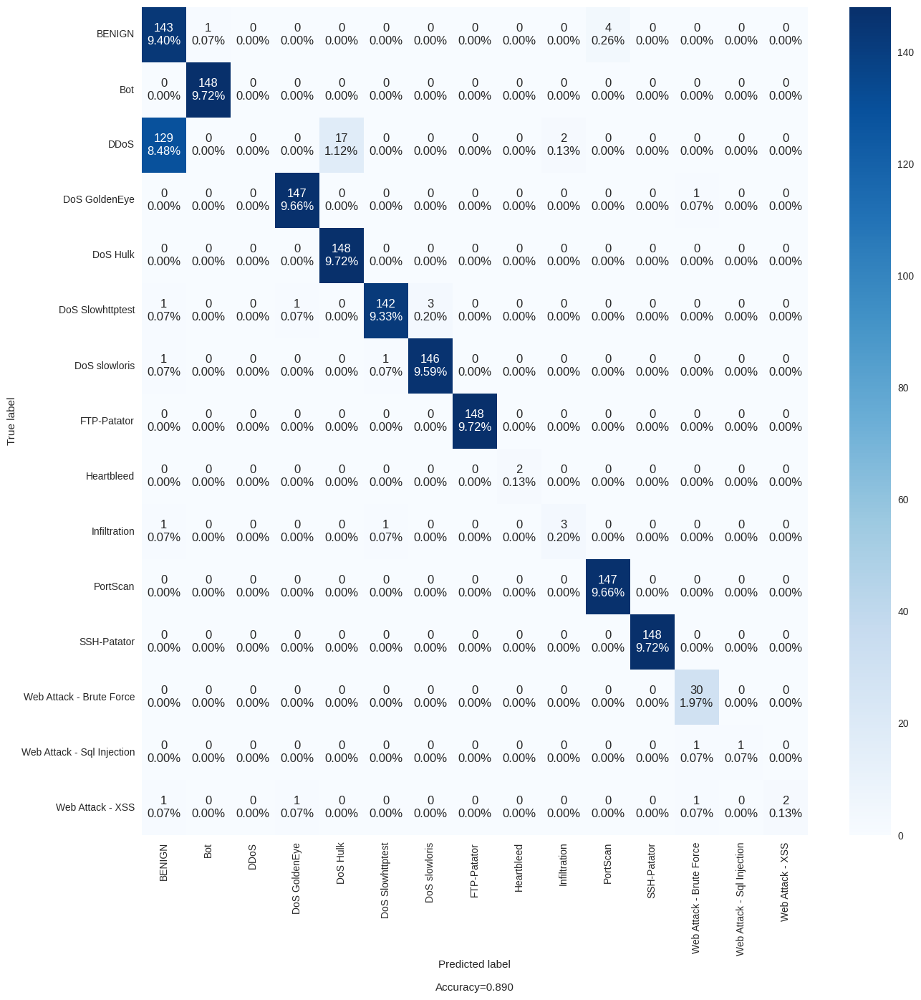

In [45]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [46]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4298460	total: 1.11s	remaining: 43.2s
1:	learn: 0.2795987	total: 2.61s	remaining: 49.6s
2:	learn: 0.2113678	total: 3.97s	remaining: 49s
3:	learn: 0.1705390	total: 5.55s	remaining: 50s
4:	learn: 0.1432989	total: 6.77s	remaining: 47.4s
5:	learn: 0.1189425	total: 8.09s	remaining: 45.8s
6:	learn: 0.1016939	total: 9.28s	remaining: 43.7s
7:	learn: 0.0895834	total: 10.7s	remaining: 42.6s
8:	learn: 0.0804480	total: 12s	remaining: 41.3s
9:	learn: 0.0734823	total: 12.3s	remaining: 36.8s
10:	learn: 0.0672632	total: 13.7s	remaining: 36.2s
11:	learn: 0.0624699	total: 15.2s	remaining: 35.6s
12:	learn: 0.0586711	total: 16.4s	remaining: 34.1s
13:	learn: 0.0559086	total: 17.9s	remaining: 33.3s
14:	learn: 0.0529807	total: 19.1s	remaining: 31.8s
15:	learn: 0.0500383	total: 20.6s	remaining: 30.8s
16:	learn: 0.0478866	total: 21.8s	remaining: 29.5s
17:	learn: 0.0455904	total: 23.3s	remaining: 28.5s
18:	learn: 0.0435771	total: 24.5s	remaining: 27.1s
19:	learn: 0.0418515	total: 24.8s	remaining: 24

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995997,0.892247
1,PRECISION,0.996071,0.832158
2,RECALL,0.995997,0.892247
3,F1 SCORE,0.995990,0.857574


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


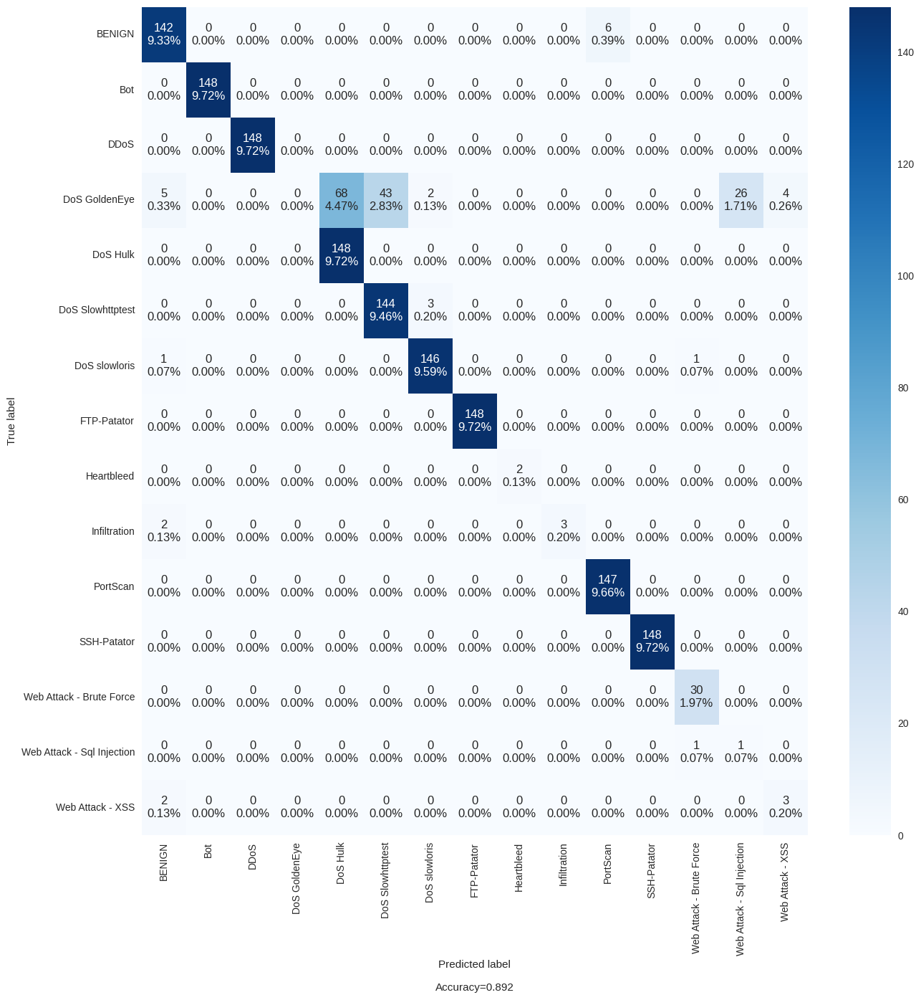

In [47]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [48]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4357160	total: 1.12s	remaining: 43.8s
1:	learn: 0.2878431	total: 2.49s	remaining: 47.3s
2:	learn: 0.2292555	total: 3.67s	remaining: 45.3s
3:	learn: 0.1873677	total: 5.08s	remaining: 45.7s
4:	learn: 0.1542876	total: 6.23s	remaining: 43.6s
5:	learn: 0.1309047	total: 7.67s	remaining: 43.5s
6:	learn: 0.1170465	total: 8.16s	remaining: 38.5s
7:	learn: 0.1044013	total: 9.4s	remaining: 37.6s
8:	learn: 0.0936632	total: 10.8s	remaining: 37.1s
9:	learn: 0.0852805	total: 11.9s	remaining: 35.6s
10:	learn: 0.0797412	total: 13.4s	remaining: 35.3s
11:	learn: 0.0719247	total: 14.6s	remaining: 34s
12:	learn: 0.0682509	total: 16s	remaining: 33.2s
13:	learn: 0.0648803	total: 17.3s	remaining: 32.1s
14:	learn: 0.0608736	total: 18.9s	remaining: 31.4s
15:	learn: 0.0566380	total: 20.1s	remaining: 30.1s
16:	learn: 0.0543882	total: 21.4s	remaining: 29s
17:	learn: 0.0516103	total: 22.6s	remaining: 27.6s
18:	learn: 0.0495508	total: 24.2s	remaining: 26.8s
19:	learn: 0.0462086	total: 25.4s	remaining: 25.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995633,0.894875
1,PRECISION,0.995708,0.830772
2,RECALL,0.995633,0.894875
3,F1 SCORE,0.995621,0.856328


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


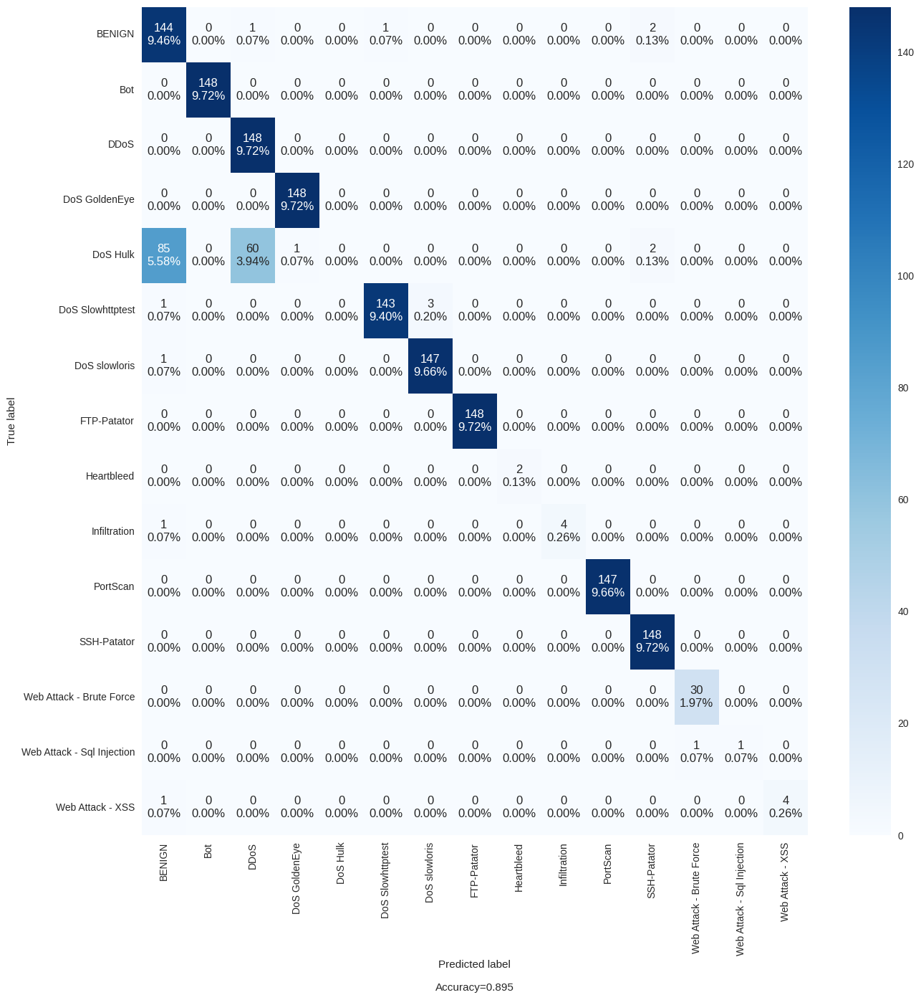

In [49]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [50]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3412103	total: 1.08s	remaining: 42.2s
1:	learn: 0.2389471	total: 2.44s	remaining: 46.3s
2:	learn: 0.1760253	total: 3.57s	remaining: 44s
3:	learn: 0.1425678	total: 4.95s	remaining: 44.6s
4:	learn: 0.1167496	total: 6.25s	remaining: 43.8s
5:	learn: 0.0971302	total: 7.55s	remaining: 42.8s
6:	learn: 0.0814919	total: 8.71s	remaining: 41.1s
7:	learn: 0.0714544	total: 10.2s	remaining: 40.8s
8:	learn: 0.0627620	total: 11.4s	remaining: 39.2s
9:	learn: 0.0560794	total: 12.7s	remaining: 38.2s
10:	learn: 0.0498071	total: 14.4s	remaining: 37.8s
11:	learn: 0.0450124	total: 15.7s	remaining: 36.7s
12:	learn: 0.0414705	total: 17s	remaining: 35.2s
13:	learn: 0.0375639	total: 18.4s	remaining: 34.2s
14:	learn: 0.0347484	total: 18.9s	remaining: 31.4s
15:	learn: 0.0324426	total: 20.1s	remaining: 30.1s
16:	learn: 0.0299736	total: 21.5s	remaining: 29.1s
17:	learn: 0.0283245	total: 21.6s	remaining: 26.4s
18:	learn: 0.0273194	total: 21.6s	remaining: 23.9s
19:	learn: 0.0267651	total: 21.7s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998180,0.895532
1,PRECISION,0.998180,0.836872
2,RECALL,0.998180,0.895532
3,F1 SCORE,0.998172,0.859216


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


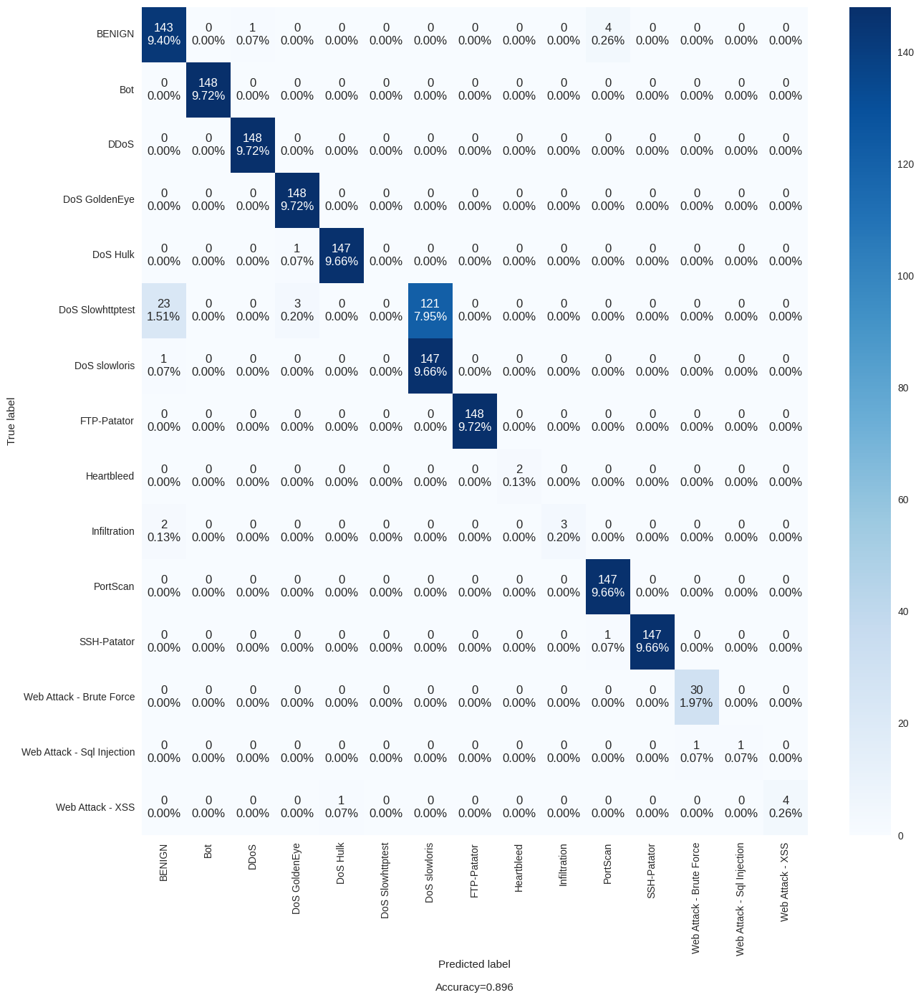

In [51]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [52]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3430939	total: 1.03s	remaining: 40.3s
1:	learn: 0.2431076	total: 2.36s	remaining: 44.9s
2:	learn: 0.1918696	total: 3.51s	remaining: 43.3s
3:	learn: 0.1560488	total: 4.92s	remaining: 44.2s
4:	learn: 0.1280197	total: 6.19s	remaining: 43.3s
5:	learn: 0.1070940	total: 7.58s	remaining: 43s
6:	learn: 0.0922312	total: 8.71s	remaining: 41.1s
7:	learn: 0.0817903	total: 10.2s	remaining: 40.7s
8:	learn: 0.0720686	total: 11.4s	remaining: 39.2s
9:	learn: 0.0651610	total: 12.7s	remaining: 38s
10:	learn: 0.0594695	total: 13.8s	remaining: 36.4s
11:	learn: 0.0537904	total: 15.1s	remaining: 35.3s
12:	learn: 0.0491348	total: 16.3s	remaining: 33.9s
13:	learn: 0.0459562	total: 17.7s	remaining: 32.9s
14:	learn: 0.0425092	total: 18.8s	remaining: 31.4s
15:	learn: 0.0395210	total: 20.3s	remaining: 30.4s
16:	learn: 0.0367017	total: 20.8s	remaining: 28.1s
17:	learn: 0.0349752	total: 21.9s	remaining: 26.8s
18:	learn: 0.0332296	total: 23.3s	remaining: 25.7s
19:	learn: 0.0310872	total: 24.4s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997271,0.892247
1,PRECISION,0.997273,0.839412
2,RECALL,0.997271,0.892247
3,F1 SCORE,0.997264,0.857795


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


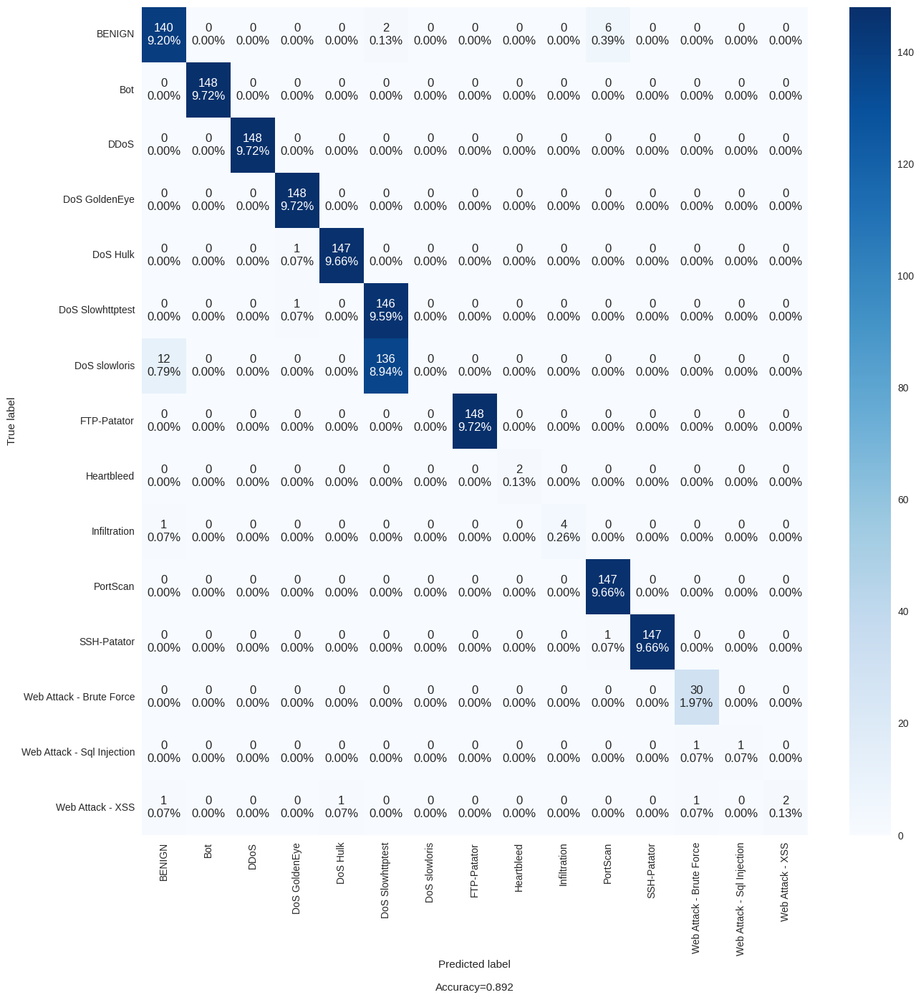

In [53]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [54]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4193486	total: 1.04s	remaining: 40.6s
1:	learn: 0.2965807	total: 2.43s	remaining: 46.1s
2:	learn: 0.2387954	total: 3.62s	remaining: 44.6s
3:	learn: 0.1962685	total: 4.98s	remaining: 44.9s
4:	learn: 0.1615854	total: 6.14s	remaining: 43s
5:	learn: 0.1401969	total: 7.54s	remaining: 42.7s
6:	learn: 0.1177315	total: 8.75s	remaining: 41.2s
7:	learn: 0.1050915	total: 10.2s	remaining: 40.8s
8:	learn: 0.0920942	total: 11.4s	remaining: 39.2s
9:	learn: 0.0849634	total: 12.8s	remaining: 38.4s
10:	learn: 0.0782425	total: 14s	remaining: 36.8s
11:	learn: 0.0728896	total: 15.5s	remaining: 36.1s
12:	learn: 0.0673084	total: 16.6s	remaining: 34.6s
13:	learn: 0.0606468	total: 18.2s	remaining: 33.8s
14:	learn: 0.0569731	total: 19.5s	remaining: 32.4s
15:	learn: 0.0544217	total: 20.9s	remaining: 31.3s
16:	learn: 0.0523640	total: 22.1s	remaining: 29.8s
17:	learn: 0.0501667	total: 23.6s	remaining: 28.8s
18:	learn: 0.0480596	total: 24.7s	remaining: 27.3s
19:	learn: 0.0457552	total: 26.1s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994905,0.890276
1,PRECISION,0.994967,0.842472
2,RECALL,0.994905,0.890276
3,F1 SCORE,0.994894,0.858589


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


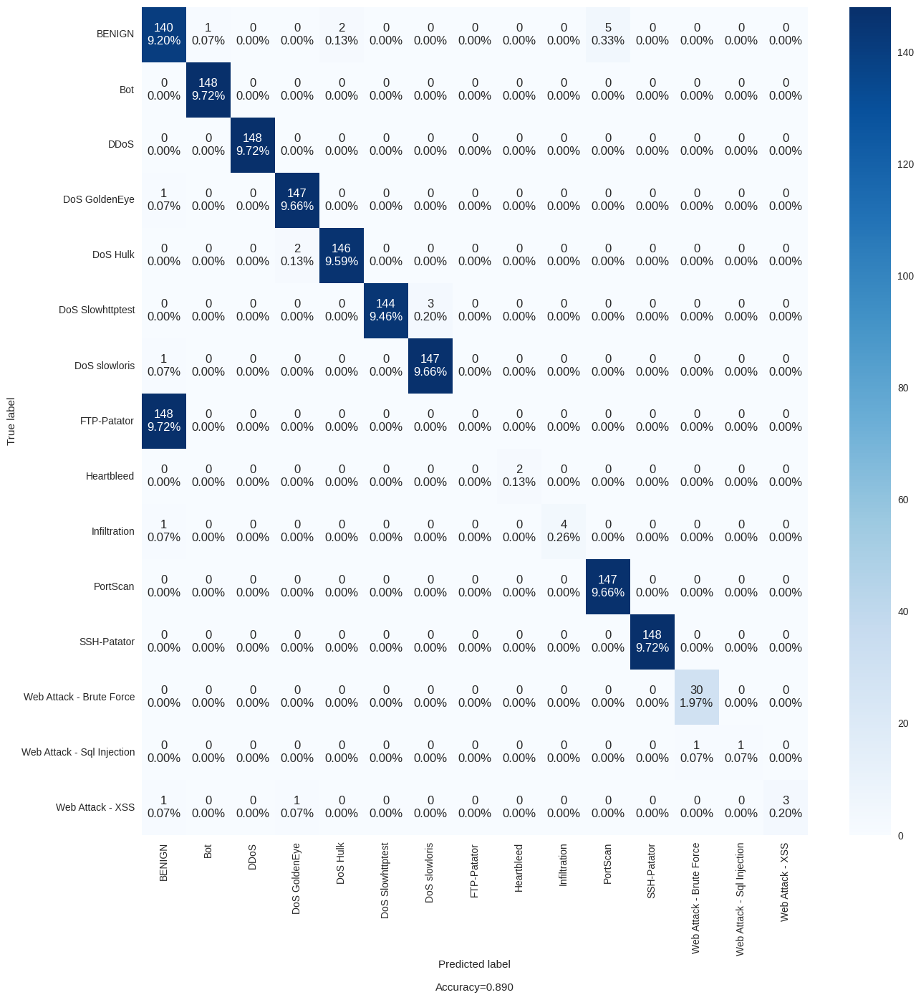

In [55]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [56]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4135557	total: 1.07s	remaining: 41.8s
1:	learn: 0.2816628	total: 2.4s	remaining: 45.5s
2:	learn: 0.2163554	total: 3.55s	remaining: 43.7s
3:	learn: 0.1759913	total: 4.94s	remaining: 44.4s
4:	learn: 0.1495960	total: 6.2s	remaining: 43.4s
5:	learn: 0.1273474	total: 7.58s	remaining: 42.9s
6:	learn: 0.1095836	total: 8.8s	remaining: 41.5s
7:	learn: 0.0978733	total: 10.2s	remaining: 40.9s
8:	learn: 0.0871667	total: 11.4s	remaining: 39.3s
9:	learn: 0.0805014	total: 12.8s	remaining: 38.3s
10:	learn: 0.0728987	total: 13.9s	remaining: 36.6s
11:	learn: 0.0662936	total: 15.3s	remaining: 35.7s
12:	learn: 0.0619762	total: 16.6s	remaining: 34.4s
13:	learn: 0.0591184	total: 17.9s	remaining: 33.2s
14:	learn: 0.0567482	total: 19.1s	remaining: 31.8s
15:	learn: 0.0540070	total: 20.6s	remaining: 30.9s
16:	learn: 0.0518903	total: 21.8s	remaining: 29.6s
17:	learn: 0.0489786	total: 23.1s	remaining: 28.3s
18:	learn: 0.0474185	total: 24.3s	remaining: 26.9s
19:	learn: 0.0455386	total: 25.7s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994899,0.988173
1,PRECISION,0.994959,0.987037
2,RECALL,0.994899,0.988173
3,F1 SCORE,0.994873,0.987250


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


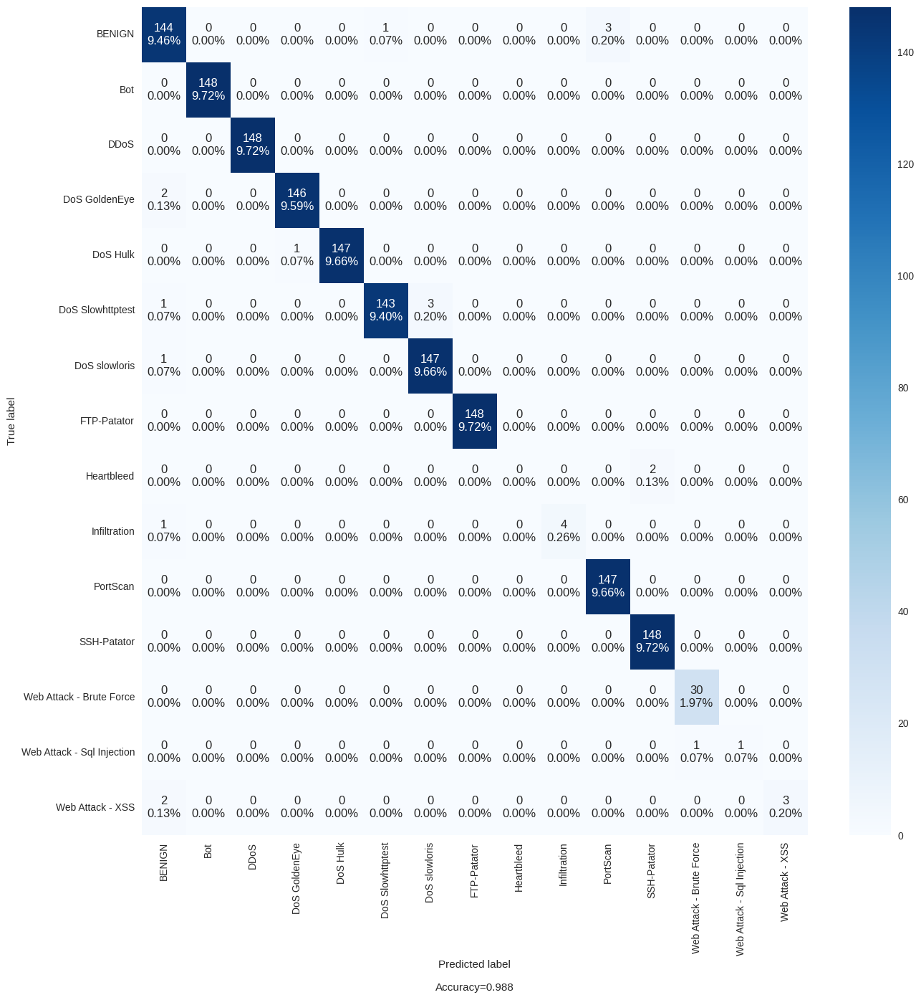

In [57]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [58]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3727400	total: 1.11s	remaining: 43.5s
1:	learn: 0.2733254	total: 2.52s	remaining: 47.9s
2:	learn: 0.1980761	total: 3.71s	remaining: 45.8s
3:	learn: 0.1615247	total: 5.02s	remaining: 45.2s
4:	learn: 0.1351384	total: 6.23s	remaining: 43.6s
5:	learn: 0.1218874	total: 6.55s	remaining: 37.1s
6:	learn: 0.1066963	total: 7.95s	remaining: 37.5s
7:	learn: 0.0928748	total: 9.29s	remaining: 37.1s
8:	learn: 0.0834501	total: 10.5s	remaining: 36.1s
9:	learn: 0.0738909	total: 11.9s	remaining: 35.7s
10:	learn: 0.0681939	total: 13.2s	remaining: 34.7s
11:	learn: 0.0638952	total: 14.5s	remaining: 33.7s
12:	learn: 0.0598760	total: 15.6s	remaining: 32.4s
13:	learn: 0.0567161	total: 17.1s	remaining: 31.7s
14:	learn: 0.0539188	total: 18.3s	remaining: 30.5s
15:	learn: 0.0510411	total: 19.7s	remaining: 29.6s
16:	learn: 0.0488893	total: 20.9s	remaining: 28.3s
17:	learn: 0.0465090	total: 22.4s	remaining: 27.4s
18:	learn: 0.0449306	total: 23.6s	remaining: 26.1s
19:	learn: 0.0432704	total: 24.9s	remaini

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995547,0.987516
1,PRECISION,0.995624,0.984526
2,RECALL,0.995547,0.987516
3,F1 SCORE,0.995521,0.985665


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


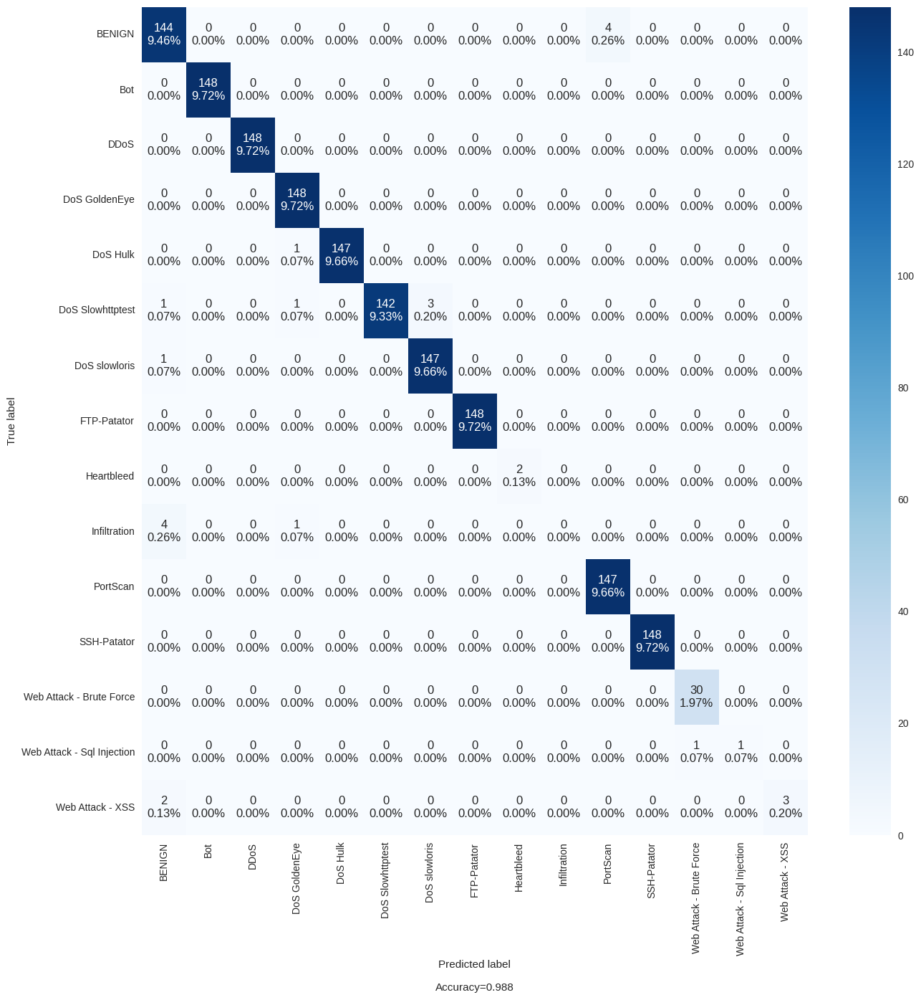

In [59]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [60]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4728557	total: 1.13s	remaining: 43.9s
1:	learn: 0.3247287	total: 2.45s	remaining: 46.5s
2:	learn: 0.2578285	total: 3.71s	remaining: 45.7s
3:	learn: 0.2054925	total: 5.21s	remaining: 46.9s
4:	learn: 0.1622467	total: 6.43s	remaining: 45s
5:	learn: 0.1356761	total: 7.78s	remaining: 44.1s
6:	learn: 0.1155659	total: 9.04s	remaining: 42.6s
7:	learn: 0.0981890	total: 10.5s	remaining: 42.1s
8:	learn: 0.0872167	total: 11.7s	remaining: 40.3s
9:	learn: 0.0791030	total: 13.2s	remaining: 39.7s
10:	learn: 0.0729448	total: 14.4s	remaining: 38s
11:	learn: 0.0667060	total: 15.9s	remaining: 37s
12:	learn: 0.0619075	total: 17.1s	remaining: 35.4s
13:	learn: 0.0581240	total: 18.5s	remaining: 34.4s
14:	learn: 0.0549651	total: 19.8s	remaining: 32.9s
15:	learn: 0.0521682	total: 21.2s	remaining: 31.9s
16:	learn: 0.0485955	total: 22.5s	remaining: 30.4s
17:	learn: 0.0462110	total: 23.9s	remaining: 29.2s
18:	learn: 0.0437929	total: 25.1s	remaining: 27.8s
19:	learn: 0.0421492	total: 26.7s	remaining: 26

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995268,0.896189
1,PRECISION,0.995354,0.835128
2,RECALL,0.995268,0.896189
3,F1 SCORE,0.995263,0.858295


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


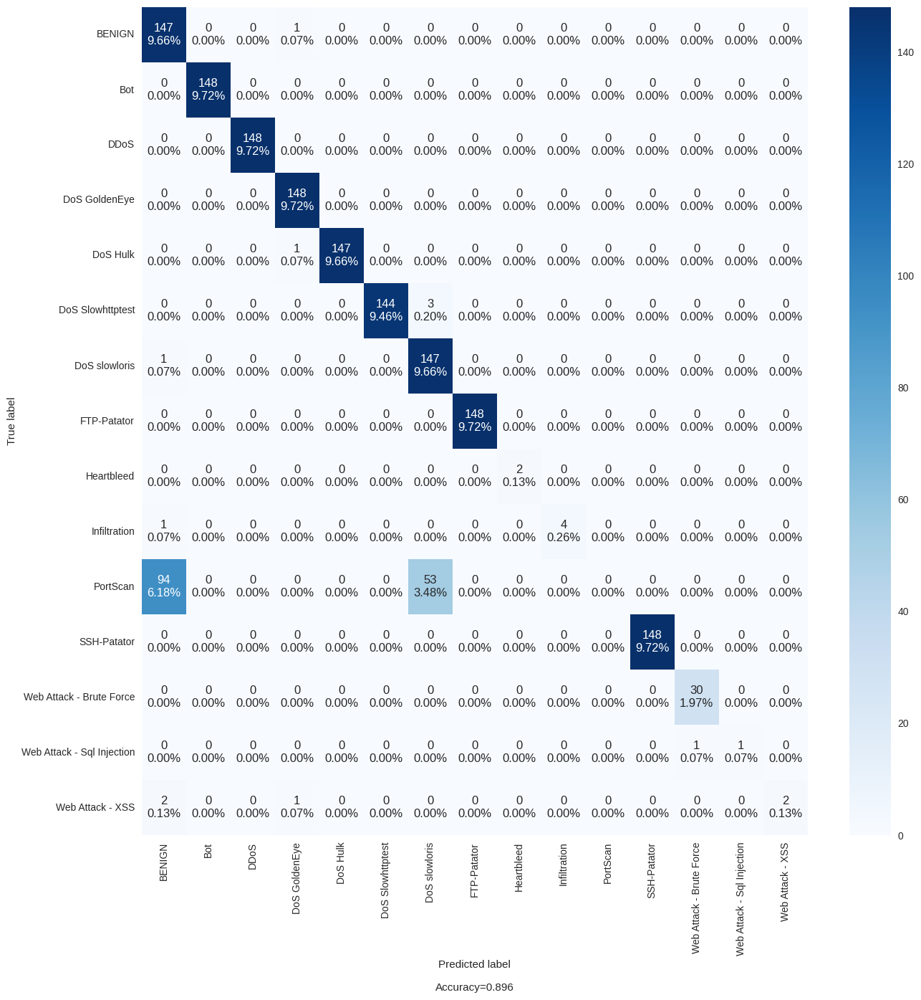

In [61]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [62]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4015039	total: 1.03s	remaining: 40.1s
1:	learn: 0.2948714	total: 2.49s	remaining: 47.3s
2:	learn: 0.2360055	total: 3.68s	remaining: 45.4s
3:	learn: 0.1823557	total: 5.15s	remaining: 46.3s
4:	learn: 0.1546177	total: 6.28s	remaining: 43.9s
5:	learn: 0.1339572	total: 7.71s	remaining: 43.7s
6:	learn: 0.1179344	total: 8.87s	remaining: 41.8s
7:	learn: 0.1067613	total: 8.94s	remaining: 35.8s
8:	learn: 0.0967027	total: 10.4s	remaining: 36s
9:	learn: 0.0876183	total: 11.7s	remaining: 35.2s
10:	learn: 0.0816115	total: 13.1s	remaining: 34.4s
11:	learn: 0.0745366	total: 14.2s	remaining: 33.2s
12:	learn: 0.0683644	total: 15.6s	remaining: 32.4s
13:	learn: 0.0637665	total: 17s	remaining: 31.5s
14:	learn: 0.0588371	total: 18.4s	remaining: 30.6s
15:	learn: 0.0557995	total: 19.6s	remaining: 29.4s
16:	learn: 0.0538622	total: 21.1s	remaining: 28.6s
17:	learn: 0.0511070	total: 22.3s	remaining: 27.3s
18:	learn: 0.0486454	total: 23.7s	remaining: 26.2s
19:	learn: 0.0467591	total: 24.9s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994723,0.888962
1,PRECISION,0.994834,0.841638
2,RECALL,0.994723,0.888962
3,F1 SCORE,0.994719,0.857201


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


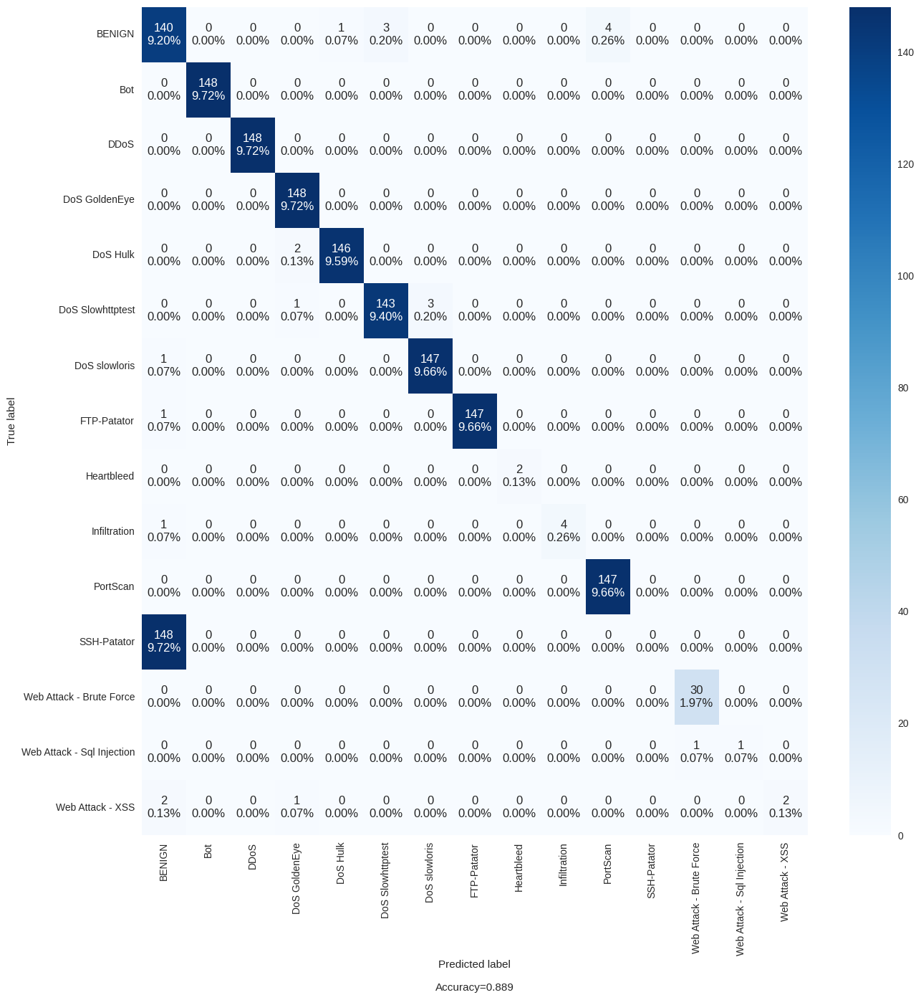

In [63]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [64]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4232287	total: 1.17s	remaining: 45.7s
1:	learn: 0.2974032	total: 2.65s	remaining: 50.4s
2:	learn: 0.2306463	total: 3.88s	remaining: 47.8s
3:	learn: 0.1905728	total: 5.3s	remaining: 47.7s
4:	learn: 0.1461720	total: 6.52s	remaining: 45.6s
5:	learn: 0.1253231	total: 7.92s	remaining: 44.9s
6:	learn: 0.1109630	total: 9.29s	remaining: 43.8s
7:	learn: 0.0974539	total: 10.7s	remaining: 42.8s
8:	learn: 0.0876969	total: 12.1s	remaining: 41.8s
9:	learn: 0.0815255	total: 13.4s	remaining: 40.1s
10:	learn: 0.0754468	total: 14.9s	remaining: 39.3s
11:	learn: 0.0690981	total: 16.1s	remaining: 37.5s
12:	learn: 0.0654936	total: 16.1s	remaining: 33.5s
13:	learn: 0.0621343	total: 17.7s	remaining: 32.8s
14:	learn: 0.0567785	total: 18.9s	remaining: 31.5s
15:	learn: 0.0521990	total: 20.3s	remaining: 30.4s
16:	learn: 0.0483852	total: 21.5s	remaining: 29.1s
17:	learn: 0.0460535	total: 23s	remaining: 28.1s
18:	learn: 0.0448672	total: 24.2s	remaining: 26.8s
19:	learn: 0.0435613	total: 25.7s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995641,0.966491
1,PRECISION,0.995720,0.955872
2,RECALL,0.995641,0.966491
3,F1 SCORE,0.995629,0.960219


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


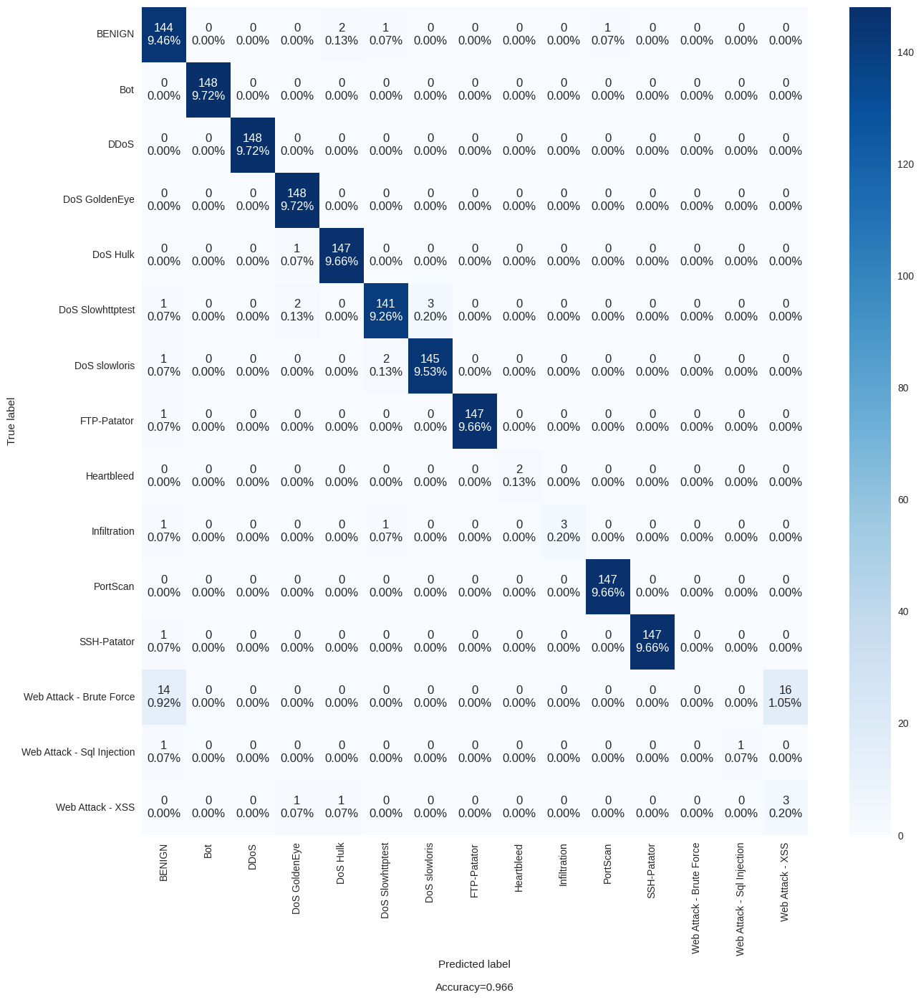

In [65]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [66]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3678286	total: 1.11s	remaining: 43.4s
1:	learn: 0.2729758	total: 2.51s	remaining: 47.7s
2:	learn: 0.2080670	total: 3.91s	remaining: 48.2s
3:	learn: 0.1681544	total: 5.31s	remaining: 47.8s
4:	learn: 0.1351528	total: 6.59s	remaining: 46.2s
5:	learn: 0.1151404	total: 8s	remaining: 45.3s
6:	learn: 0.1005908	total: 9.26s	remaining: 43.7s
7:	learn: 0.0884313	total: 10.8s	remaining: 43.2s
8:	learn: 0.0791196	total: 12s	remaining: 41.2s
9:	learn: 0.0711924	total: 13.4s	remaining: 40.3s
10:	learn: 0.0655498	total: 14.7s	remaining: 38.8s
11:	learn: 0.0610179	total: 16.1s	remaining: 37.6s
12:	learn: 0.0559729	total: 17.3s	remaining: 36s
13:	learn: 0.0527878	total: 18.9s	remaining: 35.1s
14:	learn: 0.0501847	total: 20.1s	remaining: 33.5s
15:	learn: 0.0478524	total: 21.5s	remaining: 32.3s
16:	learn: 0.0461383	total: 22.7s	remaining: 30.7s
17:	learn: 0.0432786	total: 23.3s	remaining: 28.5s
18:	learn: 0.0414160	total: 24.8s	remaining: 27.4s
19:	learn: 0.0395341	total: 26.2s	remaining: 26.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996050,0.988173
1,PRECISION,0.996108,0.986989
2,RECALL,0.996050,0.988173
3,F1 SCORE,0.996047,0.987079


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


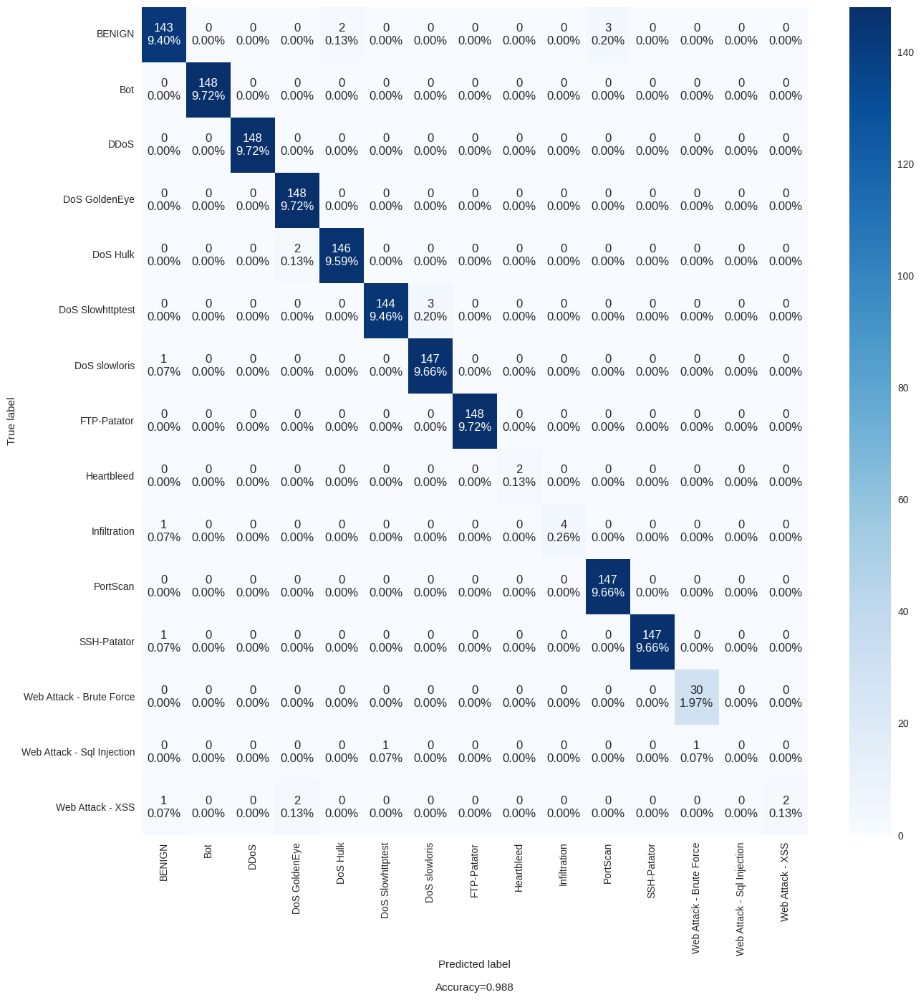

In [67]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [68]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3672142	total: 1.09s	remaining: 42.6s
1:	learn: 0.2771576	total: 2.49s	remaining: 47.2s
2:	learn: 0.2210956	total: 3.7s	remaining: 45.7s
3:	learn: 0.1721033	total: 5.15s	remaining: 46.4s
4:	learn: 0.1439227	total: 6.38s	remaining: 44.6s
5:	learn: 0.1237771	total: 7.78s	remaining: 44.1s
6:	learn: 0.1085430	total: 8.97s	remaining: 42.3s
7:	learn: 0.0968146	total: 10.4s	remaining: 41.8s
8:	learn: 0.0871550	total: 11.7s	remaining: 40.2s
9:	learn: 0.0777709	total: 13.2s	remaining: 39.5s
10:	learn: 0.0706850	total: 14.3s	remaining: 37.8s
11:	learn: 0.0632546	total: 15.9s	remaining: 37.1s
12:	learn: 0.0591386	total: 17.1s	remaining: 35.6s
13:	learn: 0.0554679	total: 18.6s	remaining: 34.5s
14:	learn: 0.0527992	total: 19.8s	remaining: 33s
15:	learn: 0.0496776	total: 21.2s	remaining: 31.8s
16:	learn: 0.0467285	total: 22.4s	remaining: 30.3s
17:	learn: 0.0449066	total: 23.8s	remaining: 29.1s
18:	learn: 0.0430727	total: 25s	remaining: 27.6s
19:	learn: 0.0406903	total: 26.5s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995877,0.986859
1,PRECISION,0.995934,0.983790
2,RECALL,0.995877,0.986859
3,F1 SCORE,0.995873,0.985102


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


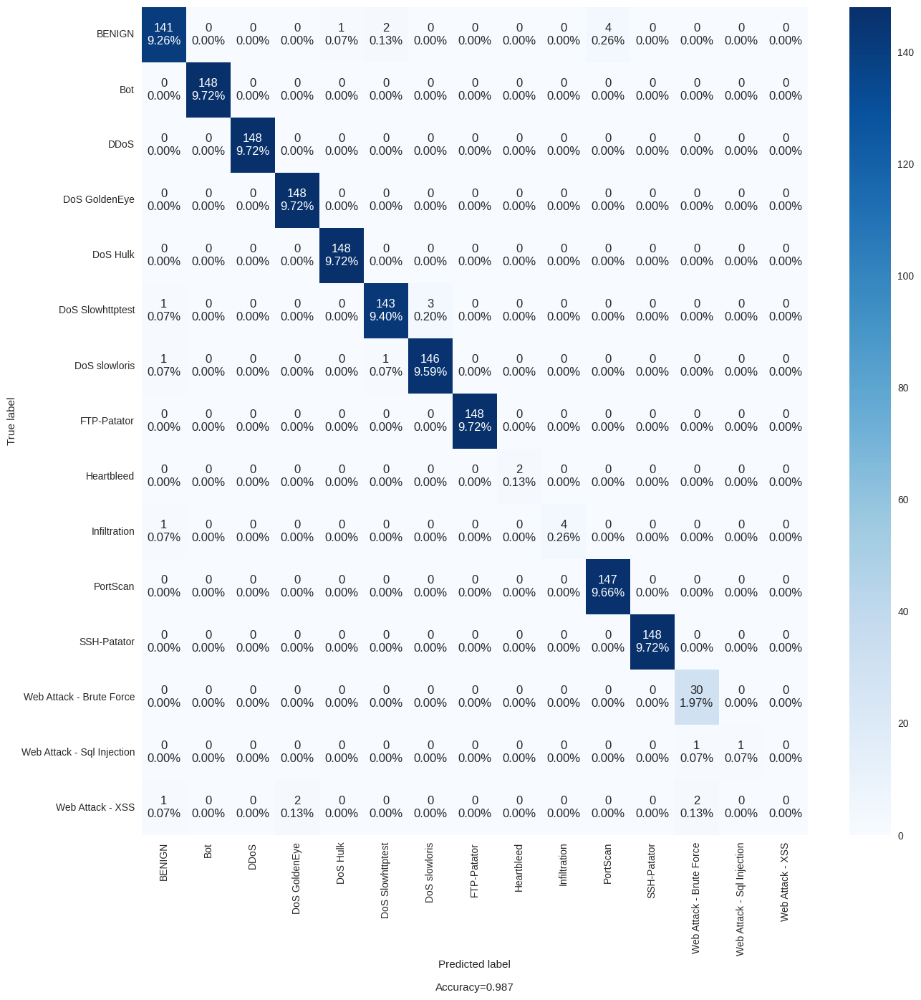

In [69]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))